<a href="https://colab.research.google.com/github/rajeshkpandey/AWESOME-FER/blob/master/Epidemics_ABM_Simple_low.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

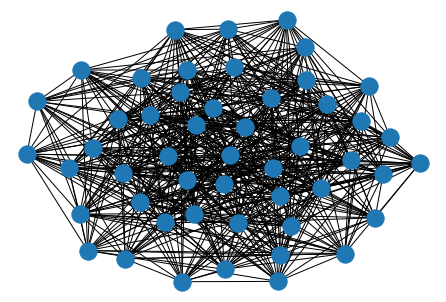

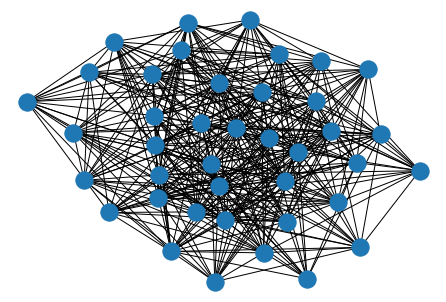

In [1]:
#Erdos-Renyi Graph in Networkx
import random
import copy
from networkx import nx
import matplotlib.pyplot as plt

N = 50  # 50 Indian Cities
K = 10000  # 10000 Agents(people under observation on SIR modeling)
#M = 30  # 30 Edges
NN = 40 # 50 nodes contact network of Cities


#Graph = nx.gnm_random_graph(N, M)

P = .5 #Probabibilty for Node Connection in random graph
PP = .5
Graph = nx.erdos_renyi_graph(N,P) # Use Networkx to generate a random graph of N nodes being connected with probability P.
GraphN = nx.erdos_renyi_graph(NN,PP)


# some network properties
#print("the adjacency list")
#for line in nx.generate_adjlist(Graph):
#    print(line)

nx.draw(Graph)
plt.show()
nx.draw(GraphN)
plt.show()

In [2]:
#!jupyter notebook --generate-config

In [3]:
#%%writefile /root/.jupyter/jupyter_notebook_config.py
#NotebookApp.iopub_data_rate_limit =
#NotebookApp.rate_limit_window =

In [4]:
#%pycat /root/.jupyter/jupyter_notebook_config.py

In [5]:
A = nx.adjacency_matrix(Graph)
Adjacency_matrix = A.todense()
AN = nx.adjacency_matrix(GraphN)
Adjacency_matrixN = AN.todense()
print(Adjacency_matrix)
print(Adjacency_matrixN)

[[0 1 0 ... 1 1 0]
 [1 0 0 ... 1 0 1]
 [0 0 0 ... 0 0 1]
 ...
 [1 1 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]
 [0 1 1 ... 0 0 0]]
[[0 0 0 ... 1 1 1]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 1 1 0]
 ...
 [1 0 1 ... 0 0 1]
 [1 0 1 ... 0 0 1]
 [1 0 0 ... 1 1 0]]


In [6]:
#Empty Node Dictionary [ A Dictionary consisting list of agent states on Graph Nodes]
Node = {}
print(Node)
for i in range(N):
  for j in range(NN):
    Node[i*NN+j] = list()
#print(Node)
print(len(Node))


{}
2000


In [7]:
#Adding Viral_Index Randomly
for i in range(N):
  for j in range(NN):
    Viral_load=0
    Node[i*NN+j].append({'Viral_load' : Viral_load})
    Node[i*NN+j].append({'S' : 0})
    Node[i*NN+j].append({'I' : 0})
    Node[i*NN+j].append({'R' : 0})
#print(Node)
print(len(Node))


2000


In [8]:
#Initailizing randomly infection state [0 shows Susceptible, 1 shows Infected, and 2 shows Recovered]
Agent = {}
for k in range(K):
  Agent[k] = list() 
for k in range(K):
  Rand_node=random.randint(0,N-1)
  Neighbors = list(Graph.neighbors(Rand_node))
  Rand_nodeN=random.randint(0,NN-1)
  First_nodeN = random.randint(0,NN-1)
  Second_nodeN = random.randint(0,NN-1)
  Rand_state=random.choices([0,1],weights=(98,2),k=1)[0]
  Rand_neighbors = list(GraphN.neighbors(Rand_nodeN))
  Rand_neighbors1 = list(GraphN.neighbors(First_nodeN))
  Rand_neighbors2 = list(GraphN.neighbors(Second_nodeN))
  if len(Rand_neighbors) > 0:
    Rand_nodeN1=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN1)
  else:
    Rand_nodeN1=Rand_nodeN
  
  if len(Rand_neighbors) > 0:
    Rand_nodeN2=random.choice(Rand_neighbors)
    Rand_neighbors.remove(Rand_nodeN2)
    if Rand_nodeN2 not in list(GraphN.neighbors(Rand_nodeN1)):
      Rand_nodeN2=Rand_nodeN1
  else:
    Rand_nodeN2=Rand_nodeN1
  
  if Rand_state == 0:
    Node[Rand_node*NN+Rand_nodeN][1]['S']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
    Agent[k].append({'State' : Rand_state})
  elif Rand_state == 1:
    Node[Rand_node*NN+Rand_nodeN][2]['I']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state, 'V_l' : 1})
    Agent[k].append({'State' : Rand_state, 'V_l' : 1 })
  else:
    Node[Rand_node*NN+Rand_nodeN][3]['R']+=1
    Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
    Agent[k].append({'State' : Rand_state})

  #Node[Rand_node*NN+Rand_nodeN].append({k : Rand_state})
  #Agent[k].append({'State' : Rand_state})
  Agent[k].append({'Home_node' : Rand_node})
  Agent[k].append({'Home_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
  
  if len(Neighbors) > 0:
    First_node = random.choice(Neighbors)
    Neighbors.remove(First_node)
  else:
    First_node = Rand_node
  if len(Neighbors) > 0:
    Second_node = random.choice(Neighbors)
  else:
    Second_node = Rand_node

  if len(Rand_neighbors1) > 0:
    First_nodeN1=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN1)
  else:
    First_nodeN1=First_nodeN
  
  if len(Rand_neighbors1) > 0:
    First_nodeN2=random.choice(Rand_neighbors1)
    Rand_neighbors1.remove(First_nodeN2)
    if First_nodeN2 not in list(GraphN.neighbors(First_nodeN1)):
      First_nodeN2=First_nodeN1
  else:
    First_nodeN2=First_nodeN1

  if len(Rand_neighbors2) > 0:
    Second_nodeN1=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN1)
  else:
    Second_nodeN1=Second_nodeN
  
  if len(Rand_neighbors2) > 0:
    Second_nodeN2=random.choice(Rand_neighbors2)
    Rand_neighbors2.remove(Second_nodeN2)
    if Second_nodeN2 not in list(GraphN.neighbors(Second_nodeN1)):
      Second_nodeN2=Second_nodeN1
  else:
    Second_nodeN2=Second_nodeN1

  Agent[k].append({'First_node' : First_node})
  Agent[k].append({'First_nodeN' : [First_nodeN, First_nodeN1, First_nodeN2]})
  Agent[k].append({'Second_node' : Second_node})
  Agent[k].append({'Second_nodeN' : [Second_nodeN, Second_nodeN1, Second_nodeN2]})
  Agent[k].append({'Current_node' : Rand_node})
  Agent[k].append({'Current_nodeN' : [Rand_nodeN, Rand_nodeN1, Rand_nodeN2]})
#print(Node)
#print(Agent)

In [9]:
print(len(Graph.nodes))
print(len(GraphN.nodes))

50
40


In [10]:
#Random Walk Implementation
def random_walk(Graph=Graph, GraphN=GraphN, Node=Node, Agent=Agent, num_walks=1, num_steps=1):
    walks = list()
    Node_next = {}
    Agent_next = {}
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j] = list() 
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        Node_next[i*len(GraphN.nodes)+j].append({'Viral_load' : copy.deepcopy(Node[i*len(GraphN.nodes)+j][0]['Viral_load'])/2})
        Node_next[i*len(GraphN.nodes)+j].append({'S' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'I' : 0})
        Node_next[i*len(GraphN.nodes)+j].append({'R' : 0})
    for i in range(len(Agent)):
      Agent_next[i] = list()
    Agent_next = copy.deepcopy(Agent)
    count_nomove=0
    count_move_first=0
    count_move_second=0
    count_stay_home=0
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        for agent in list(range(4,len(Node[i*len(GraphN.nodes)+j]))):
          a_id = list(Node[i*len(GraphN.nodes)+j][agent].keys())[0]
          #print(a_id)
          #print(Agent[a_id])
          for walk in range(num_walks):
              curr_walk = [i*len(GraphN.nodes)+j]
              cur = i*len(GraphN.nodes)+j
              for step in range(num_steps):
                  neighbors = []
                  #if Agent_next[a_id][1]['Home_node'] in Graph.neighbors(Agent_next[a_id][7]['Current_node']):
                  neighbors.append(Agent_next[a_id][1]['Home_node'])
                  #if Agent_next[a_id][3]['First_node'] in Graph.neighbors(Agent_next[a_id][7]['Current_node']):
                  neighbors.append(Agent[a_id][3]['First_node'])
                  #if Agent_next[a_id][5]['Second_node'] in Graph.neighbors(Agent_next[a_id][7]['Current_node']) :
                  neighbors.append(Agent_next[a_id][5]['Second_node'])

                  if len(neighbors) > 0:
                      if len(neighbors) == 3:
                        PN=(1/(Node[cur][2]['I'] + 1))
                        P = 100-PN 
                        #print(P)
                        #print(PN)
                        next = random.choices(neighbors,weights=(P,PN/2,PN/2), k=1)[0] 
                      elif len(neighbors) == 2:
                        next = random.choices(neighbors,weights=(P,PN), k=1)[0]
                      else:
                        next = random.choices(neighbors,weights=(100), k=1)[0]
                      #next = random.choice(neighbors)
                      if next == Agent_next[a_id][7]['Current_node']:
                        #print("no movement")
                        count_nomove+=1

                      else:
                        if next == Agent_next[a_id][3]['First_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][3]['First_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][4]['First_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][4]['First_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][4]['First_nodeN'][2]
                          count_move_first+=1
                        elif next == Agent_next[a_id][5]['Second_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][5]['Second_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][6]['Second_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][6]['Second_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][6]['Second_nodeN'][2]
                          count_move_second+=1
                        elif next == Agent_next[a_id][1]['Home_node']:
                          Agent_next[a_id][7]['Current_node'] = Agent_next[a_id][1]['Home_node']
                          Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][2]['Home_nodeN'][0]
                          Agent_next[a_id][8]['Current_nodeN'][1] = Agent_next[a_id][2]['Home_nodeN'][1]
                          Agent_next[a_id][8]['Current_nodeN'][2] = Agent_next[a_id][2]['Home_nodeN'][2]
                          count_stay_home+=1
                      PN1=(1/(Node[cur][2]['I'] + 1))
                      P1 = 100-PN1  
                      nextn = random.choices(Agent_next[a_id][8]['Current_nodeN'],weights=(P1,PN1/2,PN1/2),k=1)[0]
                      if nextn == Agent_next[a_id][8]['Current_nodeN'][1]:
                        Agent_next[a_id][8]['Current_nodeN'][1],Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][8]['Current_nodeN'][0],Agent_next[a_id][8]['Current_nodeN'][1]
                      elif nextn == Agent_next[a_id][8]['Current_nodeN'][2] :
                        Agent_next[a_id][8]['Current_nodeN'][2],Agent_next[a_id][8]['Current_nodeN'][0] = Agent_next[a_id][8]['Current_nodeN'][0],Agent_next[a_id][8]['Current_nodeN'][2]
                      else:
                        Agent_next[a_id][8]['Current_nodeN'][0]=Agent_next[a_id][8]['Current_nodeN'][0]                      
                  nex = next*len(GraphN.nodes)+nextn
          Node_next[nex].append(copy.deepcopy(Node[cur][agent]))
          if Node[cur][agent][a_id] == 0:
            Node_next[nex][1]['S']+=1
          elif Node[cur][agent][a_id] == 1:
            Node_next[nex][2]['I']+=1
            Node_next[nex][-1]['V_l']/=2
            Node_next[nex][0]['Viral_load']+=1
            if nex != cur:
              Node_next[cur][0]['Viral_load']+=1
          elif Node[cur][agent][a_id] == 2:
            Node_next[nex][3]['R']+=1

          curr_walk.append(nex)
          #print(Agent[a_id])
          #print(curr_walk)
          walks.append(nex)
    #print(Node_next)
    #print(Agent_next)

    #State-transition-logic
    for i in range(len(Graph.nodes)):
      for j in range(len(GraphN.nodes)):
        count_SI=0
        count_IR=0
        W1 = Node_next[i*len(GraphN.nodes)+j][2]['I'] + Node_next[i*len(GraphN.nodes)+j][0]['Viral_load']
        W2 = Node_next[i*len(GraphN.nodes)+j][1]['S'] + Node_next[i*len(GraphN.nodes)+j][3]['R'] - 1
        for agent in list(range(4,len(Node_next[i*len(GraphN.nodes)+j]))):
          a_id = list(Node_next[i*len(GraphN.nodes)+j][agent].keys())[0]
          if Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 0:
            Node_next[i*len(GraphN.nodes)+j][agent][a_id] = random.choices([1,0], weights=(W1,W2), k=1)[0] 
            if Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 1:
              count_SI+=1
              Node_next[i*len(GraphN.nodes)+j][agent].update({'V_l' : 1})
              Agent_next[a_id][0]['State'] = 1
          elif Node_next[i*len(GraphN.nodes)+j][agent][a_id] == 1:
            if Node_next[i*len(GraphN.nodes)+j][agent]['V_l'] < .01:
              Node_next[i*len(GraphN.nodes)+j][agent][a_id] = 2
              count_IR+=1
              Agent_next[a_id][0]['State'] = 2
              Node_next[i*len(GraphN.nodes)+j][agent].pop('V_l') 
        Node_next[i*len(GraphN.nodes)+j][1]['S']-=count_SI
        Node_next[i*len(GraphN.nodes)+j][2]['I']+=(count_SI - count_IR)
        Node_next[i*len(GraphN.nodes)+j][3]['R']+=count_IR 
         
    #print("count_no_movements",count_nomove)
    #print("count_movements_firstnode",count_move_first)
    #print("count_movements_secondnode",count_move_second)
    #print("count_stay_homenode",count_stay_home)  
    return Node,Node_next,Agent,Agent_next

In [11]:
def Count_SIR_Node(Node=Node):
  count_S=0
  count_I=0
  count_R=0
  for i in range(len(Node)):
    count_S+=Node[i][1]['S'] 
    count_I+=Node[i][2]['I']
    count_R+=Node[i][3]['R'] 
  return count_S,count_I,count_R

In [12]:
def Count_SIR_Agent(Agent=Agent):
  count_S=0
  count_I=0
  count_R=0
  for i in range(len(Agent)):
    if Agent[i][0]['State'] == 0:
      count_S+=1
    elif Agent[i][0]['State'] == 1:
      count_I+=1
    elif Agent[i][0]['State'] == 2:
      count_R+=1
  return count_S,count_I,count_R 

[9806, 9515, 9140, 8897, 8803, 8738, 8666, 8595, 8522, 8450, 8380, 8301, 8229, 8203, 8183, 8150, 8117, 8085, 8054, 8026, 8002, 7977, 7958, 7942, 7933, 7923, 7915, 7904, 7895, 7886, 7871, 7856, 7853, 7847, 7841, 7830, 7820, 7810, 7807, 7806, 7801, 7794, 7791, 7786, 7784, 7782, 7781, 7778, 7774, 7772, 7767, 7765, 7762, 7760, 7757, 7756, 7755, 7755, 7753, 7752, 7752, 7752, 7752, 7752, 7752, 7752, 7752]
[194, 485, 860, 1103, 1197, 1262, 1334, 1211, 993, 690, 517, 502, 509, 463, 412, 372, 333, 295, 247, 203, 201, 206, 192, 175, 152, 131, 111, 98, 82, 72, 71, 77, 70, 68, 63, 65, 66, 61, 49, 47, 46, 47, 39, 34, 26, 25, 25, 23, 20, 19, 19, 19, 20, 21, 21, 18, 17, 12, 12, 10, 8, 5, 4, 3, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 485, 860, 1103, 1197, 1262, 1334, 1405, 1478, 1550, 1620, 1699, 1771, 1797, 1817, 1850, 1883, 1915, 1946, 1974, 1998, 2023, 2042, 2058, 2067, 2077, 2085, 2096, 2105, 2114, 2129, 2144, 2147, 2153, 2159, 2170, 2180, 2190, 2193, 2194, 2199, 2206, 2209, 2214, 2216, 2218, 2219, 22

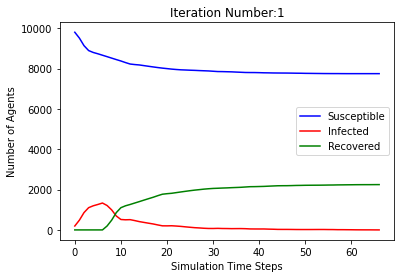

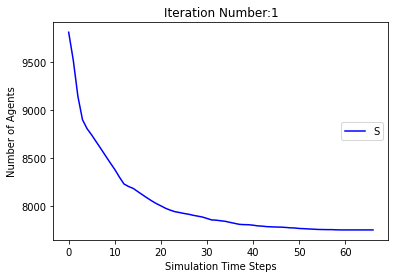

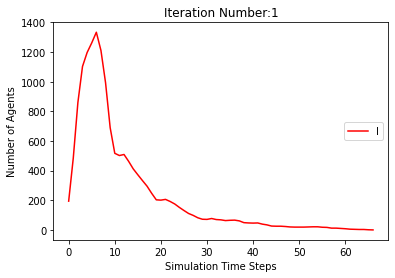

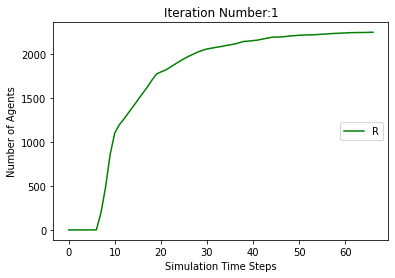

[9806, 9520, 9146, 8898, 8802, 8729, 8661, 8584, 8513, 8439, 8362, 8298, 8231, 8175, 8116, 8073, 8035, 8004, 7977, 7960, 7939, 7918, 7893, 7875, 7858, 7841, 7822, 7812, 7803, 7798, 7791, 7787, 7780, 7774, 7772, 7767, 7765, 7760, 7756, 7753, 7751, 7748, 7744, 7740, 7737, 7735, 7735, 7734, 7731, 7731, 7731, 7731, 7729, 7728, 7725, 7724, 7722, 7720, 7719, 7719, 7719, 7718, 7718, 7718, 7718, 7718, 7718, 7718, 7718]
[194, 480, 854, 1102, 1198, 1271, 1339, 1222, 1007, 707, 536, 504, 498, 486, 468, 440, 404, 358, 321, 271, 236, 198, 180, 160, 146, 136, 138, 127, 115, 95, 84, 71, 61, 48, 40, 36, 33, 31, 31, 27, 23, 24, 23, 25, 23, 21, 18, 17, 17, 13, 9, 6, 6, 7, 9, 7, 9, 11, 12, 10, 9, 7, 6, 4, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 480, 854, 1102, 1198, 1271, 1339, 1416, 1487, 1561, 1638, 1702, 1769, 1825, 1884, 1927, 1965, 1996, 2023, 2040, 2061, 2082, 2107, 2125, 2142, 2159, 2178, 2188, 2197, 2202, 2209, 2213, 2220, 2226, 2228, 2233, 2235, 2240, 2244, 2247, 2249, 2252, 2256, 2260, 2263, 

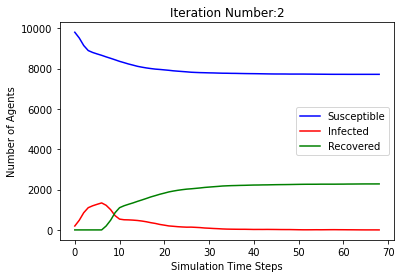

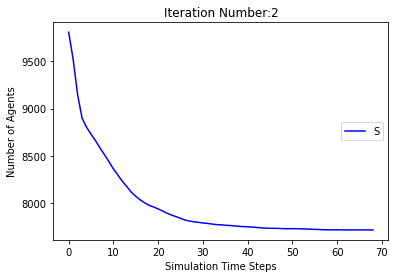

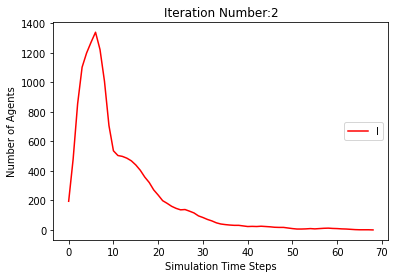

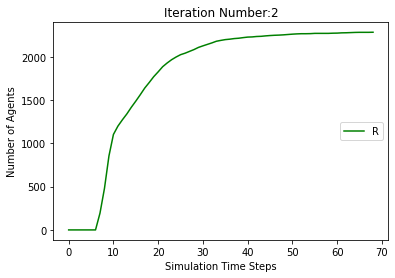

[9806, 9484, 9090, 8875, 8764, 8685, 8614, 8544, 8496, 8430, 8371, 8314, 8258, 8208, 8162, 8127, 8098, 8063, 8040, 8021, 8003, 7993, 7985, 7979, 7973, 7966, 7956, 7943, 7941, 7934, 7925, 7919, 7917, 7915, 7913, 7907, 7903, 7892, 7882, 7877, 7875, 7875, 7873, 7870, 7861, 7856, 7853, 7849, 7845, 7840, 7835, 7833, 7833, 7832, 7829, 7828, 7827, 7827, 7826, 7825, 7825, 7823, 7823, 7821, 7821, 7821, 7821, 7821, 7821, 7821, 7821]
[194, 516, 910, 1125, 1236, 1315, 1386, 1262, 988, 660, 504, 450, 427, 406, 382, 369, 332, 308, 274, 237, 205, 169, 142, 119, 90, 74, 65, 60, 52, 51, 54, 54, 49, 41, 30, 34, 31, 33, 37, 40, 40, 38, 34, 33, 31, 26, 24, 26, 30, 33, 35, 28, 23, 21, 20, 17, 13, 8, 7, 8, 7, 6, 5, 6, 6, 5, 4, 4, 2, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 516, 910, 1125, 1236, 1315, 1386, 1456, 1504, 1570, 1629, 1686, 1742, 1792, 1838, 1873, 1902, 1937, 1960, 1979, 1997, 2007, 2015, 2021, 2027, 2034, 2044, 2057, 2059, 2066, 2075, 2081, 2083, 2085, 2087, 2093, 2097, 2108, 2118, 2123, 2125, 2125, 21

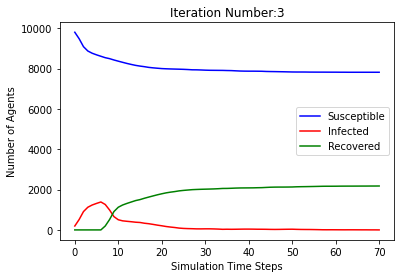

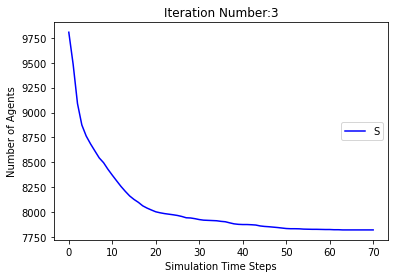

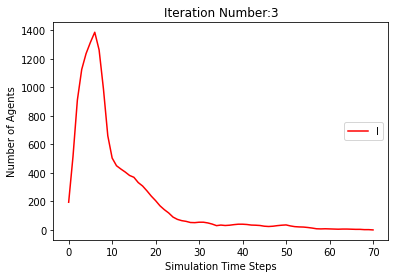

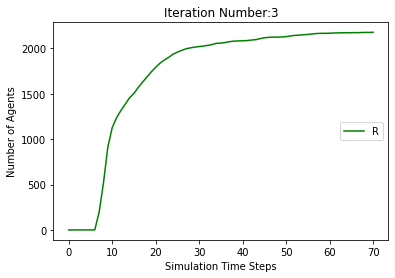

[9806, 9490, 9113, 8899, 8789, 8694, 8606, 8533, 8481, 8404, 8326, 8259, 8202, 8156, 8126, 8096, 8061, 8018, 7980, 7945, 7918, 7894, 7871, 7851, 7843, 7831, 7815, 7801, 7792, 7783, 7775, 7765, 7755, 7749, 7741, 7738, 7731, 7718, 7701, 7693, 7680, 7677, 7673, 7669, 7668, 7664, 7664, 7664, 7663, 7662, 7660, 7660, 7660, 7659, 7659, 7658, 7658, 7658, 7657, 7656, 7656, 7654, 7654, 7654, 7654, 7654, 7653, 7652, 7650, 7648, 7647, 7647, 7647, 7647, 7647, 7646, 7646, 7646, 7645, 7643, 7641, 7640, 7638, 7638, 7637, 7635, 7632, 7629, 7628, 7627, 7625, 7619, 7614, 7613, 7611, 7606, 7604, 7603, 7598, 7597, 7594, 7593, 7593, 7593, 7592, 7592, 7592, 7592, 7592, 7592, 7592, 7591, 7588, 7586, 7586, 7586, 7586, 7586, 7586, 7586, 7586]
[194, 510, 887, 1101, 1211, 1306, 1394, 1273, 1009, 709, 573, 530, 492, 450, 407, 385, 343, 308, 279, 257, 238, 232, 225, 210, 175, 149, 130, 117, 102, 88, 76, 78, 76, 66, 60, 54, 52, 57, 64, 62, 69, 64, 65, 62, 50, 37, 29, 16, 14, 11, 9, 8, 4, 5, 5, 5, 4, 2, 3, 4, 3, 5, 4

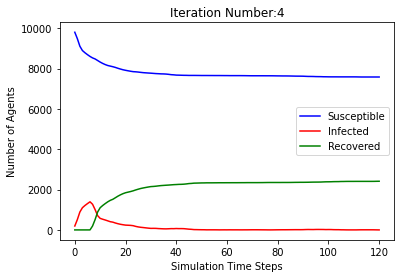

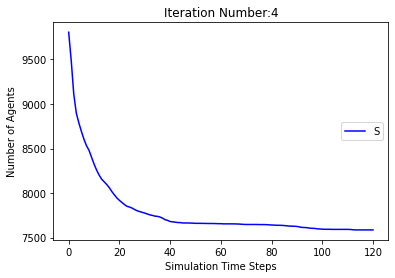

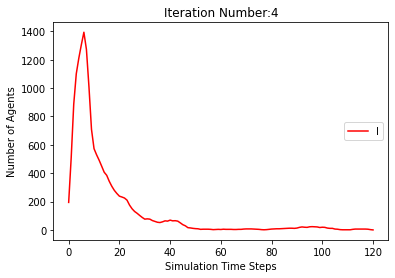

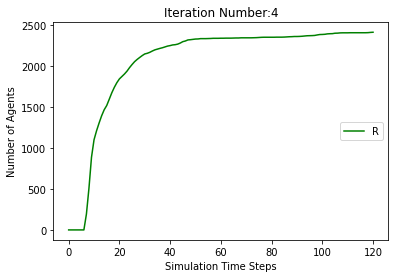

[9806, 9494, 9109, 8905, 8814, 8754, 8690, 8611, 8534, 8472, 8398, 8328, 8262, 8181, 8133, 8086, 8040, 7995, 7952, 7914, 7881, 7842, 7808, 7783, 7765, 7740, 7728, 7713, 7702, 7686, 7670, 7660, 7655, 7643, 7631, 7617, 7610, 7601, 7595, 7590, 7585, 7577, 7573, 7570, 7566, 7565, 7565, 7565, 7563, 7562, 7560, 7555, 7553, 7553, 7551, 7550, 7549, 7547, 7547, 7547, 7547, 7546, 7546, 7546, 7546, 7545, 7544, 7542, 7540, 7539, 7538, 7538, 7538, 7538, 7538, 7538, 7538, 7538]
[194, 506, 891, 1095, 1186, 1246, 1310, 1195, 960, 637, 507, 486, 492, 509, 478, 448, 432, 403, 376, 348, 300, 291, 278, 257, 230, 212, 186, 168, 140, 122, 113, 105, 85, 85, 82, 85, 76, 69, 65, 65, 58, 54, 44, 40, 35, 30, 25, 20, 14, 11, 10, 11, 12, 12, 14, 13, 13, 13, 8, 6, 6, 5, 4, 3, 1, 2, 3, 5, 6, 7, 8, 8, 7, 6, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 506, 891, 1095, 1186, 1246, 1310, 1389, 1466, 1528, 1602, 1672, 1738, 1819, 1867, 1914, 1960, 2005, 2048, 2086, 2119, 2158, 2192, 2217, 2235, 2260, 2272, 2287, 2298, 2314, 23

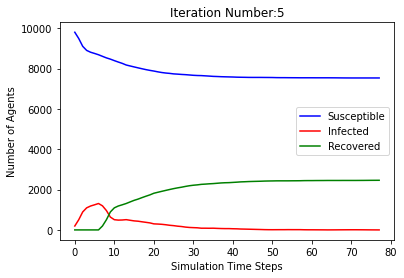

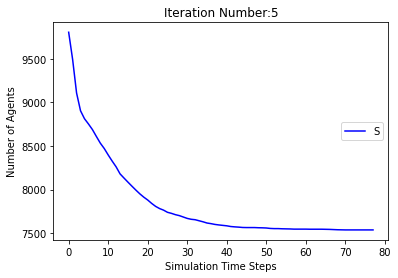

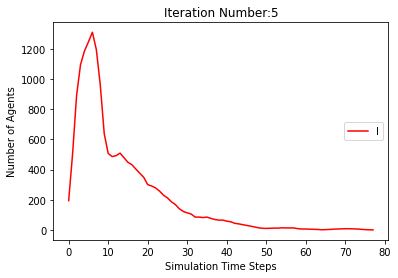

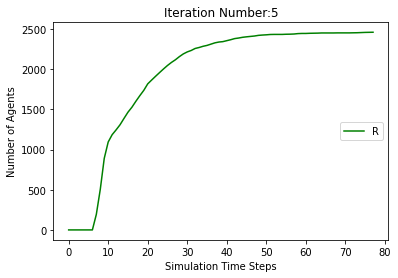

[9806, 9490, 9119, 8907, 8813, 8756, 8708, 8655, 8596, 8536, 8470, 8407, 8355, 8312, 8274, 8232, 8185, 8139, 8109, 8076, 8044, 8023, 8005, 7994, 7984, 7977, 7969, 7964, 7954, 7941, 7935, 7928, 7922, 7911, 7895, 7886, 7875, 7867, 7864, 7861, 7859, 7856, 7855, 7850, 7848, 7845, 7840, 7834, 7832, 7828, 7826, 7823, 7821, 7817, 7811, 7811, 7809, 7808, 7808, 7808, 7807, 7806, 7805, 7803, 7801, 7800, 7800, 7797, 7795, 7794, 7792, 7788, 7783, 7781, 7781, 7780, 7779, 7779, 7776, 7773, 7772, 7771, 7770, 7765, 7765, 7765, 7765, 7762, 7759, 7758, 7757, 7755, 7754, 7753, 7751, 7751, 7748, 7746, 7744, 7743, 7742, 7742, 7742, 7740, 7739, 7734, 7732, 7731, 7729, 7729, 7729, 7729, 7729, 7728, 7728, 7728, 7727, 7724, 7723, 7722, 7722, 7722, 7721, 7721, 7720, 7720, 7720, 7718, 7714, 7714, 7714, 7714, 7714, 7713, 7713, 7713, 7713, 7713, 7713, 7712, 7712, 7712, 7712, 7711, 7711, 7710, 7710, 7710, 7710, 7710, 7710, 7710, 7709, 7707, 7705, 7702, 7702, 7700, 7700, 7698, 7697, 7694, 7689, 7688, 7683, 7680, 767

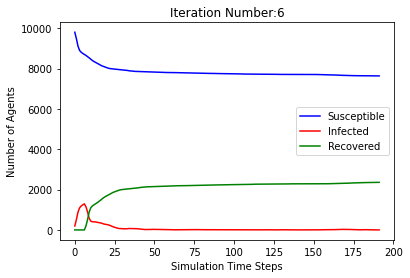

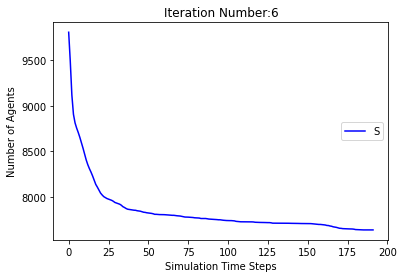

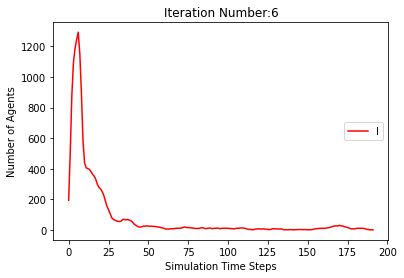

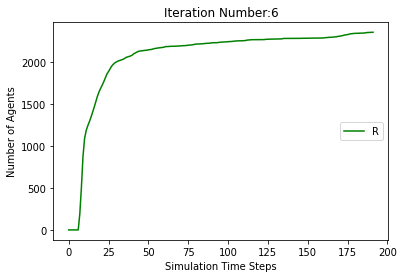

[9806, 9508, 9157, 8885, 8772, 8698, 8627, 8545, 8450, 8378, 8301, 8230, 8166, 8114, 8080, 8043, 8008, 7977, 7952, 7927, 7900, 7884, 7869, 7864, 7856, 7848, 7841, 7832, 7814, 7804, 7790, 7779, 7773, 7763, 7756, 7749, 7742, 7737, 7736, 7735, 7732, 7727, 7719, 7715, 7712, 7708, 7706, 7704, 7703, 7701, 7700, 7700, 7700, 7700, 7700, 7699, 7699, 7698, 7698, 7698, 7697, 7696, 7696, 7695, 7695, 7695, 7694, 7694, 7692, 7692, 7692, 7692, 7692, 7691, 7691, 7688, 7687, 7687, 7685, 7682, 7679, 7675, 7669, 7664, 7660, 7660, 7657, 7652, 7649, 7648, 7647, 7646, 7645, 7643, 7642, 7641, 7641, 7641, 7641, 7641, 7641, 7641, 7641]
[194, 492, 843, 1115, 1228, 1302, 1373, 1261, 1058, 779, 584, 542, 532, 513, 465, 407, 370, 324, 278, 239, 214, 196, 174, 144, 121, 104, 86, 68, 70, 65, 74, 77, 75, 78, 76, 65, 62, 53, 43, 38, 31, 29, 30, 27, 25, 28, 29, 28, 24, 18, 15, 12, 8, 6, 4, 4, 2, 2, 2, 2, 3, 4, 3, 4, 3, 3, 4, 3, 4, 4, 3, 3, 3, 3, 3, 4, 5, 5, 7, 10, 12, 16, 19, 23, 27, 25, 25, 27, 26, 21, 17, 14, 15, 14,

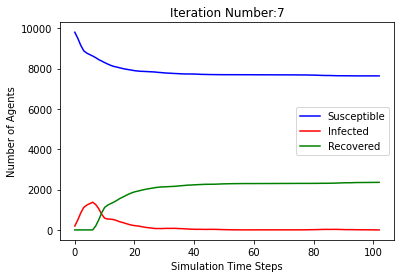

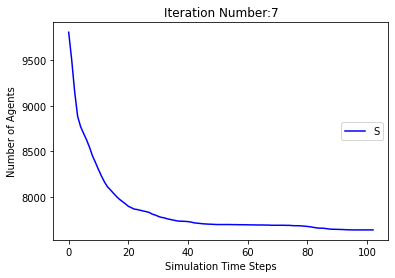

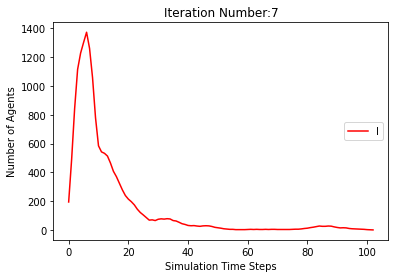

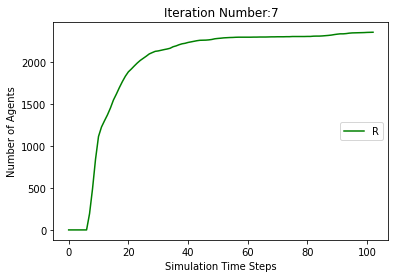

[9806, 9543, 9178, 8931, 8836, 8764, 8697, 8615, 8523, 8414, 8339, 8285, 8213, 8152, 8082, 8030, 7981, 7952, 7921, 7874, 7841, 7813, 7787, 7772, 7760, 7744, 7726, 7711, 7692, 7662, 7643, 7635, 7624, 7611, 7594, 7583, 7570, 7562, 7556, 7547, 7539, 7530, 7513, 7505, 7495, 7488, 7487, 7485, 7484, 7481, 7480, 7475, 7472, 7469, 7469, 7468, 7465, 7460, 7452, 7447, 7445, 7445, 7445, 7445, 7443, 7440, 7439, 7439, 7439, 7439, 7438, 7438, 7438, 7438, 7438, 7438, 7438, 7437, 7436, 7436, 7436, 7436, 7436, 7435, 7435, 7435, 7435, 7434, 7433, 7433, 7433, 7432, 7432, 7432, 7432, 7431, 7431, 7431, 7431, 7431, 7431, 7431, 7431]
[194, 457, 822, 1069, 1164, 1236, 1303, 1191, 1020, 764, 592, 551, 551, 545, 533, 493, 433, 387, 364, 339, 311, 269, 243, 209, 192, 177, 148, 130, 121, 125, 129, 125, 120, 115, 117, 109, 92, 81, 79, 77, 72, 64, 70, 65, 67, 68, 60, 54, 46, 32, 25, 20, 16, 18, 16, 16, 16, 20, 23, 25, 24, 24, 23, 20, 17, 12, 8, 6, 6, 6, 7, 5, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 3, 2, 1, 1, 2, 3, 3, 2,

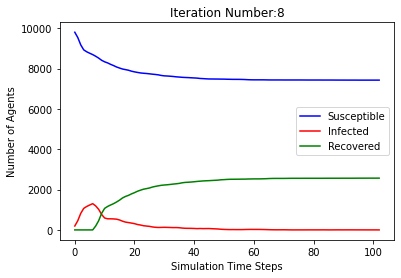

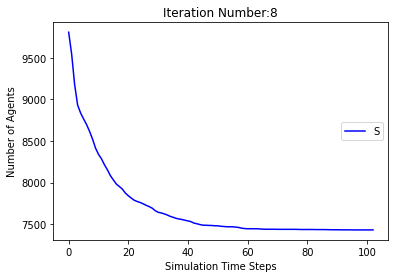

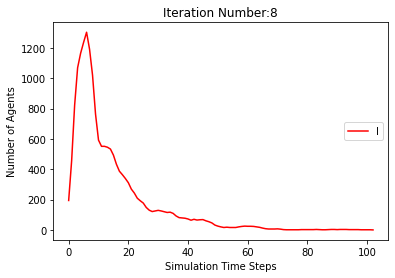

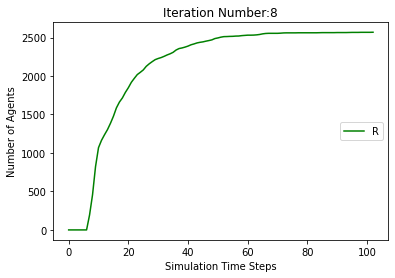

[9806, 9512, 9141, 8911, 8824, 8775, 8725, 8653, 8576, 8510, 8462, 8427, 8382, 8346, 8319, 8288, 8261, 8228, 8204, 8178, 8162, 8155, 8144, 8133, 8123, 8112, 8101, 8096, 8090, 8086, 8079, 8075, 8071, 8065, 8062, 8056, 8046, 8039, 8034, 8033, 8032, 8029, 8027, 8020, 8012, 8008, 8004, 8003, 8003, 8003, 8003, 8003, 8003, 8003, 8003]
[194, 488, 859, 1089, 1176, 1225, 1275, 1153, 936, 631, 449, 397, 393, 379, 334, 288, 249, 234, 223, 204, 184, 164, 144, 128, 105, 92, 77, 66, 65, 58, 54, 48, 41, 36, 34, 34, 40, 40, 41, 38, 33, 33, 29, 26, 27, 26, 29, 29, 26, 24, 17, 9, 5, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 488, 859, 1089, 1176, 1225, 1275, 1347, 1424, 1490, 1538, 1573, 1618, 1654, 1681, 1712, 1739, 1772, 1796, 1822, 1838, 1845, 1856, 1867, 1877, 1888, 1899, 1904, 1910, 1914, 1921, 1925, 1929, 1935, 1938, 1944, 1954, 1961, 1966, 1967, 1968, 1971, 1973, 1980, 1988, 1992, 1996, 1997]
[[], [9806, 9515, 9140, 8897, 8803, 8738, 8666, 8595, 8522, 8450, 8380, 8301, 8229, 8203, 8183, 8150, 8117, 8085, 8

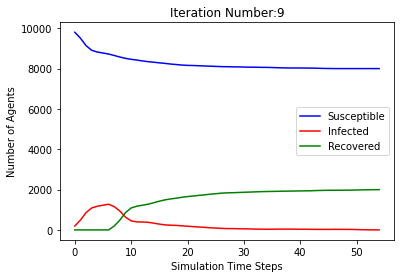

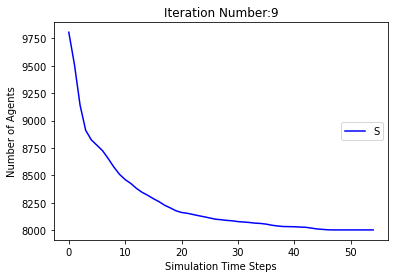

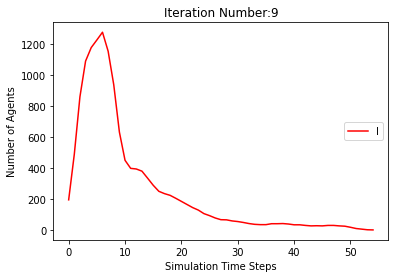

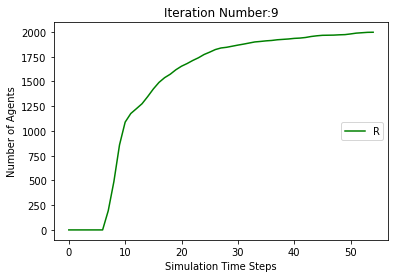

[9806, 9491, 9130, 8899, 8797, 8719, 8639, 8550, 8460, 8376, 8286, 8229, 8186, 8130, 8082, 8051, 8006, 7967, 7940, 7924, 7902, 7880, 7862, 7846, 7827, 7814, 7805, 7791, 7780, 7774, 7761, 7750, 7741, 7735, 7728, 7721, 7715, 7712, 7710, 7707, 7704, 7700, 7698, 7697, 7695, 7692, 7688, 7687, 7684, 7683, 7680, 7680, 7680, 7680, 7680, 7679, 7679, 7679, 7679, 7678, 7677, 7675, 7675, 7675, 7675, 7675, 7675, 7675, 7675]
[194, 509, 870, 1101, 1203, 1281, 1361, 1256, 1031, 754, 613, 568, 533, 509, 468, 409, 370, 319, 289, 262, 228, 202, 189, 160, 140, 126, 119, 111, 100, 88, 85, 77, 73, 70, 63, 59, 59, 49, 40, 34, 31, 28, 23, 18, 17, 18, 19, 17, 16, 15, 17, 15, 12, 8, 7, 5, 4, 1, 1, 2, 3, 5, 4, 4, 4, 4, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 509, 870, 1101, 1203, 1281, 1361, 1450, 1540, 1624, 1714, 1771, 1814, 1870, 1918, 1949, 1994, 2033, 2060, 2076, 2098, 2120, 2138, 2154, 2173, 2186, 2195, 2209, 2220, 2226, 2239, 2250, 2259, 2265, 2272, 2279, 2285, 2288, 2290, 2293, 2296, 2300, 2302, 2303, 2305, 

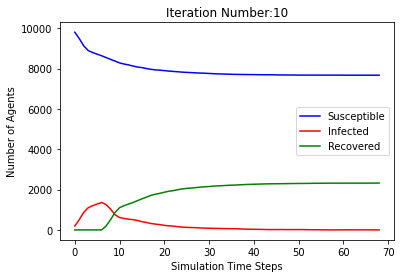

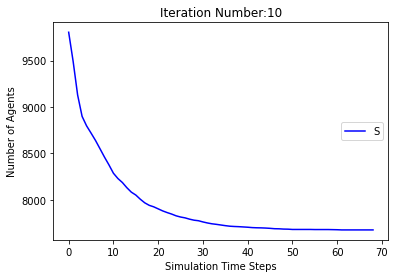

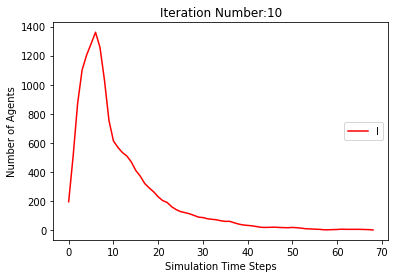

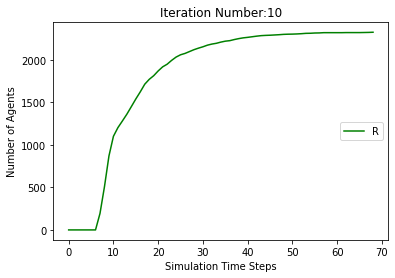

[9806, 9514, 9146, 8918, 8821, 8736, 8640, 8566, 8485, 8407, 8326, 8239, 8167, 8091, 8025, 7978, 7940, 7902, 7868, 7824, 7796, 7774, 7756, 7741, 7724, 7709, 7693, 7672, 7653, 7635, 7624, 7617, 7610, 7597, 7583, 7572, 7562, 7554, 7549, 7545, 7543, 7539, 7536, 7532, 7529, 7525, 7525, 7522, 7519, 7517, 7514, 7513, 7512, 7511, 7511, 7510, 7509, 7509, 7504, 7503, 7503, 7503, 7503, 7503, 7503, 7502, 7500, 7496, 7496, 7495, 7494, 7494, 7494, 7494, 7494, 7494, 7494, 7494]
[194, 486, 854, 1082, 1179, 1264, 1360, 1240, 1029, 739, 592, 582, 569, 549, 541, 507, 467, 424, 371, 343, 295, 251, 222, 199, 178, 159, 131, 124, 121, 121, 117, 107, 99, 96, 89, 81, 73, 70, 68, 65, 54, 44, 36, 30, 25, 24, 20, 21, 20, 19, 18, 16, 13, 14, 11, 9, 8, 5, 9, 9, 8, 8, 7, 6, 6, 2, 3, 7, 7, 8, 9, 9, 8, 6, 2, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 486, 854, 1082, 1179, 1264, 1360, 1434, 1515, 1593, 1674, 1761, 1833, 1909, 1975, 2022, 2060, 2098, 2132, 2176, 2204, 2226, 2244, 2259, 2276, 2291, 2307, 2328, 2347, 2365, 2376

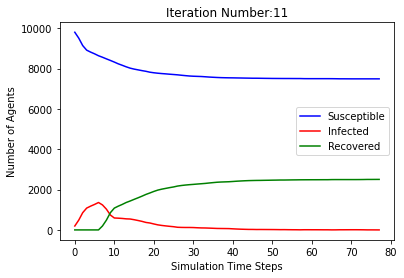

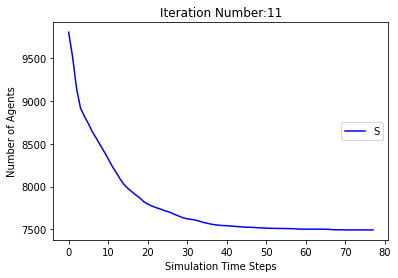

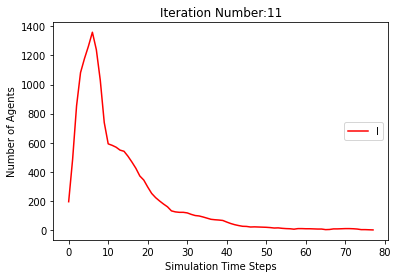

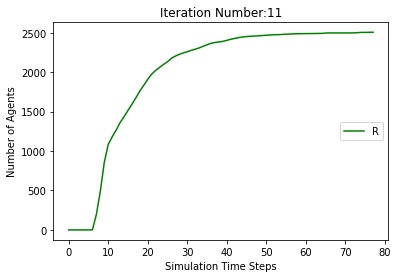

[9806, 9501, 9118, 8882, 8770, 8708, 8627, 8539, 8450, 8347, 8268, 8214, 8152, 8096, 8034, 7984, 7929, 7886, 7850, 7821, 7799, 7779, 7760, 7735, 7717, 7702, 7685, 7665, 7651, 7643, 7632, 7620, 7615, 7604, 7588, 7579, 7575, 7574, 7572, 7570, 7567, 7560, 7551, 7544, 7543, 7543, 7543, 7541, 7538, 7536, 7531, 7529, 7526, 7526, 7526, 7526, 7526, 7526, 7526, 7526]
[194, 499, 882, 1118, 1230, 1292, 1373, 1267, 1051, 771, 614, 556, 556, 531, 505, 466, 418, 382, 364, 331, 297, 255, 224, 194, 169, 148, 136, 134, 128, 117, 103, 97, 87, 81, 77, 72, 68, 58, 48, 45, 37, 28, 28, 31, 31, 29, 27, 26, 22, 15, 13, 14, 17, 17, 15, 12, 10, 5, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 499, 882, 1118, 1230, 1292, 1373, 1461, 1550, 1653, 1732, 1786, 1848, 1904, 1966, 2016, 2071, 2114, 2150, 2179, 2201, 2221, 2240, 2265, 2283, 2298, 2315, 2335, 2349, 2357, 2368, 2380, 2385, 2396, 2412, 2421, 2425, 2426, 2428, 2430, 2433, 2440, 2449, 2456, 2457, 2457, 2457, 2459, 2462, 2464, 2469, 2471, 2474]
[[], [9806, 9515, 9140, 889

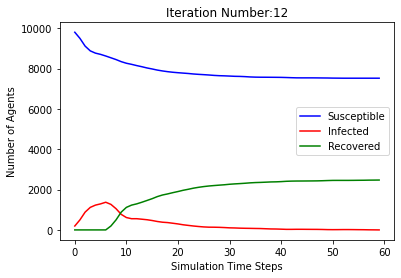

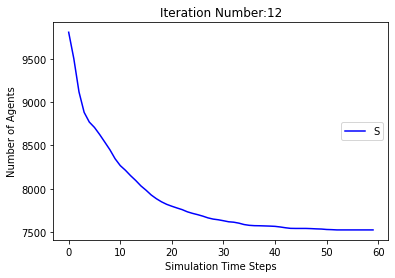

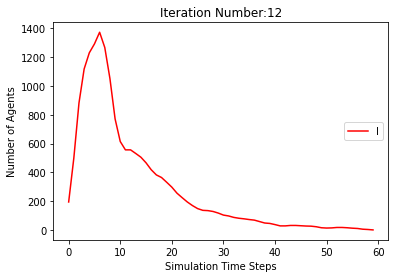

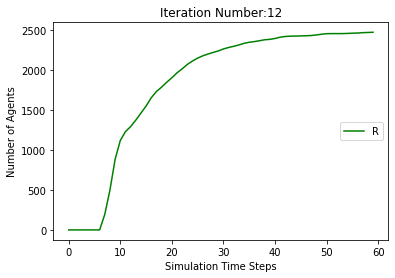

[9806, 9503, 9150, 8906, 8806, 8753, 8692, 8609, 8510, 8432, 8362, 8296, 8231, 8167, 8108, 8044, 7989, 7957, 7920, 7886, 7846, 7812, 7785, 7756, 7737, 7720, 7698, 7689, 7682, 7677, 7671, 7665, 7656, 7647, 7641, 7638, 7636, 7634, 7631, 7627, 7623, 7618, 7614, 7607, 7598, 7595, 7595, 7594, 7594, 7594, 7593, 7591, 7591, 7591, 7590, 7590, 7590, 7590, 7590, 7590, 7590, 7590]
[194, 497, 850, 1094, 1194, 1247, 1308, 1197, 993, 718, 544, 510, 522, 525, 501, 466, 443, 405, 376, 345, 321, 296, 259, 233, 220, 200, 188, 157, 130, 108, 85, 72, 64, 51, 48, 44, 41, 37, 34, 29, 24, 23, 24, 29, 36, 36, 32, 29, 24, 20, 14, 7, 4, 4, 4, 4, 4, 3, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 497, 850, 1094, 1194, 1247, 1308, 1391, 1490, 1568, 1638, 1704, 1769, 1833, 1892, 1956, 2011, 2043, 2080, 2114, 2154, 2188, 2215, 2244, 2263, 2280, 2302, 2311, 2318, 2323, 2329, 2335, 2344, 2353, 2359, 2362, 2364, 2366, 2369, 2373, 2377, 2382, 2386, 2393, 2402, 2405, 2405, 2406, 2406, 2406, 2407, 2409, 2409, 2409, 2410]
[[], 

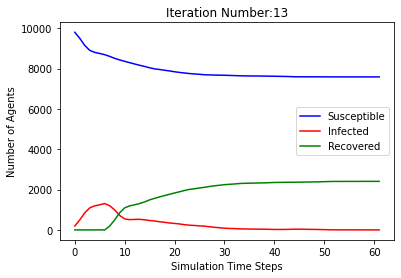

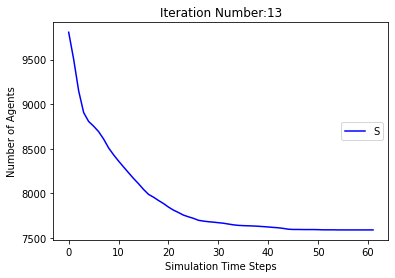

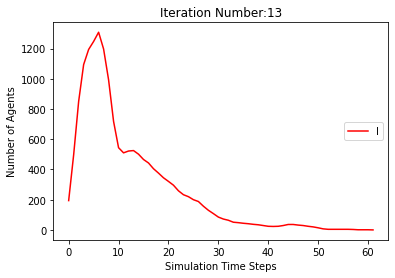

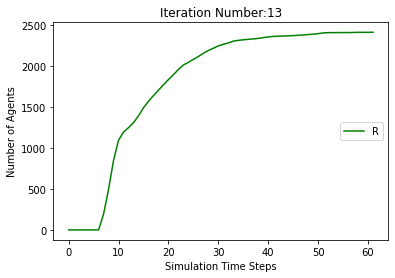

[9806, 9503, 9154, 8924, 8824, 8756, 8694, 8635, 8557, 8469, 8382, 8305, 8248, 8206, 8158, 8112, 8073, 8027, 7983, 7948, 7899, 7864, 7835, 7804, 7774, 7742, 7712, 7690, 7679, 7668, 7652, 7638, 7629, 7623, 7618, 7613, 7604, 7593, 7576, 7555, 7542, 7535, 7531, 7523, 7522, 7522, 7522, 7518, 7517, 7517, 7515, 7513, 7509, 7506, 7506, 7505, 7505, 7504, 7504, 7504, 7504, 7504, 7504, 7504, 7504]
[194, 497, 846, 1076, 1176, 1244, 1306, 1171, 946, 685, 542, 519, 508, 488, 477, 445, 396, 355, 322, 300, 307, 294, 277, 269, 253, 241, 236, 209, 185, 167, 152, 136, 113, 89, 72, 66, 64, 59, 62, 74, 81, 83, 82, 81, 71, 54, 33, 24, 18, 14, 8, 9, 13, 16, 12, 12, 12, 11, 9, 5, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 497, 846, 1076, 1176, 1244, 1306, 1365, 1443, 1531, 1618, 1695, 1752, 1794, 1842, 1888, 1927, 1973, 2017, 2052, 2101, 2136, 2165, 2196, 2226, 2258, 2288, 2310, 2321, 2332, 2348, 2362, 2371, 2377, 2382, 2387, 2396, 2407, 2424, 2445, 2458, 2465, 2469, 2477, 2478, 2478, 2478, 2482, 2483, 2483, 

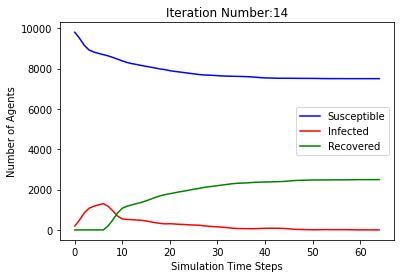

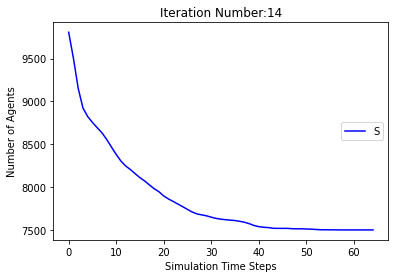

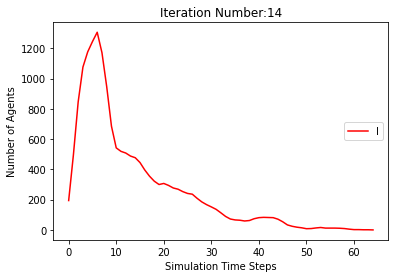

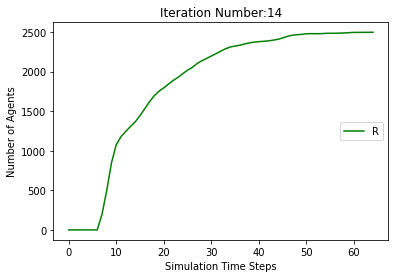

[9806, 9480, 9100, 8873, 8771, 8681, 8582, 8511, 8417, 8332, 8230, 8147, 8095, 8051, 8009, 7964, 7908, 7858, 7812, 7783, 7756, 7731, 7710, 7690, 7663, 7639, 7623, 7613, 7606, 7595, 7589, 7583, 7575, 7566, 7556, 7548, 7545, 7541, 7540, 7532, 7525, 7521, 7521, 7519, 7515, 7512, 7510, 7507, 7502, 7496, 7493, 7490, 7486, 7480, 7477, 7476, 7475, 7471, 7466, 7463, 7462, 7461, 7460, 7456, 7455, 7455, 7454, 7453, 7451, 7446, 7445, 7444, 7444, 7442, 7439, 7437, 7437, 7436, 7436, 7436, 7435, 7433, 7428, 7428, 7426, 7425, 7424, 7424, 7424, 7424, 7424, 7424, 7424, 7424]
[194, 520, 900, 1127, 1229, 1319, 1418, 1295, 1063, 768, 643, 624, 586, 531, 502, 453, 424, 372, 335, 312, 295, 278, 254, 218, 195, 173, 160, 143, 125, 115, 101, 80, 64, 57, 57, 58, 50, 48, 43, 43, 41, 35, 27, 26, 26, 28, 22, 18, 19, 25, 26, 25, 26, 30, 30, 26, 21, 22, 24, 23, 18, 16, 16, 19, 16, 11, 9, 9, 10, 14, 11, 11, 11, 12, 14, 14, 9, 9, 8, 8, 7, 6, 9, 9, 10, 11, 12, 11, 9, 4, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 520, 900, 

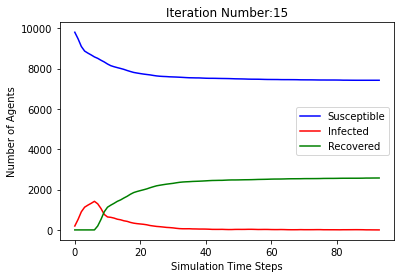

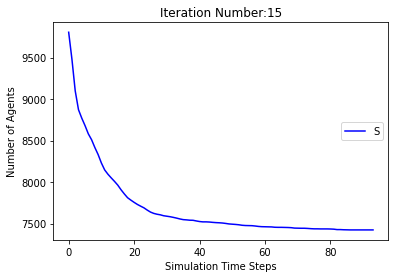

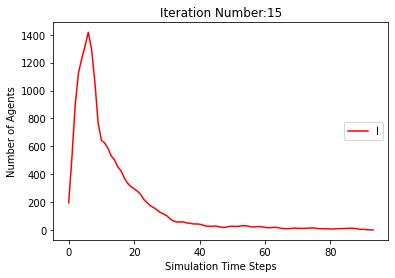

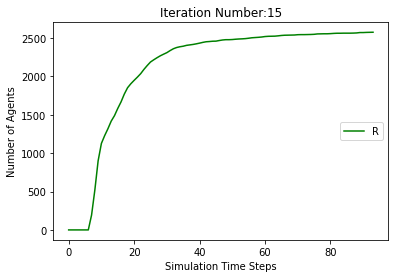

[9806, 9525, 9147, 8908, 8800, 8734, 8689, 8629, 8579, 8525, 8461, 8421, 8375, 8334, 8293, 8249, 8206, 8165, 8128, 8092, 8058, 8042, 8021, 8003, 7993, 7981, 7973, 7968, 7961, 7953, 7951, 7945, 7945, 7943, 7938, 7934, 7933, 7929, 7926, 7923, 7921, 7920, 7920, 7919, 7917, 7914, 7911, 7910, 7910, 7910, 7908, 7906, 7900, 7896, 7894, 7893, 7893, 7893, 7893, 7893, 7890, 7883, 7883, 7883, 7883, 7883, 7883, 7883, 7883]
[194, 475, 853, 1092, 1200, 1266, 1311, 1177, 946, 622, 447, 379, 359, 355, 336, 330, 319, 296, 293, 283, 276, 251, 228, 203, 172, 147, 119, 90, 81, 68, 52, 48, 36, 30, 30, 27, 20, 22, 19, 22, 22, 18, 14, 14, 12, 12, 12, 11, 10, 10, 11, 11, 14, 15, 16, 17, 17, 15, 13, 7, 6, 11, 10, 10, 10, 10, 10, 7, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 475, 853, 1092, 1200, 1266, 1311, 1371, 1421, 1475, 1539, 1579, 1625, 1666, 1707, 1751, 1794, 1835, 1872, 1908, 1942, 1958, 1979, 1997, 2007, 2019, 2027, 2032, 2039, 2047, 2049, 2055, 2055, 2057, 2062, 2066, 2067, 2071, 2074, 2077, 2079, 2080, 2080, 208

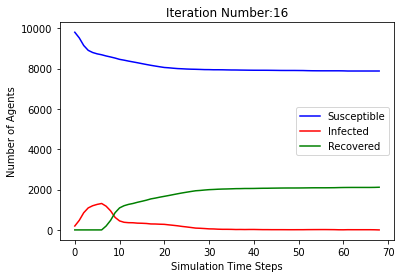

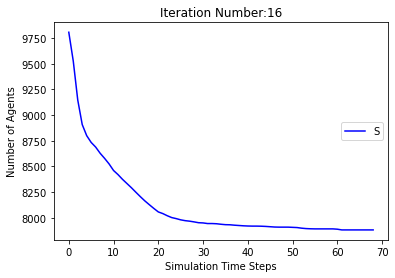

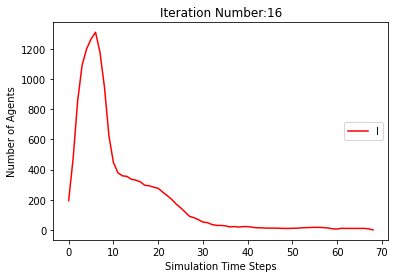

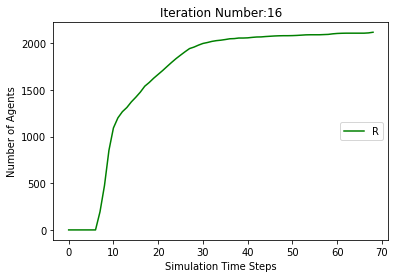

[9806, 9520, 9153, 8910, 8826, 8764, 8685, 8583, 8474, 8372, 8281, 8217, 8156, 8097, 8033, 7973, 7914, 7874, 7845, 7820, 7789, 7766, 7740, 7714, 7687, 7667, 7646, 7632, 7619, 7607, 7601, 7587, 7578, 7565, 7557, 7550, 7541, 7537, 7535, 7531, 7528, 7523, 7521, 7517, 7512, 7503, 7493, 7489, 7487, 7486, 7484, 7482, 7476, 7470, 7462, 7450, 7442, 7438, 7433, 7427, 7421, 7417, 7407, 7404, 7400, 7395, 7394, 7393, 7392, 7391, 7391, 7389, 7388, 7387, 7387, 7386, 7385, 7384, 7382, 7381, 7377, 7375, 7375, 7372, 7370, 7364, 7358, 7350, 7349, 7348, 7347, 7343, 7338, 7334, 7330, 7329, 7325, 7324, 7322, 7319, 7316, 7312, 7310, 7310, 7308, 7305, 7300, 7296, 7290, 7290, 7290, 7290, 7289, 7288, 7287, 7284, 7282, 7281, 7281, 7281, 7280, 7276, 7268, 7264, 7264, 7262, 7261, 7259, 7255, 7249, 7241, 7229, 7225, 7225, 7225, 7225, 7224, 7224, 7223, 7221, 7221, 7220, 7219, 7218, 7217, 7217, 7217, 7216, 7215, 7212, 7210, 7209, 7209, 7209, 7208, 7207, 7206, 7205, 7205, 7205, 7202, 7202, 7199, 7199, 7197, 7192, 719

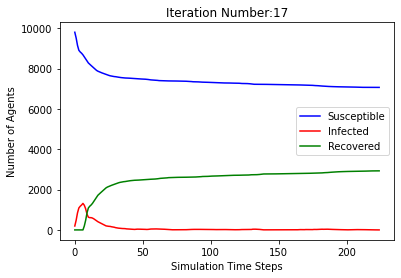

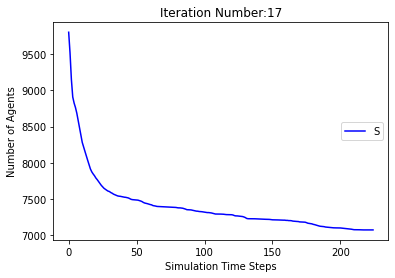

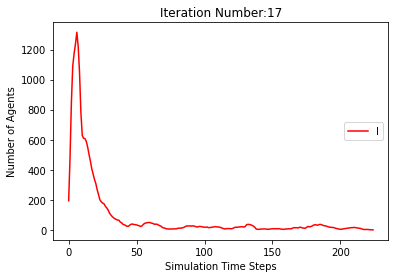

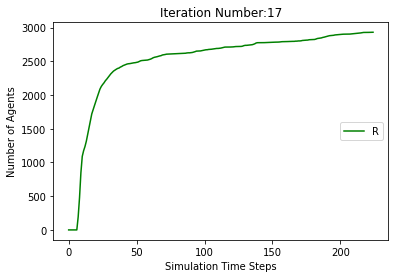

[9806, 9515, 9129, 8900, 8796, 8727, 8663, 8597, 8531, 8472, 8403, 8336, 8286, 8237, 8191, 8151, 8120, 8092, 8054, 8024, 8006, 7982, 7964, 7946, 7928, 7913, 7892, 7883, 7874, 7866, 7858, 7850, 7839, 7827, 7815, 7806, 7798, 7793, 7787, 7778, 7773, 7772, 7771, 7770, 7769, 7768, 7767, 7766, 7766, 7766, 7766, 7766, 7766, 7766, 7766]
[194, 485, 871, 1100, 1204, 1273, 1337, 1209, 984, 657, 497, 460, 441, 426, 406, 380, 352, 311, 282, 262, 231, 209, 187, 174, 164, 141, 132, 123, 108, 98, 88, 78, 74, 65, 68, 68, 68, 65, 63, 61, 54, 43, 35, 28, 24, 19, 11, 7, 6, 5, 4, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 485, 871, 1100, 1204, 1273, 1337, 1403, 1469, 1528, 1597, 1664, 1714, 1763, 1809, 1849, 1880, 1908, 1946, 1976, 1994, 2018, 2036, 2054, 2072, 2087, 2108, 2117, 2126, 2134, 2142, 2150, 2161, 2173, 2185, 2194, 2202, 2207, 2213, 2222, 2227, 2228, 2229, 2230, 2231, 2232, 2233, 2234]
[[], [9806, 9515, 9140, 8897, 8803, 8738, 8666, 8595, 8522, 8450, 8380, 8301, 8229, 8203, 8183, 8150, 8117, 8085, 8

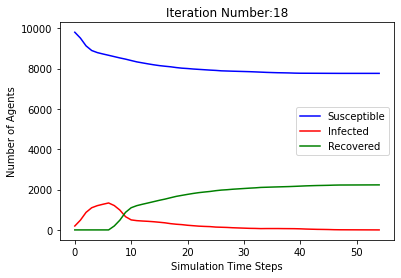

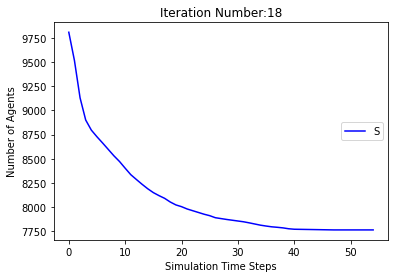

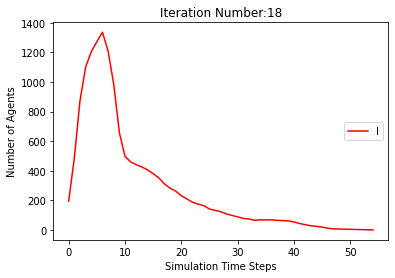

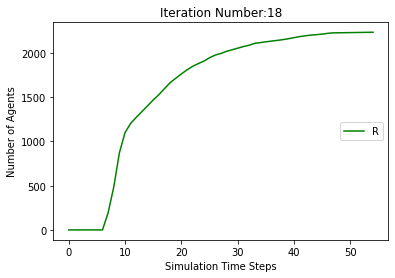

[9806, 9510, 9147, 8929, 8818, 8741, 8664, 8613, 8563, 8500, 8439, 8365, 8303, 8258, 8219, 8191, 8154, 8119, 8084, 8044, 8014, 7995, 7977, 7964, 7946, 7936, 7923, 7914, 7900, 7891, 7884, 7879, 7874, 7873, 7872, 7868, 7863, 7858, 7853, 7853, 7853, 7852, 7847, 7844, 7844, 7843, 7842, 7842, 7841, 7840, 7840, 7840, 7838, 7832, 7826, 7822, 7822, 7822, 7821, 7821, 7818, 7815, 7813, 7813, 7813, 7812, 7810, 7804, 7799, 7799, 7797, 7796, 7790, 7789, 7785, 7785, 7784, 7784, 7784, 7784, 7784, 7784, 7784, 7784]
[194, 490, 853, 1071, 1182, 1259, 1336, 1193, 947, 647, 490, 453, 438, 406, 394, 372, 346, 320, 281, 259, 244, 224, 214, 190, 173, 148, 121, 100, 95, 86, 80, 67, 62, 50, 42, 32, 28, 26, 26, 21, 20, 20, 21, 19, 14, 10, 11, 11, 11, 7, 4, 4, 5, 10, 16, 19, 18, 18, 19, 17, 14, 11, 9, 9, 9, 9, 11, 14, 16, 14, 16, 17, 22, 21, 19, 14, 15, 13, 12, 6, 5, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 490, 853, 1071, 1182, 1259, 1336, 1387, 1437, 1500, 1561, 1635, 1697, 1742, 1781, 1809, 1846, 1881, 1916, 1956,

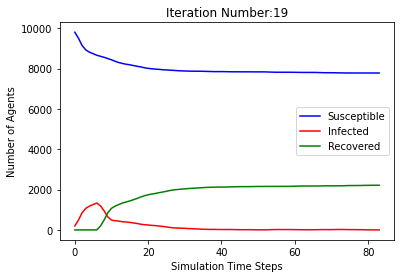

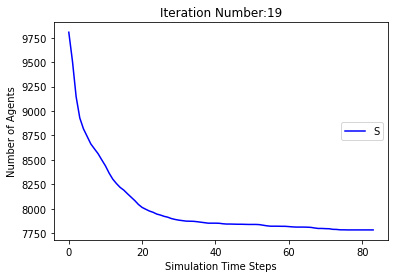

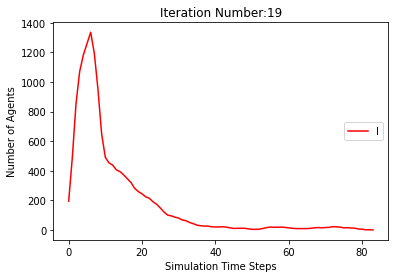

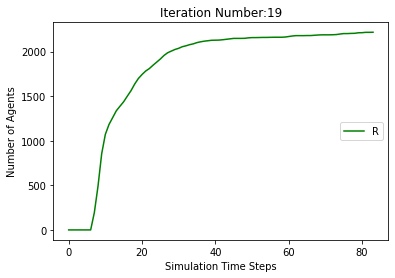

[9806, 9520, 9159, 8949, 8833, 8759, 8688, 8627, 8553, 8486, 8405, 8327, 8279, 8235, 8194, 8150, 8121, 8077, 8040, 7991, 7962, 7945, 7932, 7919, 7901, 7888, 7879, 7874, 7866, 7863, 7862, 7858, 7854, 7853, 7852, 7848, 7843, 7838, 7834, 7832, 7829, 7827, 7823, 7822, 7821, 7818, 7811, 7805, 7805, 7803, 7802, 7799, 7796, 7795, 7794, 7794, 7793, 7793, 7789, 7782, 7778, 7776, 7774, 7769, 7767, 7765, 7760, 7756, 7755, 7755, 7754, 7754, 7754, 7753, 7752, 7752, 7751, 7751, 7751, 7751, 7750, 7750, 7750, 7750, 7750, 7750, 7750, 7750]
[194, 480, 841, 1051, 1167, 1241, 1312, 1179, 967, 673, 544, 506, 480, 453, 433, 403, 365, 328, 287, 288, 273, 249, 218, 202, 176, 152, 112, 88, 79, 69, 57, 43, 34, 26, 22, 18, 20, 24, 24, 22, 24, 25, 25, 21, 17, 16, 21, 24, 22, 20, 20, 22, 22, 16, 11, 11, 10, 9, 10, 14, 17, 18, 20, 24, 26, 24, 22, 22, 21, 19, 15, 13, 11, 7, 4, 3, 4, 3, 3, 3, 3, 2, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 480, 841, 1051, 1167, 1241, 1312, 1373, 1447, 1514, 1595, 1673, 1721, 1765,

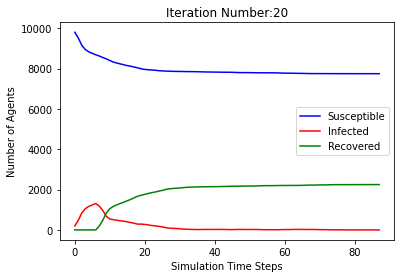

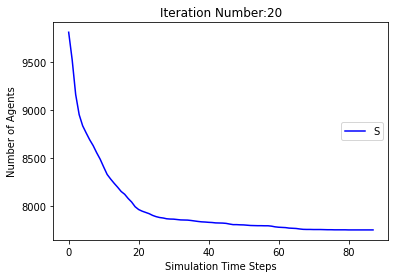

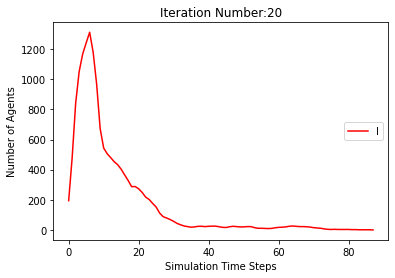

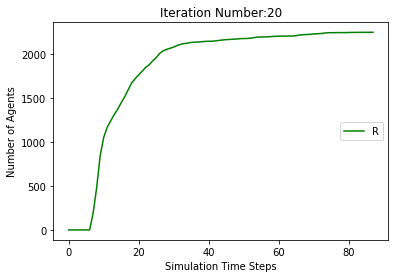

[9806, 9511, 9121, 8924, 8821, 8757, 8685, 8602, 8510, 8419, 8326, 8253, 8178, 8134, 8088, 8053, 8011, 7975, 7948, 7916, 7897, 7867, 7848, 7832, 7814, 7797, 7776, 7756, 7744, 7734, 7728, 7715, 7702, 7693, 7691, 7689, 7684, 7680, 7668, 7659, 7646, 7642, 7628, 7619, 7609, 7603, 7596, 7593, 7588, 7585, 7583, 7581, 7579, 7572, 7570, 7566, 7563, 7562, 7562, 7562, 7560, 7559, 7559, 7558, 7555, 7554, 7551, 7550, 7550, 7549, 7545, 7543, 7541, 7540, 7539, 7539, 7539, 7537, 7536, 7535, 7535, 7535, 7534, 7534, 7533, 7533, 7533, 7533, 7533, 7533, 7533, 7533]
[194, 489, 879, 1076, 1179, 1243, 1315, 1204, 1001, 702, 598, 568, 579, 551, 514, 457, 408, 351, 305, 262, 237, 221, 205, 179, 161, 151, 140, 141, 123, 114, 104, 99, 95, 83, 65, 55, 50, 48, 47, 43, 47, 49, 61, 65, 71, 65, 63, 53, 54, 43, 36, 28, 24, 24, 23, 22, 22, 21, 19, 17, 12, 11, 7, 5, 7, 8, 11, 10, 9, 10, 13, 12, 13, 11, 11, 11, 10, 8, 7, 6, 5, 4, 5, 5, 4, 3, 2, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 489, 879, 1076, 1179, 1243, 1315, 

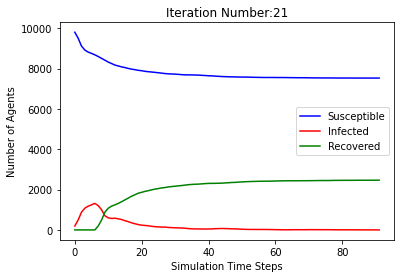

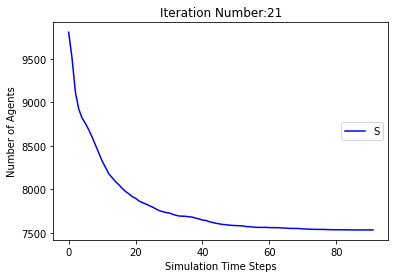

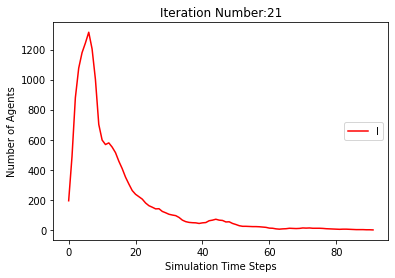

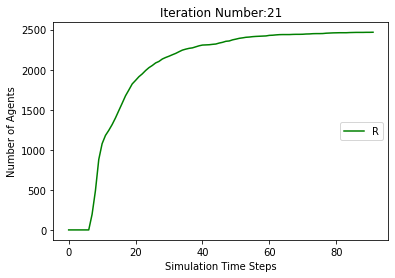

[9806, 9513, 9146, 8938, 8857, 8801, 8732, 8661, 8579, 8502, 8432, 8369, 8315, 8267, 8226, 8184, 8148, 8118, 8085, 8057, 8029, 8004, 7985, 7972, 7953, 7926, 7894, 7870, 7849, 7834, 7817, 7795, 7776, 7760, 7740, 7717, 7704, 7697, 7689, 7679, 7670, 7663, 7656, 7648, 7634, 7627, 7621, 7619, 7617, 7616, 7614, 7612, 7611, 7611, 7610, 7607, 7603, 7603, 7603, 7603, 7603, 7603, 7601, 7598, 7592, 7589, 7584, 7583, 7582, 7580, 7576, 7574, 7573, 7572, 7572, 7570, 7569, 7569, 7568, 7566, 7565, 7564, 7564, 7562, 7561, 7560, 7558, 7557, 7554, 7549, 7549, 7549, 7549, 7549, 7549, 7547, 7546, 7544, 7541, 7540, 7539, 7539, 7539, 7539, 7538, 7538, 7537, 7535, 7532, 7528, 7527, 7524, 7521, 7517, 7516, 7515, 7511, 7501, 7496, 7491, 7484, 7476, 7470, 7468, 7467, 7465, 7464, 7462, 7460, 7458, 7454, 7449, 7446, 7442, 7438, 7437, 7433, 7429, 7427, 7426, 7426, 7426, 7425, 7425, 7424, 7424, 7423, 7422, 7421, 7420, 7419, 7419, 7419, 7419, 7418, 7416, 7416, 7416, 7416, 7416, 7416, 7415, 7415, 7415, 7415, 7415, 741

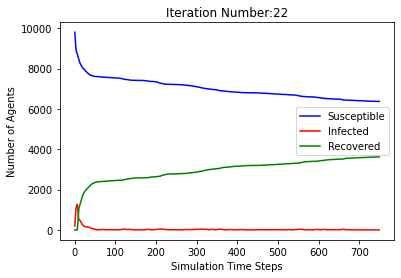

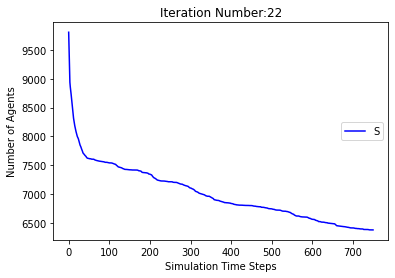

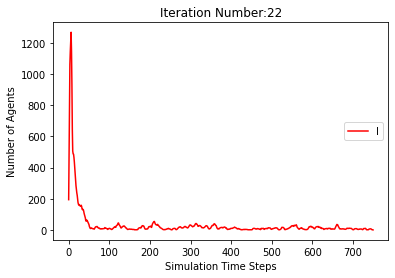

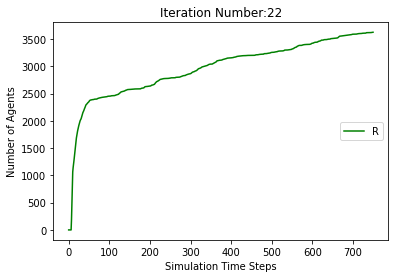

[9806, 9504, 9133, 8920, 8830, 8733, 8658, 8575, 8494, 8429, 8364, 8298, 8242, 8193, 8149, 8111, 8095, 8066, 8033, 8007, 7978, 7950, 7929, 7914, 7894, 7875, 7861, 7855, 7845, 7838, 7834, 7827, 7817, 7810, 7806, 7802, 7799, 7795, 7789, 7782, 7776, 7772, 7771, 7769, 7768, 7764, 7761, 7757, 7752, 7749, 7743, 7738, 7737, 7735, 7735, 7735, 7735, 7735, 7735, 7734, 7734, 7733, 7733, 7733, 7733, 7733, 7733, 7733, 7733]
[194, 496, 867, 1080, 1170, 1267, 1342, 1231, 1010, 704, 556, 532, 491, 465, 426, 383, 334, 298, 265, 235, 215, 199, 182, 181, 172, 158, 146, 123, 105, 91, 80, 67, 58, 51, 49, 43, 39, 39, 38, 35, 34, 34, 31, 30, 27, 25, 21, 19, 20, 22, 26, 30, 27, 26, 22, 17, 14, 8, 3, 3, 1, 2, 2, 2, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 496, 867, 1080, 1170, 1267, 1342, 1425, 1506, 1571, 1636, 1702, 1758, 1807, 1851, 1889, 1905, 1934, 1967, 1993, 2022, 2050, 2071, 2086, 2106, 2125, 2139, 2145, 2155, 2162, 2166, 2173, 2183, 2190, 2194, 2198, 2201, 2205, 2211, 2218, 2224, 2228, 2229, 2231, 22

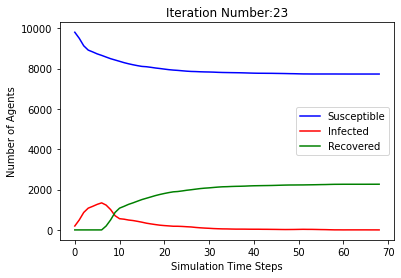

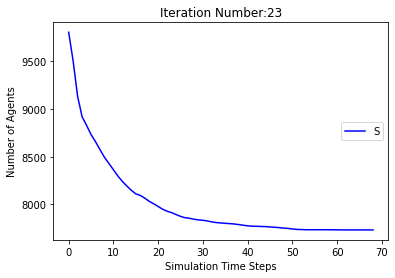

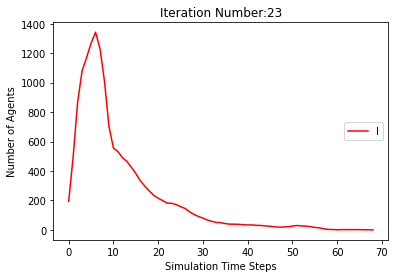

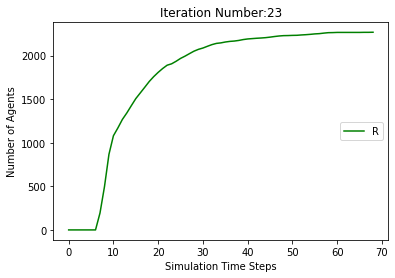

[9806, 9491, 9109, 8892, 8775, 8685, 8601, 8536, 8464, 8373, 8295, 8227, 8167, 8122, 8076, 8026, 7982, 7954, 7933, 7910, 7891, 7868, 7843, 7818, 7794, 7777, 7747, 7721, 7700, 7684, 7674, 7658, 7644, 7629, 7621, 7605, 7597, 7586, 7581, 7575, 7566, 7552, 7541, 7531, 7515, 7506, 7494, 7486, 7479, 7472, 7464, 7458, 7451, 7444, 7435, 7426, 7422, 7421, 7420, 7420, 7419, 7415, 7410, 7407, 7403, 7402, 7401, 7401, 7399, 7395, 7390, 7383, 7376, 7368, 7362, 7357, 7353, 7347, 7338, 7333, 7332, 7331, 7331, 7331, 7330, 7330, 7330, 7329, 7327, 7325, 7323, 7323, 7323, 7322, 7322, 7322, 7320, 7318, 7313, 7310, 7310, 7310, 7309, 7306, 7302, 7300, 7300, 7298, 7297, 7297, 7297, 7296, 7296, 7296, 7294, 7291, 7288, 7288, 7287, 7285, 7284, 7283, 7283, 7283, 7283, 7283, 7283, 7282, 7281, 7281, 7281, 7280, 7280, 7279, 7279, 7279, 7279, 7279, 7279, 7279, 7279]
[194, 509, 891, 1108, 1225, 1315, 1399, 1270, 1027, 736, 597, 548, 518, 479, 460, 438, 391, 341, 294, 257, 231, 208, 183, 164, 160, 156, 163, 170, 168, 1

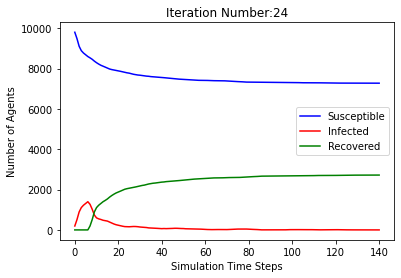

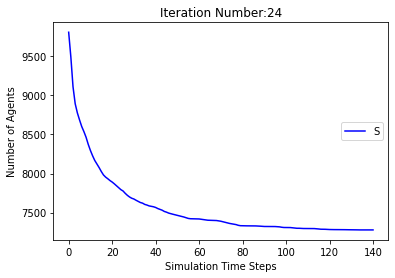

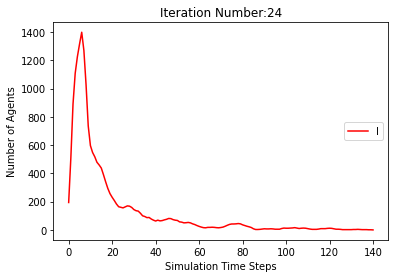

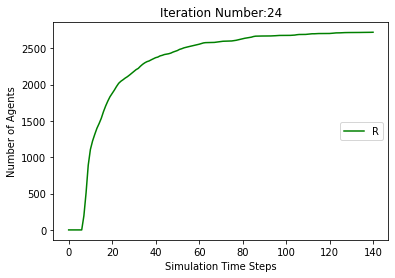

[9806, 9512, 9148, 8895, 8814, 8747, 8685, 8612, 8543, 8455, 8380, 8321, 8270, 8223, 8183, 8129, 8078, 8033, 7997, 7967, 7943, 7912, 7897, 7887, 7873, 7859, 7837, 7822, 7813, 7804, 7795, 7789, 7779, 7773, 7767, 7765, 7764, 7762, 7756, 7749, 7745, 7741, 7737, 7735, 7734, 7731, 7729, 7726, 7725, 7722, 7722, 7722, 7721, 7719, 7718, 7716, 7716, 7715, 7715, 7715, 7715, 7715, 7715, 7715, 7714, 7712, 7710, 7709, 7707, 7705, 7704, 7704, 7704, 7704, 7703, 7702, 7698, 7691, 7688, 7686, 7681, 7680, 7675, 7670, 7665, 7662, 7661, 7661, 7660, 7659, 7659, 7658, 7657, 7654, 7653, 7651, 7651, 7650, 7650, 7649, 7649, 7649, 7647, 7647, 7646, 7646, 7646, 7646, 7646, 7644, 7643, 7640, 7639, 7638, 7634, 7629, 7624, 7624, 7623, 7623, 7621, 7616, 7605, 7600, 7600, 7600, 7600, 7598, 7595, 7592, 7586, 7586, 7583, 7579, 7576, 7573, 7573, 7573, 7572, 7571, 7570, 7568, 7568, 7568, 7568, 7568, 7567, 7567, 7566, 7565, 7564, 7564, 7564, 7564, 7563, 7562, 7561, 7561, 7560, 7559, 7559, 7559, 7559, 7558, 7555, 7554, 755

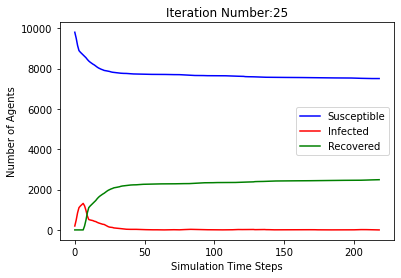

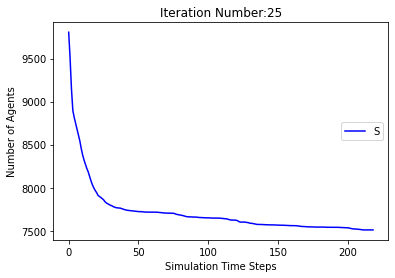

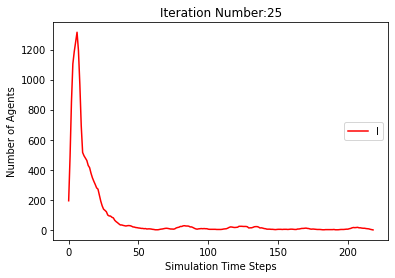

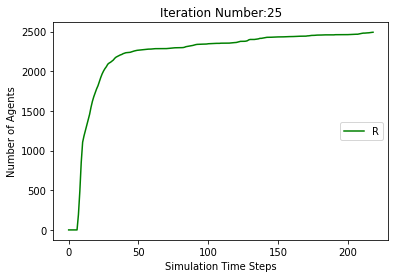

[9806, 9530, 9158, 8917, 8807, 8756, 8706, 8642, 8557, 8467, 8361, 8266, 8199, 8145, 8105, 8074, 8041, 8001, 7962, 7942, 7914, 7887, 7864, 7843, 7816, 7804, 7797, 7785, 7778, 7774, 7767, 7759, 7750, 7750, 7749, 7748, 7747, 7747, 7747, 7747, 7745, 7744, 7741, 7741, 7741, 7741, 7741, 7741, 7739, 7739, 7739, 7739, 7739, 7739, 7739, 7739]
[194, 470, 842, 1083, 1193, 1244, 1294, 1164, 973, 691, 556, 541, 557, 561, 537, 483, 426, 360, 304, 257, 231, 218, 210, 198, 185, 158, 145, 129, 109, 90, 76, 57, 54, 47, 36, 30, 27, 20, 12, 3, 5, 5, 7, 6, 6, 6, 6, 4, 5, 2, 2, 2, 2, 2, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 470, 842, 1083, 1193, 1244, 1294, 1358, 1443, 1533, 1639, 1734, 1801, 1855, 1895, 1926, 1959, 1999, 2038, 2058, 2086, 2113, 2136, 2157, 2184, 2196, 2203, 2215, 2222, 2226, 2233, 2241, 2250, 2250, 2251, 2252, 2253, 2253, 2253, 2253, 2255, 2256, 2259, 2259, 2259, 2259, 2259, 2259, 2261]
[[], [9806, 9515, 9140, 8897, 8803, 8738, 8666, 8595, 8522, 8450, 8380, 8301, 8229, 8203, 8183, 8150, 8117, 

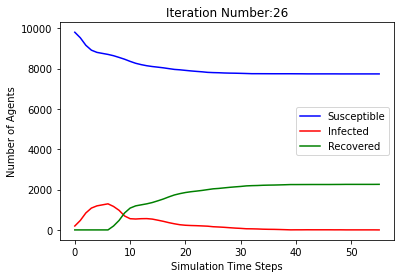

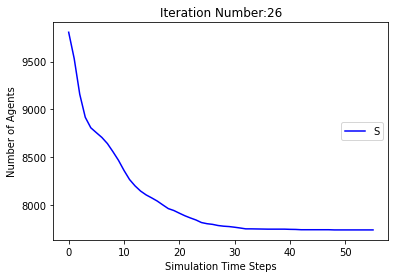

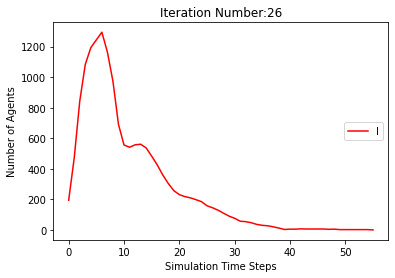

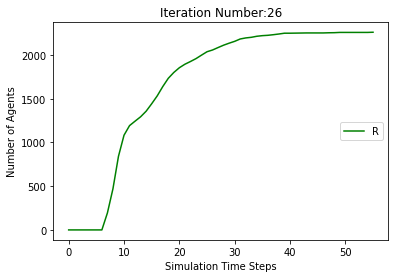

[9806, 9497, 9133, 8897, 8796, 8725, 8649, 8574, 8513, 8451, 8394, 8334, 8277, 8245, 8205, 8177, 8142, 8115, 8091, 8067, 8047, 8026, 8009, 7992, 7966, 7932, 7905, 7881, 7855, 7836, 7826, 7817, 7811, 7796, 7790, 7786, 7778, 7771, 7767, 7763, 7759, 7757, 7755, 7749, 7741, 7727, 7718, 7706, 7704, 7699, 7691, 7684, 7673, 7666, 7663, 7661, 7661, 7655, 7652, 7650, 7648, 7645, 7645, 7642, 7636, 7633, 7629, 7622, 7619, 7616, 7611, 7601, 7590, 7580, 7576, 7575, 7573, 7569, 7564, 7560, 7555, 7550, 7547, 7544, 7539, 7539, 7536, 7535, 7530, 7528, 7527, 7525, 7523, 7521, 7521, 7521, 7519, 7519, 7518, 7514, 7511, 7511, 7510, 7508, 7506, 7506, 7506, 7506, 7506, 7506, 7506, 7506]
[194, 503, 867, 1103, 1204, 1275, 1351, 1232, 984, 682, 503, 462, 448, 404, 369, 336, 309, 279, 243, 210, 198, 179, 168, 150, 149, 159, 162, 166, 171, 173, 166, 149, 121, 109, 91, 69, 58, 55, 50, 48, 37, 33, 31, 29, 30, 40, 45, 53, 53, 56, 58, 57, 54, 52, 43, 43, 38, 36, 32, 23, 18, 18, 16, 19, 19, 19, 21, 26, 26, 29, 31, 35,

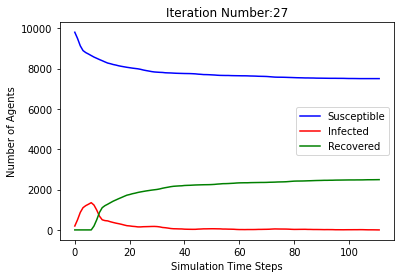

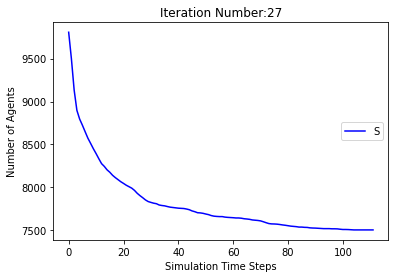

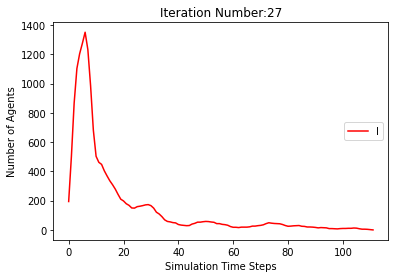

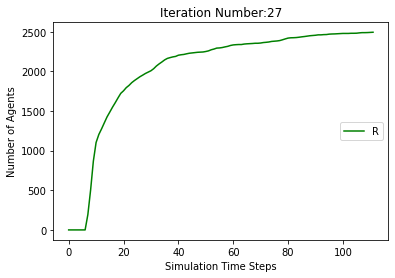

[9806, 9511, 9139, 8920, 8823, 8761, 8701, 8637, 8569, 8504, 8429, 8357, 8280, 8228, 8195, 8148, 8093, 8047, 8012, 7989, 7974, 7945, 7918, 7901, 7892, 7880, 7862, 7845, 7821, 7811, 7801, 7792, 7786, 7773, 7765, 7757, 7747, 7737, 7736, 7733, 7731, 7724, 7721, 7720, 7717, 7713, 7709, 7708, 7708, 7708, 7707, 7707, 7704, 7704, 7702, 7702, 7701, 7701, 7701, 7698, 7698, 7697, 7697, 7697, 7697, 7695, 7690, 7687, 7684, 7683, 7682, 7680, 7679, 7678, 7678, 7675, 7670, 7669, 7669, 7668, 7667, 7664, 7660, 7660, 7660, 7659, 7659, 7659, 7658, 7658, 7657, 7657, 7656, 7655, 7655, 7655, 7653, 7647, 7639, 7637, 7633, 7631, 7631, 7631, 7631, 7631, 7631, 7631, 7631]
[194, 489, 861, 1080, 1177, 1239, 1299, 1169, 942, 635, 491, 466, 481, 473, 442, 421, 411, 382, 345, 291, 254, 250, 230, 192, 155, 132, 127, 129, 124, 107, 100, 100, 94, 89, 80, 64, 64, 64, 56, 53, 42, 41, 36, 27, 20, 23, 24, 23, 16, 13, 13, 10, 9, 5, 6, 6, 7, 6, 6, 6, 6, 5, 5, 4, 4, 6, 8, 11, 13, 14, 15, 17, 16, 12, 9, 9, 13, 13, 11, 11, 11, 

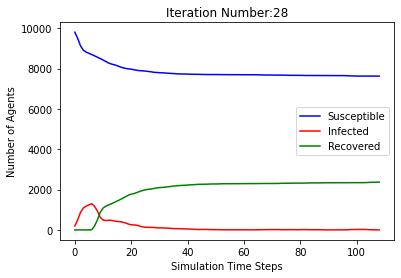

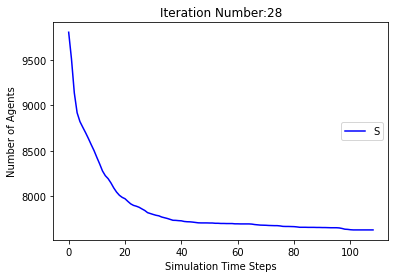

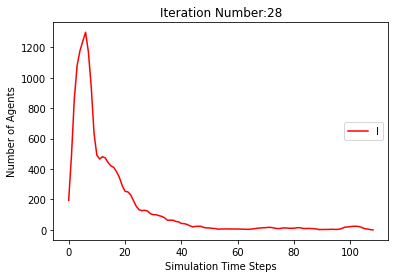

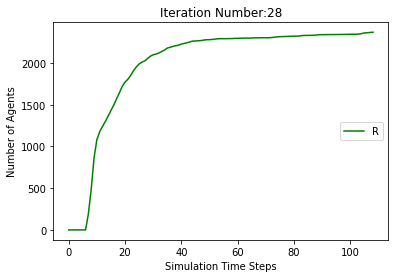

[9806, 9488, 9110, 8908, 8825, 8760, 8682, 8594, 8505, 8401, 8297, 8214, 8155, 8104, 8053, 8011, 7962, 7917, 7877, 7836, 7803, 7777, 7749, 7727, 7713, 7691, 7676, 7657, 7643, 7629, 7613, 7602, 7588, 7579, 7575, 7572, 7569, 7566, 7561, 7554, 7553, 7552, 7552, 7552, 7550, 7550, 7550, 7550, 7550, 7550, 7550, 7550]
[194, 512, 890, 1092, 1175, 1240, 1318, 1212, 983, 709, 611, 611, 605, 578, 541, 494, 439, 380, 337, 319, 301, 276, 262, 235, 204, 186, 160, 146, 134, 120, 114, 111, 103, 97, 82, 71, 60, 47, 41, 34, 26, 23, 20, 17, 16, 11, 4, 3, 2, 2, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 512, 890, 1092, 1175, 1240, 1318, 1406, 1495, 1599, 1703, 1786, 1845, 1896, 1947, 1989, 2038, 2083, 2123, 2164, 2197, 2223, 2251, 2273, 2287, 2309, 2324, 2343, 2357, 2371, 2387, 2398, 2412, 2421, 2425, 2428, 2431, 2434, 2439, 2446, 2447, 2448, 2448, 2448, 2450]
[[], [9806, 9515, 9140, 8897, 8803, 8738, 8666, 8595, 8522, 8450, 8380, 8301, 8229, 8203, 8183, 8150, 8117, 8085, 8054, 8026, 8002, 7977, 7958, 7942, 7933, 7

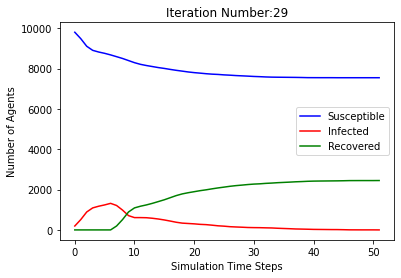

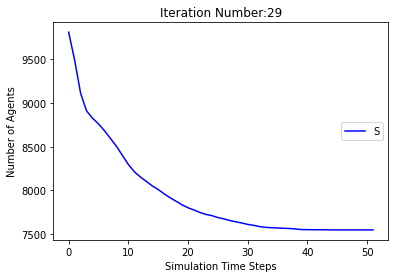

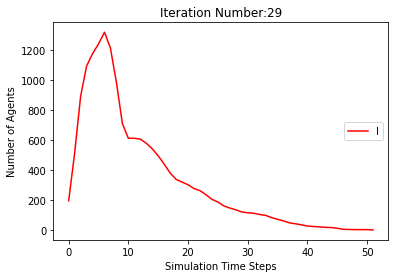

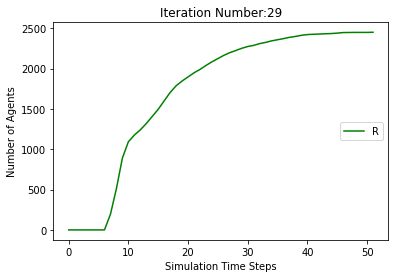

[9806, 9498, 9129, 8900, 8806, 8734, 8653, 8555, 8475, 8382, 8301, 8213, 8128, 8059, 7994, 7937, 7890, 7829, 7787, 7749, 7711, 7682, 7658, 7636, 7607, 7586, 7574, 7552, 7529, 7519, 7503, 7492, 7484, 7478, 7468, 7461, 7453, 7451, 7445, 7442, 7439, 7439, 7439, 7436, 7431, 7430, 7429, 7429, 7429, 7428, 7428, 7428, 7427, 7425, 7424, 7419, 7418, 7416, 7414, 7411, 7411, 7411, 7408, 7405, 7404, 7403, 7403, 7403, 7402, 7402, 7402, 7402, 7401, 7401, 7398, 7398, 7397, 7396, 7395, 7393, 7389, 7381, 7375, 7371, 7368, 7366, 7364, 7360, 7355, 7348, 7341, 7339, 7339, 7333, 7333, 7330, 7329, 7328, 7327, 7325, 7324, 7322, 7321, 7320, 7320, 7318, 7316, 7314, 7313, 7310, 7306, 7301, 7298, 7296, 7289, 7288, 7286, 7283, 7280, 7277, 7275, 7275, 7275, 7273, 7273, 7272, 7271, 7271, 7270, 7270, 7270, 7269, 7269, 7265, 7264, 7263, 7263, 7263, 7263, 7261, 7261, 7261, 7260, 7260, 7260, 7260, 7258, 7257, 7257, 7257, 7257, 7257, 7257, 7257, 7256, 7256, 7255, 7255, 7254, 7253, 7253, 7253, 7253, 7253, 7253, 7253, 725

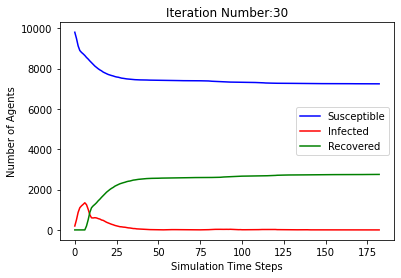

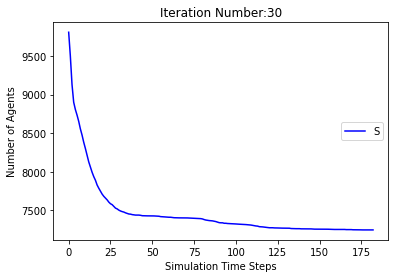

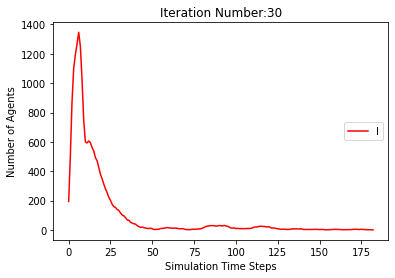

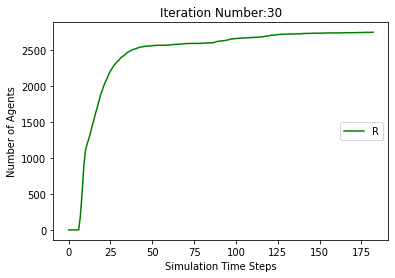

[9806, 9492, 9108, 8885, 8804, 8744, 8685, 8613, 8528, 8456, 8382, 8335, 8280, 8241, 8201, 8158, 8120, 8090, 8067, 8030, 8003, 7982, 7965, 7946, 7928, 7912, 7895, 7882, 7874, 7857, 7847, 7840, 7832, 7820, 7804, 7800, 7796, 7793, 7791, 7789, 7784, 7774, 7769, 7766, 7764, 7761, 7761, 7761, 7759, 7758, 7758, 7758, 7758, 7758, 7758, 7758, 7758]
[194, 508, 892, 1115, 1196, 1256, 1315, 1193, 964, 652, 503, 469, 464, 444, 412, 370, 336, 292, 268, 250, 238, 219, 193, 174, 162, 155, 135, 121, 108, 108, 99, 88, 80, 75, 78, 74, 61, 54, 49, 43, 36, 30, 31, 30, 29, 30, 28, 23, 15, 11, 8, 6, 3, 3, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 508, 892, 1115, 1196, 1256, 1315, 1387, 1472, 1544, 1618, 1665, 1720, 1759, 1799, 1842, 1880, 1910, 1933, 1970, 1997, 2018, 2035, 2054, 2072, 2088, 2105, 2118, 2126, 2143, 2153, 2160, 2168, 2180, 2196, 2200, 2204, 2207, 2209, 2211, 2216, 2226, 2231, 2234, 2236, 2239, 2239, 2239, 2241, 2242]
[[], [9806, 9515, 9140, 8897, 8803, 8738, 8666, 8595, 8522, 8450, 8380, 8301, 822

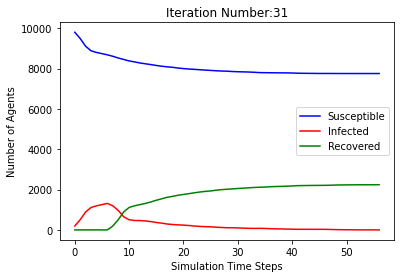

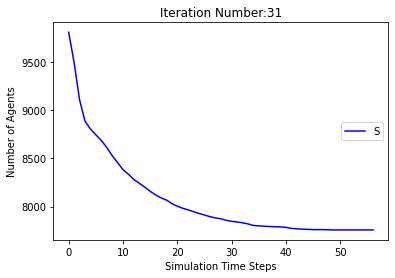

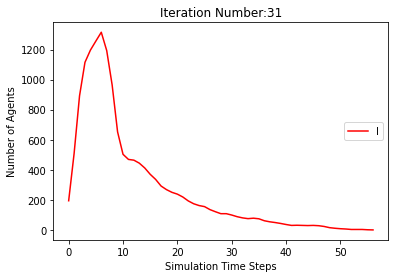

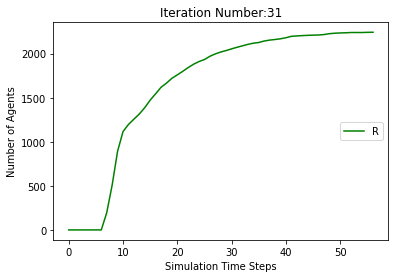

[9806, 9512, 9160, 8918, 8799, 8720, 8644, 8565, 8493, 8404, 8322, 8248, 8172, 8112, 8048, 7996, 7949, 7904, 7863, 7832, 7800, 7774, 7737, 7713, 7682, 7656, 7630, 7610, 7592, 7583, 7576, 7568, 7563, 7558, 7555, 7550, 7542, 7537, 7532, 7529, 7522, 7513, 7507, 7504, 7502, 7496, 7491, 7490, 7489, 7489, 7489, 7487, 7484, 7479, 7474, 7470, 7469, 7461, 7450, 7442, 7440, 7432, 7428, 7425, 7422, 7421, 7420, 7420, 7420, 7419, 7418, 7417, 7416, 7416, 7415, 7415, 7415, 7415, 7414, 7414, 7413, 7413, 7413, 7413, 7413, 7413, 7413, 7413]
[194, 488, 840, 1082, 1201, 1280, 1356, 1241, 1019, 756, 596, 551, 548, 532, 517, 497, 455, 418, 385, 340, 312, 274, 259, 236, 222, 207, 202, 190, 182, 154, 137, 114, 93, 72, 55, 42, 41, 39, 36, 34, 36, 42, 43, 38, 35, 36, 38, 32, 24, 18, 15, 15, 12, 12, 16, 19, 20, 28, 37, 42, 39, 42, 42, 44, 39, 29, 22, 20, 12, 9, 7, 5, 5, 4, 5, 5, 4, 3, 3, 2, 3, 2, 2, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 488, 840, 1082, 1201, 1280, 1356, 1435, 1507, 1596, 1678, 1752, 1828, 18

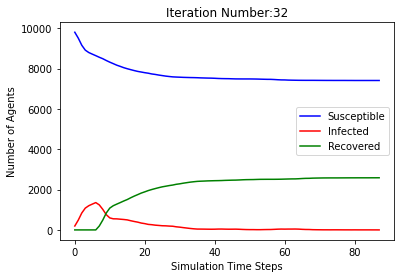

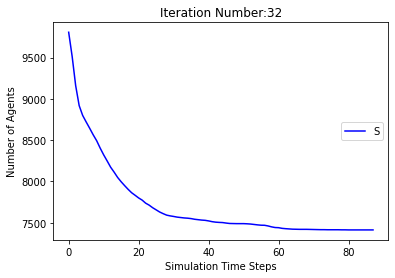

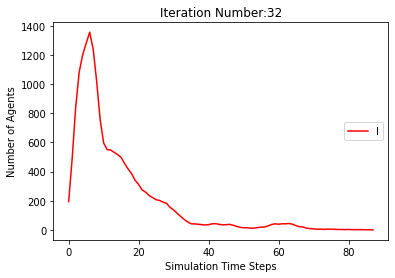

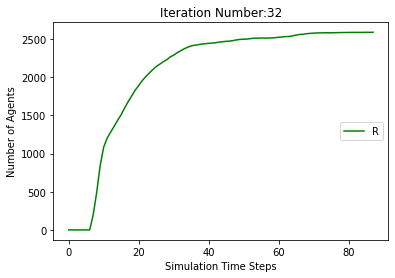

[9806, 9514, 9136, 8880, 8769, 8714, 8645, 8573, 8495, 8401, 8313, 8233, 8172, 8134, 8089, 8042, 8014, 7997, 7973, 7952, 7928, 7913, 7888, 7865, 7839, 7817, 7812, 7801, 7793, 7781, 7771, 7753, 7741, 7729, 7724, 7717, 7709, 7702, 7693, 7685, 7681, 7675, 7666, 7657, 7652, 7651, 7650, 7650, 7650, 7648, 7645, 7640, 7635, 7631, 7631, 7630, 7630, 7630, 7630, 7630, 7630, 7630, 7630]
[194, 486, 864, 1120, 1231, 1286, 1355, 1233, 1019, 735, 567, 536, 542, 511, 484, 453, 387, 316, 260, 220, 206, 176, 154, 149, 158, 156, 140, 127, 120, 107, 94, 86, 76, 83, 77, 76, 72, 69, 60, 56, 48, 49, 51, 52, 50, 42, 35, 31, 25, 18, 12, 12, 16, 19, 19, 20, 18, 15, 10, 5, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 486, 864, 1120, 1231, 1286, 1355, 1427, 1505, 1599, 1687, 1767, 1828, 1866, 1911, 1958, 1986, 2003, 2027, 2048, 2072, 2087, 2112, 2135, 2161, 2183, 2188, 2199, 2207, 2219, 2229, 2247, 2259, 2271, 2276, 2283, 2291, 2298, 2307, 2315, 2319, 2325, 2334, 2343, 2348, 2349, 2350, 2350, 2350, 2352, 2355, 2360, 2365,

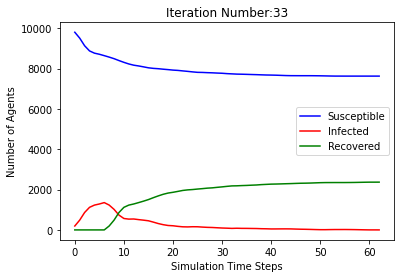

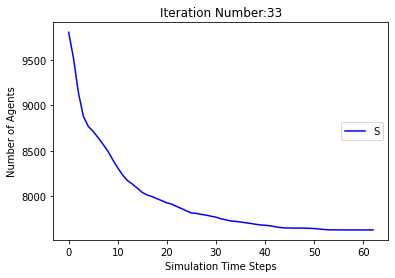

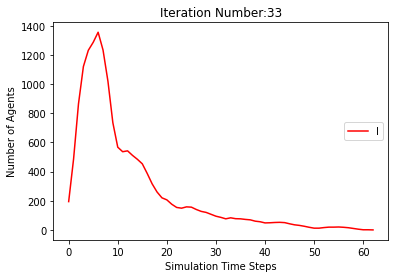

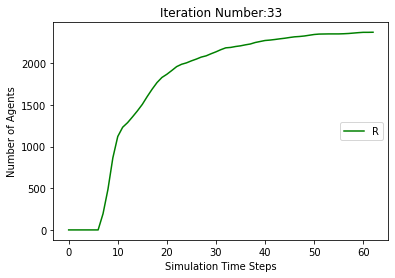

[9806, 9517, 9161, 8937, 8824, 8743, 8656, 8551, 8442, 8354, 8248, 8173, 8111, 8064, 8021, 7981, 7943, 7907, 7876, 7851, 7824, 7798, 7784, 7769, 7752, 7746, 7740, 7737, 7730, 7718, 7706, 7693, 7687, 7674, 7663, 7656, 7647, 7638, 7630, 7622, 7610, 7603, 7595, 7588, 7583, 7581, 7580, 7578, 7574, 7568, 7565, 7564, 7564, 7562, 7560, 7559, 7558, 7554, 7547, 7541, 7538, 7537, 7537, 7536, 7536, 7535, 7532, 7529, 7525, 7524, 7524, 7524, 7523, 7523, 7522, 7522, 7521, 7520, 7517, 7517, 7516, 7516, 7516, 7516, 7516, 7516, 7515, 7515, 7515, 7515, 7515, 7514, 7514, 7514, 7514, 7514, 7514, 7514, 7514]
[194, 483, 839, 1063, 1176, 1257, 1344, 1255, 1075, 807, 689, 651, 632, 592, 530, 461, 411, 341, 297, 260, 240, 223, 197, 174, 155, 130, 111, 87, 68, 66, 63, 59, 59, 66, 74, 74, 71, 68, 63, 65, 64, 60, 61, 59, 55, 49, 42, 32, 29, 27, 23, 19, 17, 18, 18, 15, 10, 11, 17, 23, 24, 23, 22, 22, 18, 12, 9, 9, 12, 13, 12, 12, 12, 9, 7, 3, 3, 4, 7, 6, 7, 6, 6, 5, 4, 1, 2, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 0]
[0,

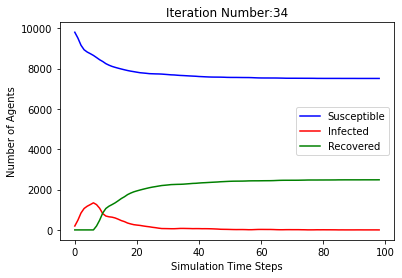

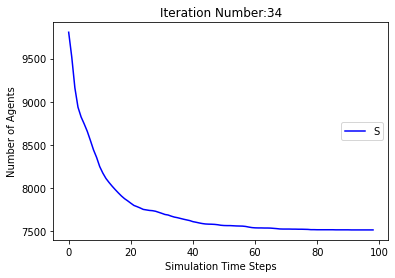

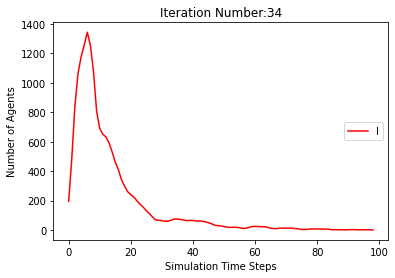

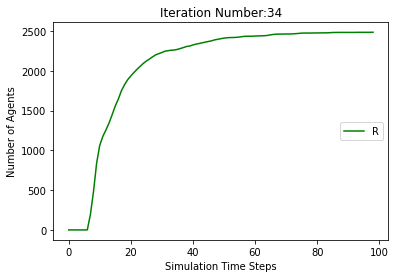

[9806, 9494, 9129, 8849, 8714, 8614, 8506, 8413, 8337, 8260, 8196, 8141, 8078, 8020, 7967, 7913, 7857, 7812, 7786, 7766, 7742, 7720, 7693, 7672, 7642, 7620, 7602, 7585, 7573, 7568, 7561, 7547, 7543, 7541, 7539, 7536, 7527, 7517, 7511, 7510, 7508, 7508, 7506, 7505, 7502, 7502, 7502, 7502, 7501, 7501, 7501, 7501, 7501, 7500, 7500, 7500, 7500, 7500, 7500, 7497, 7493, 7492, 7491, 7491, 7491, 7491, 7491, 7490, 7490, 7490, 7490, 7490, 7489, 7488, 7484, 7484, 7480, 7480, 7478, 7476, 7470, 7464, 7457, 7455, 7454, 7453, 7452, 7451, 7449, 7448, 7447, 7445, 7440, 7436, 7434, 7432, 7432, 7432, 7432, 7431, 7431, 7430, 7430, 7430, 7430, 7430, 7430, 7430, 7430]
[194, 506, 871, 1151, 1286, 1386, 1494, 1393, 1157, 869, 653, 573, 536, 486, 446, 424, 403, 384, 355, 312, 278, 247, 220, 185, 170, 166, 164, 157, 147, 125, 111, 95, 77, 61, 46, 37, 41, 44, 36, 33, 33, 31, 30, 22, 15, 9, 8, 6, 7, 5, 4, 1, 1, 2, 2, 1, 1, 1, 1, 4, 7, 8, 9, 9, 9, 9, 6, 3, 2, 1, 1, 1, 2, 3, 6, 6, 10, 10, 12, 13, 18, 20, 27, 25, 26

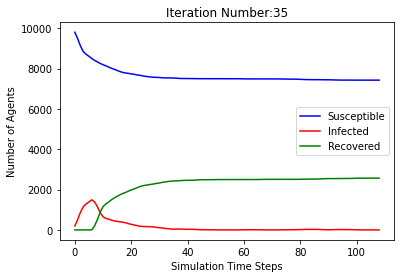

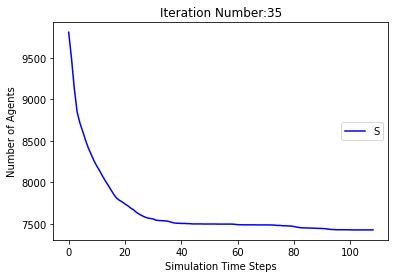

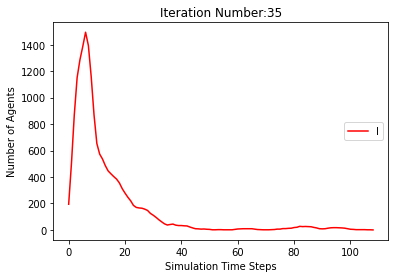

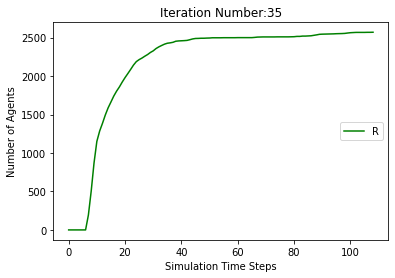

[9806, 9492, 9128, 8903, 8786, 8693, 8600, 8498, 8413, 8312, 8229, 8154, 8081, 8019, 7966, 7908, 7869, 7841, 7798, 7770, 7746, 7729, 7715, 7697, 7681, 7664, 7646, 7631, 7618, 7606, 7600, 7597, 7589, 7579, 7574, 7565, 7558, 7553, 7551, 7546, 7539, 7532, 7524, 7512, 7504, 7500, 7494, 7490, 7488, 7482, 7478, 7471, 7467, 7465, 7464, 7463, 7463, 7463, 7462, 7461, 7461, 7461, 7461, 7461, 7460, 7460, 7460, 7460, 7460, 7460, 7460, 7460]
[194, 508, 872, 1097, 1214, 1307, 1400, 1308, 1079, 816, 674, 632, 612, 581, 532, 505, 443, 388, 356, 311, 273, 237, 193, 172, 160, 134, 124, 115, 111, 109, 97, 84, 75, 67, 57, 53, 48, 47, 46, 43, 40, 42, 41, 46, 49, 51, 52, 49, 44, 42, 34, 33, 33, 29, 26, 25, 19, 15, 9, 6, 4, 3, 2, 2, 3, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 508, 872, 1097, 1214, 1307, 1400, 1502, 1587, 1688, 1771, 1846, 1919, 1981, 2034, 2092, 2131, 2159, 2202, 2230, 2254, 2271, 2285, 2303, 2319, 2336, 2354, 2369, 2382, 2394, 2400, 2403, 2411, 2421, 2426, 2435, 2442, 2447, 2449, 245

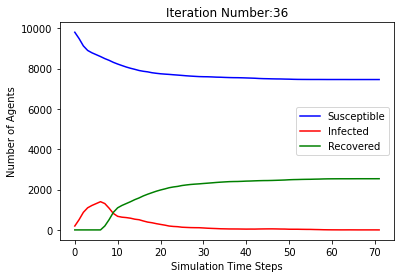

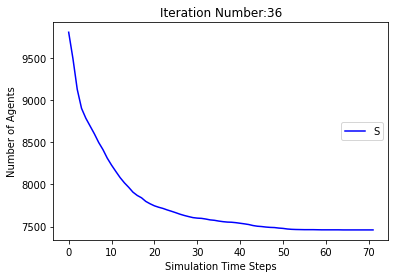

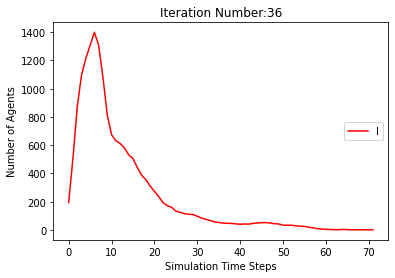

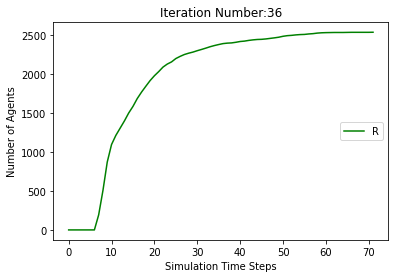

[9806, 9525, 9158, 8908, 8810, 8742, 8654, 8560, 8488, 8416, 8360, 8313, 8260, 8208, 8162, 8123, 8097, 8063, 8046, 8024, 8004, 7983, 7966, 7945, 7915, 7897, 7890, 7882, 7873, 7862, 7857, 7856, 7852, 7847, 7842, 7823, 7810, 7806, 7803, 7794, 7788, 7781, 7773, 7766, 7765, 7762, 7762, 7762, 7762, 7760, 7754, 7750, 7750, 7750, 7747, 7746, 7741, 7740, 7739, 7734, 7729, 7724, 7722, 7719, 7717, 7712, 7711, 7710, 7710, 7708, 7706, 7704, 7702, 7697, 7696, 7694, 7690, 7688, 7686, 7683, 7680, 7670, 7662, 7661, 7657, 7656, 7654, 7651, 7649, 7649, 7649, 7648, 7648, 7646, 7643, 7640, 7640, 7640, 7639, 7635, 7635, 7633, 7630, 7628, 7626, 7623, 7620, 7620, 7617, 7615, 7613, 7612, 7611, 7610, 7610, 7610, 7610, 7610, 7610, 7610, 7610]
[194, 475, 842, 1092, 1190, 1258, 1346, 1246, 1037, 742, 548, 497, 482, 446, 398, 365, 319, 297, 267, 236, 204, 179, 157, 152, 148, 149, 134, 122, 110, 104, 88, 59, 45, 43, 40, 50, 52, 51, 53, 58, 59, 61, 50, 44, 41, 41, 32, 26, 19, 13, 12, 15, 12, 12, 15, 16, 19, 14, 11, 

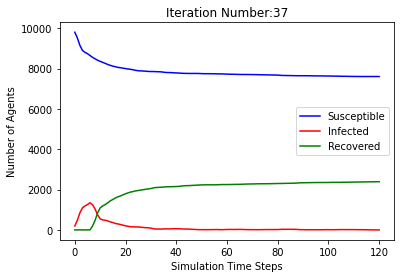

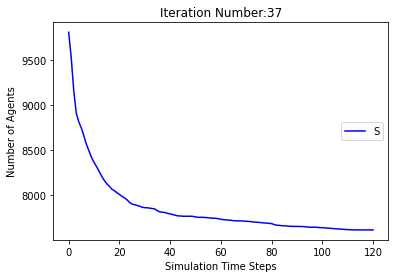

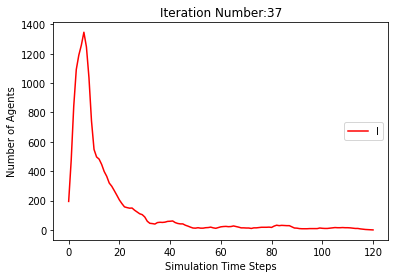

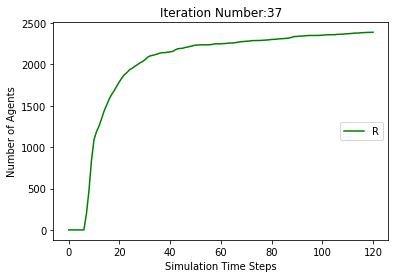

[9806, 9514, 9131, 8926, 8848, 8786, 8710, 8619, 8533, 8426, 8338, 8259, 8215, 8169, 8123, 8088, 8059, 8035, 8012, 7979, 7953, 7920, 7884, 7858, 7833, 7807, 7785, 7768, 7755, 7742, 7729, 7718, 7705, 7692, 7673, 7656, 7641, 7623, 7614, 7613, 7611, 7603, 7595, 7588, 7582, 7576, 7574, 7572, 7571, 7571, 7571, 7571, 7571, 7570, 7570, 7569, 7569, 7569, 7569, 7568, 7568, 7568, 7568, 7568, 7568, 7568, 7568]
[194, 486, 869, 1074, 1152, 1214, 1290, 1187, 981, 705, 588, 589, 571, 541, 496, 445, 367, 303, 247, 236, 216, 203, 204, 201, 202, 205, 194, 185, 165, 142, 129, 115, 102, 93, 95, 99, 101, 106, 104, 92, 81, 70, 61, 53, 41, 38, 39, 39, 32, 24, 17, 11, 5, 4, 2, 2, 2, 2, 2, 3, 2, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 486, 869, 1074, 1152, 1214, 1290, 1381, 1467, 1574, 1662, 1741, 1785, 1831, 1877, 1912, 1941, 1965, 1988, 2021, 2047, 2080, 2116, 2142, 2167, 2193, 2215, 2232, 2245, 2258, 2271, 2282, 2295, 2308, 2327, 2344, 2359, 2377, 2386, 2387, 2389, 2397, 2405, 2412, 2418, 2424, 2426, 2

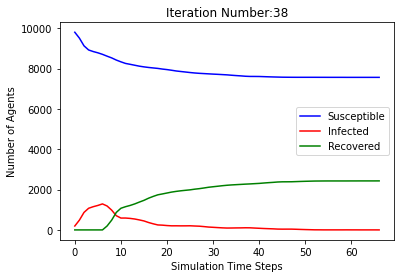

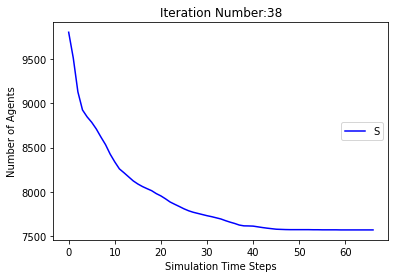

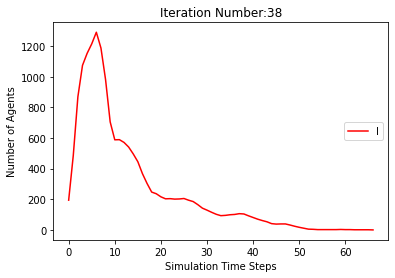

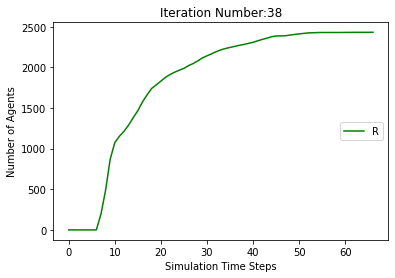

[9806, 9484, 9135, 8901, 8796, 8731, 8662, 8576, 8484, 8394, 8300, 8207, 8135, 8071, 8021, 7975, 7915, 7887, 7860, 7830, 7796, 7769, 7728, 7694, 7660, 7630, 7604, 7587, 7568, 7549, 7541, 7529, 7512, 7495, 7474, 7463, 7459, 7457, 7456, 7456, 7456, 7455, 7454, 7452, 7450, 7445, 7441, 7440, 7440, 7440, 7440, 7438, 7438, 7437, 7434, 7431, 7428, 7428, 7428, 7427, 7424, 7421, 7418, 7418, 7416, 7416, 7416, 7415, 7415, 7415, 7415, 7415, 7415, 7412, 7409, 7408, 7408, 7408, 7408, 7407, 7407, 7407, 7407, 7407, 7407, 7406, 7404, 7401, 7400, 7398, 7398, 7398, 7398, 7398, 7398, 7397, 7397, 7397, 7397, 7396, 7392, 7389, 7388, 7387, 7386, 7384, 7382, 7373, 7372, 7370, 7367, 7366, 7365, 7365, 7365, 7363, 7360, 7359, 7357, 7354, 7352, 7350, 7348, 7347, 7346, 7346, 7343, 7341, 7335, 7334, 7334, 7333, 7330, 7328, 7326, 7324, 7322, 7316, 7312, 7310, 7309, 7309, 7308, 7308, 7308, 7308, 7308, 7308, 7308, 7308]
[194, 516, 865, 1099, 1204, 1269, 1338, 1230, 1000, 741, 601, 589, 596, 591, 555, 509, 479, 413, 34

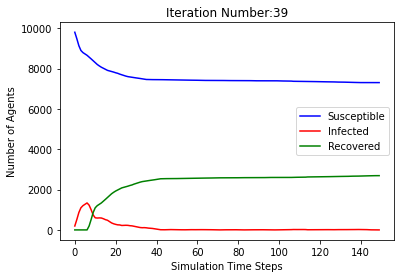

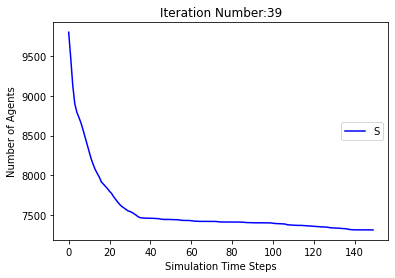

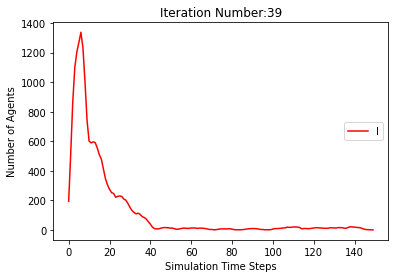

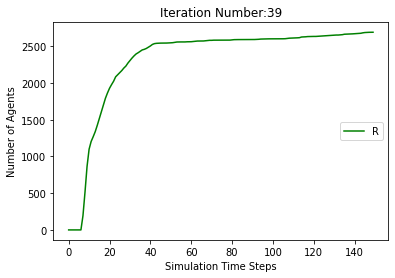

[9806, 9509, 9136, 8923, 8828, 8756, 8692, 8645, 8567, 8490, 8413, 8342, 8281, 8216, 8165, 8113, 8056, 8001, 7955, 7906, 7872, 7835, 7806, 7781, 7765, 7749, 7736, 7719, 7708, 7690, 7677, 7665, 7657, 7649, 7637, 7631, 7618, 7615, 7613, 7608, 7602, 7596, 7591, 7588, 7587, 7582, 7575, 7568, 7563, 7558, 7554, 7550, 7545, 7544, 7544, 7544, 7543, 7541, 7536, 7531, 7530, 7528, 7525, 7521, 7514, 7510, 7503, 7498, 7494, 7491, 7488, 7481, 7475, 7473, 7472, 7472, 7472, 7470, 7468, 7465, 7464, 7464, 7462, 7460, 7458, 7455, 7451, 7448, 7447, 7447, 7447, 7447, 7447, 7446, 7446, 7446, 7446, 7445, 7445, 7445, 7445, 7445, 7444, 7444, 7440, 7440, 7440, 7440, 7439, 7437, 7433, 7430, 7429, 7424, 7422, 7420, 7417, 7415, 7412, 7408, 7405, 7400, 7398, 7396, 7392, 7390, 7386, 7383, 7380, 7379, 7378, 7376, 7375, 7371, 7368, 7366, 7366, 7366, 7365, 7364, 7363, 7361, 7361, 7361, 7360, 7359, 7356, 7352, 7350, 7349, 7349, 7348, 7348, 7345, 7342, 7340, 7337, 7333, 7332, 7332, 7331, 7331, 7329, 7329, 7328, 7327, 732

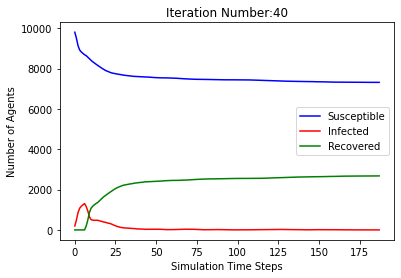

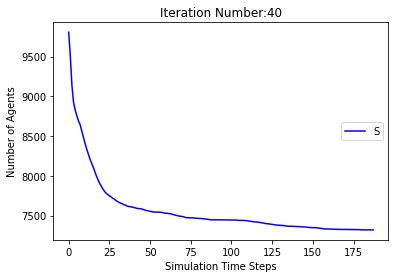

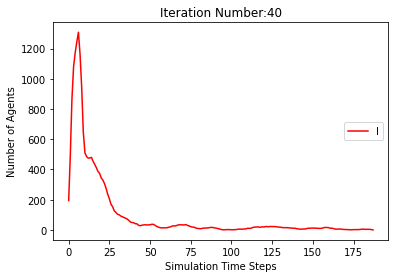

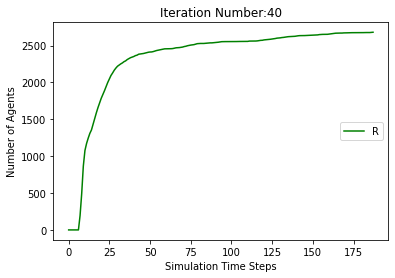

[9806, 9494, 9136, 8914, 8831, 8774, 8715, 8652, 8565, 8473, 8358, 8281, 8205, 8134, 8075, 8022, 7979, 7936, 7894, 7848, 7816, 7774, 7749, 7730, 7720, 7705, 7696, 7677, 7661, 7654, 7644, 7636, 7622, 7616, 7611, 7601, 7591, 7584, 7578, 7572, 7566, 7559, 7554, 7548, 7546, 7542, 7540, 7538, 7536, 7535, 7530, 7526, 7522, 7521, 7521, 7520, 7520, 7520, 7519, 7519, 7519, 7518, 7515, 7511, 7511, 7511, 7509, 7506, 7506, 7506, 7506, 7506, 7506, 7506, 7506]
[194, 506, 864, 1086, 1169, 1226, 1285, 1154, 929, 663, 556, 550, 569, 581, 577, 543, 494, 422, 387, 357, 318, 301, 273, 249, 216, 189, 152, 139, 113, 95, 86, 84, 83, 80, 66, 60, 63, 60, 58, 50, 50, 52, 47, 43, 38, 36, 32, 28, 23, 19, 18, 20, 20, 19, 17, 16, 15, 10, 7, 3, 2, 3, 5, 9, 9, 8, 10, 13, 12, 9, 5, 5, 5, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 506, 864, 1086, 1169, 1226, 1285, 1348, 1435, 1527, 1642, 1719, 1795, 1866, 1925, 1978, 2021, 2064, 2106, 2152, 2184, 2226, 2251, 2270, 2280, 2295, 2304, 2323, 2339, 2346, 2356, 2364, 2378, 2384, 2389,

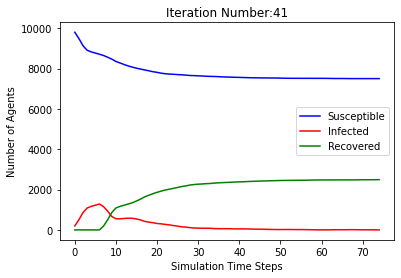

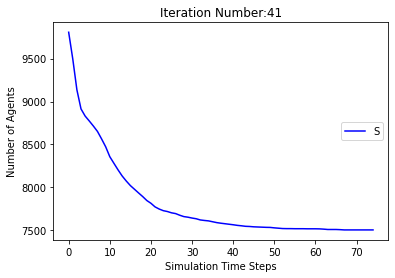

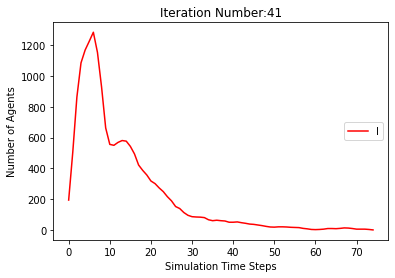

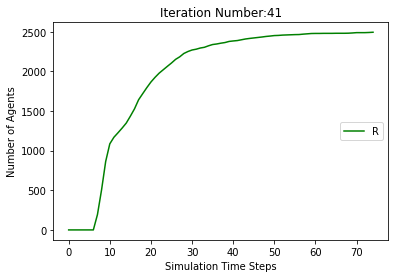

[9806, 9499, 9136, 8926, 8849, 8800, 8735, 8657, 8595, 8519, 8438, 8375, 8328, 8290, 8253, 8220, 8177, 8142, 8116, 8091, 8062, 8036, 8019, 8005, 7990, 7974, 7950, 7935, 7924, 7918, 7916, 7912, 7904, 7895, 7881, 7866, 7856, 7843, 7836, 7834, 7831, 7823, 7818, 7814, 7810, 7809, 7809, 7809, 7809, 7807, 7804, 7800, 7798, 7798, 7798, 7798, 7798, 7797, 7796, 7795, 7795, 7795, 7795, 7795, 7795, 7795, 7795]
[194, 501, 864, 1074, 1151, 1200, 1265, 1149, 904, 617, 488, 474, 472, 445, 404, 375, 342, 296, 259, 237, 228, 217, 201, 172, 152, 142, 141, 127, 112, 101, 89, 78, 70, 55, 54, 58, 62, 73, 76, 70, 64, 58, 48, 42, 33, 27, 25, 22, 14, 11, 10, 10, 11, 11, 11, 11, 9, 7, 4, 3, 3, 3, 3, 3, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 501, 864, 1074, 1151, 1200, 1265, 1343, 1405, 1481, 1562, 1625, 1672, 1710, 1747, 1780, 1823, 1858, 1884, 1909, 1938, 1964, 1981, 1995, 2010, 2026, 2050, 2065, 2076, 2082, 2084, 2088, 2096, 2105, 2119, 2134, 2144, 2157, 2164, 2166, 2169, 2177, 2182, 2186, 2190, 2191, 2191, 219

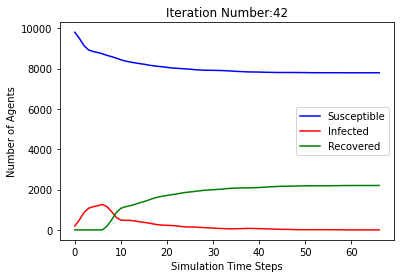

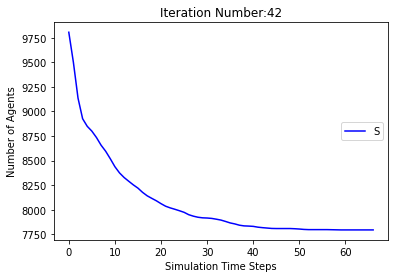

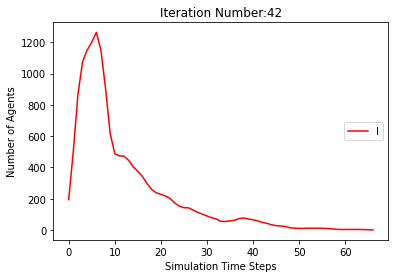

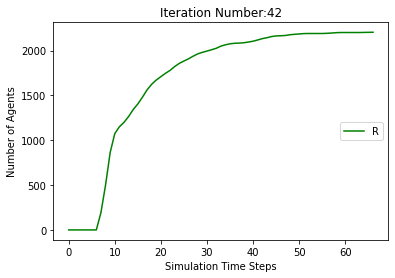

[9806, 9517, 9162, 8939, 8838, 8786, 8735, 8681, 8598, 8530, 8463, 8413, 8369, 8323, 8272, 8236, 8193, 8151, 8125, 8100, 8061, 8029, 8008, 7996, 7987, 7974, 7959, 7941, 7923, 7903, 7892, 7885, 7880, 7871, 7864, 7860, 7856, 7850, 7845, 7836, 7832, 7828, 7822, 7818, 7812, 7809, 7807, 7806, 7806, 7806, 7806, 7806, 7803, 7801, 7799, 7794, 7791, 7787, 7787, 7787, 7786, 7782, 7781, 7781, 7780, 7778, 7778, 7778, 7776, 7773, 7770, 7767, 7766, 7764, 7762, 7761, 7759, 7759, 7756, 7751, 7749, 7747, 7747, 7746, 7743, 7739, 7734, 7732, 7728, 7726, 7722, 7720, 7717, 7712, 7707, 7705, 7701, 7695, 7685, 7684, 7684, 7683, 7680, 7679, 7679, 7679, 7679, 7678, 7678, 7674, 7670, 7668, 7667, 7667, 7664, 7663, 7662, 7662, 7661, 7657, 7652, 7650, 7650, 7650, 7650, 7650, 7650, 7650, 7650]
[194, 483, 838, 1061, 1162, 1214, 1265, 1125, 919, 632, 476, 425, 417, 412, 409, 362, 337, 312, 288, 269, 262, 243, 228, 197, 164, 151, 141, 120, 106, 105, 104, 102, 94, 88, 77, 63, 47, 42, 40, 44, 39, 36, 38, 38, 38, 36, 29,

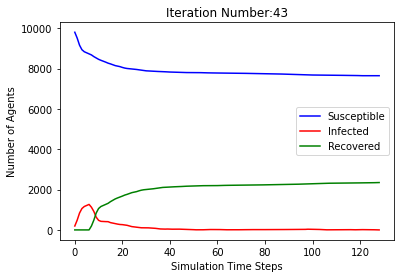

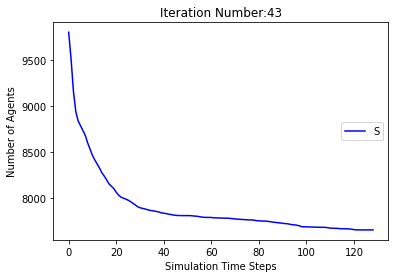

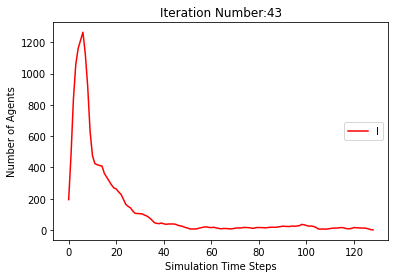

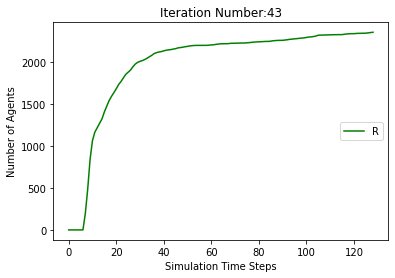

[9806, 9506, 9135, 8903, 8779, 8712, 8641, 8560, 8475, 8415, 8358, 8310, 8256, 8209, 8158, 8115, 8084, 8053, 8014, 7972, 7943, 7915, 7895, 7874, 7854, 7825, 7801, 7777, 7762, 7753, 7746, 7735, 7717, 7709, 7706, 7706, 7703, 7702, 7698, 7693, 7688, 7679, 7673, 7667, 7663, 7660, 7658, 7655, 7652, 7651, 7649, 7646, 7643, 7640, 7636, 7633, 7632, 7631, 7631, 7631, 7631, 7630, 7630, 7630, 7628, 7628, 7627, 7627, 7627, 7627, 7627, 7627, 7627, 7627]
[194, 494, 865, 1097, 1221, 1288, 1359, 1246, 1031, 720, 545, 469, 456, 432, 402, 360, 331, 305, 296, 284, 266, 243, 220, 210, 199, 189, 171, 166, 153, 142, 128, 119, 108, 92, 71, 56, 50, 44, 37, 24, 21, 27, 33, 36, 39, 38, 35, 33, 27, 22, 18, 17, 17, 18, 19, 19, 19, 18, 15, 12, 9, 6, 3, 2, 3, 3, 4, 4, 3, 3, 3, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 494, 865, 1097, 1221, 1288, 1359, 1440, 1525, 1585, 1642, 1690, 1744, 1791, 1842, 1885, 1916, 1947, 1986, 2028, 2057, 2085, 2105, 2126, 2146, 2175, 2199, 2223, 2238, 2247, 2254, 2265, 2283, 2291, 2294, 2294

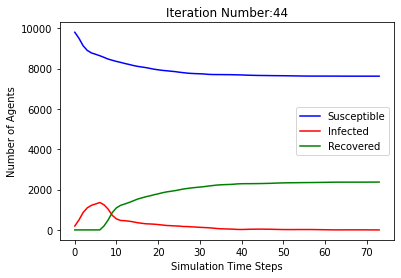

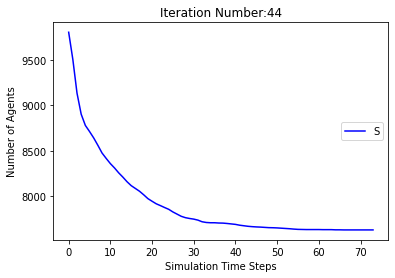

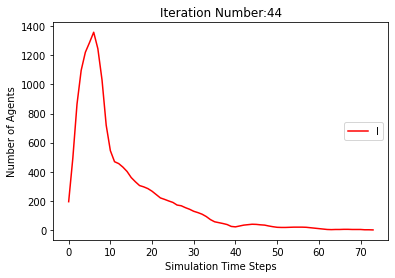

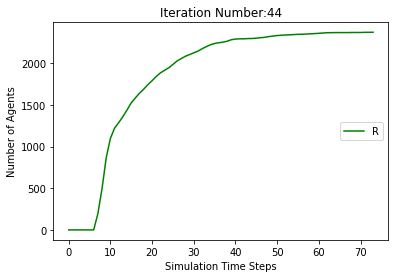

[9806, 9500, 9126, 8911, 8818, 8747, 8670, 8581, 8486, 8415, 8349, 8288, 8250, 8209, 8171, 8143, 8105, 8068, 8033, 7995, 7974, 7962, 7944, 7935, 7921, 7910, 7899, 7890, 7878, 7872, 7864, 7858, 7849, 7845, 7838, 7832, 7828, 7820, 7808, 7794, 7788, 7781, 7771, 7761, 7748, 7734, 7731, 7727, 7725, 7723, 7718, 7715, 7711, 7710, 7707, 7704, 7701, 7698, 7693, 7691, 7691, 7691, 7691, 7690, 7689, 7686, 7683, 7680, 7678, 7678, 7676, 7673, 7673, 7673, 7673, 7673, 7673, 7673, 7673]
[194, 500, 874, 1089, 1182, 1253, 1330, 1225, 1014, 711, 562, 530, 497, 461, 410, 343, 310, 281, 255, 255, 235, 209, 199, 170, 147, 123, 96, 84, 84, 72, 71, 63, 61, 54, 52, 46, 44, 44, 50, 55, 57, 57, 61, 67, 72, 74, 63, 61, 56, 48, 43, 33, 23, 21, 20, 21, 22, 20, 22, 20, 19, 16, 13, 11, 9, 7, 8, 11, 13, 13, 14, 16, 13, 10, 7, 5, 5, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 500, 874, 1089, 1182, 1253, 1330, 1419, 1514, 1585, 1651, 1712, 1750, 1791, 1829, 1857, 1895, 1932, 1967, 2005, 2026, 2038, 2056, 2065, 2079, 2090, 2101, 211

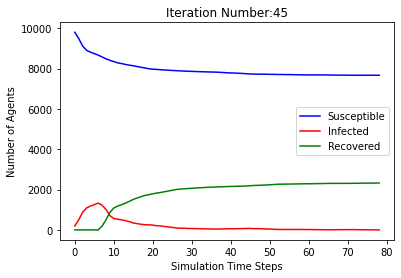

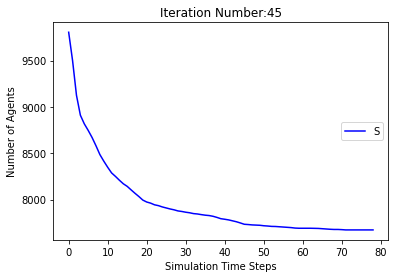

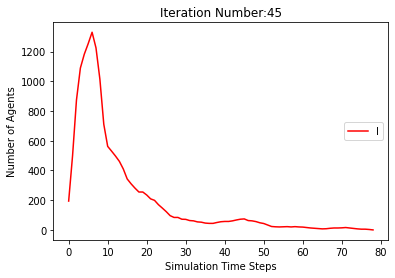

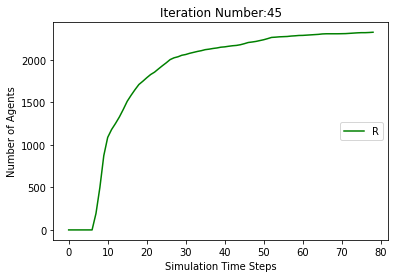

[9806, 9497, 9123, 8917, 8835, 8772, 8707, 8637, 8551, 8484, 8426, 8373, 8302, 8226, 8168, 8126, 8092, 8066, 8039, 8021, 7996, 7975, 7952, 7922, 7894, 7874, 7850, 7838, 7823, 7813, 7798, 7778, 7760, 7751, 7744, 7740, 7732, 7726, 7717, 7707, 7696, 7685, 7670, 7661, 7659, 7654, 7649, 7641, 7638, 7634, 7626, 7623, 7620, 7619, 7619, 7619, 7619, 7617, 7615, 7615, 7615, 7615, 7615, 7614, 7614, 7614, 7614, 7614, 7614, 7614, 7614]
[194, 503, 877, 1083, 1165, 1228, 1293, 1169, 946, 639, 491, 462, 470, 481, 469, 425, 392, 360, 334, 281, 230, 193, 174, 170, 172, 165, 171, 158, 152, 139, 124, 116, 114, 99, 94, 83, 81, 72, 61, 53, 55, 59, 70, 71, 67, 63, 58, 55, 47, 36, 35, 36, 34, 30, 22, 19, 15, 9, 8, 5, 4, 4, 4, 5, 3, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 503, 877, 1083, 1165, 1228, 1293, 1363, 1449, 1516, 1574, 1627, 1698, 1774, 1832, 1874, 1908, 1934, 1961, 1979, 2004, 2025, 2048, 2078, 2106, 2126, 2150, 2162, 2177, 2187, 2202, 2222, 2240, 2249, 2256, 2260, 2268, 2274, 2283, 2293, 2304,

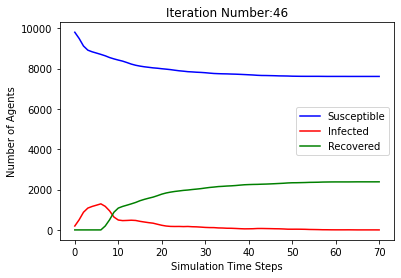

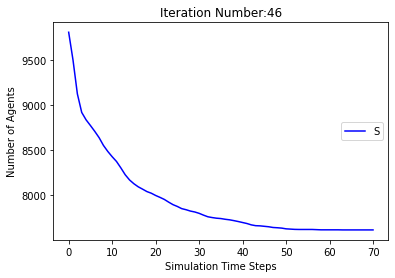

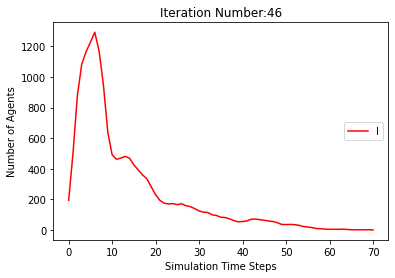

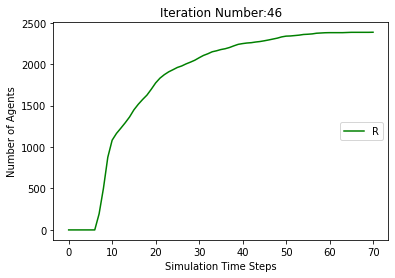

[9806, 9504, 9119, 8900, 8775, 8670, 8587, 8507, 8430, 8357, 8267, 8202, 8123, 8054, 7996, 7950, 7910, 7873, 7846, 7817, 7781, 7744, 7715, 7694, 7673, 7663, 7653, 7644, 7628, 7613, 7608, 7599, 7590, 7581, 7571, 7560, 7550, 7543, 7539, 7537, 7534, 7528, 7527, 7526, 7524, 7516, 7509, 7507, 7504, 7501, 7500, 7498, 7492, 7492, 7492, 7492, 7492, 7492, 7492, 7492]
[194, 496, 881, 1100, 1225, 1330, 1413, 1299, 1074, 762, 633, 573, 547, 533, 511, 480, 447, 394, 356, 306, 273, 252, 235, 216, 200, 183, 164, 137, 116, 102, 86, 74, 73, 72, 73, 68, 63, 65, 60, 53, 47, 43, 33, 24, 19, 23, 28, 27, 24, 26, 26, 26, 24, 17, 15, 12, 9, 8, 6, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 496, 881, 1100, 1225, 1330, 1413, 1493, 1570, 1643, 1733, 1798, 1877, 1946, 2004, 2050, 2090, 2127, 2154, 2183, 2219, 2256, 2285, 2306, 2327, 2337, 2347, 2356, 2372, 2387, 2392, 2401, 2410, 2419, 2429, 2440, 2450, 2457, 2461, 2463, 2466, 2472, 2473, 2474, 2476, 2484, 2491, 2493, 2496, 2499, 2500, 2502, 2508]
[[], [9806, 9515, 9140, 8897,

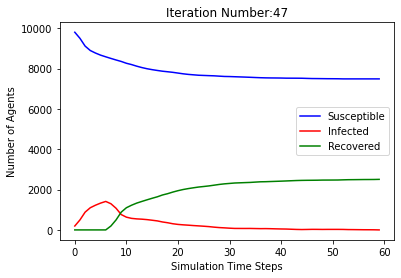

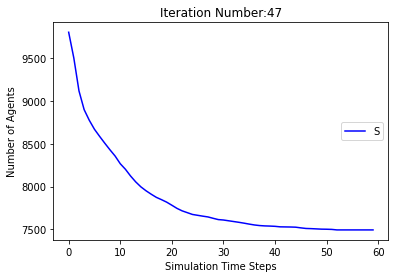

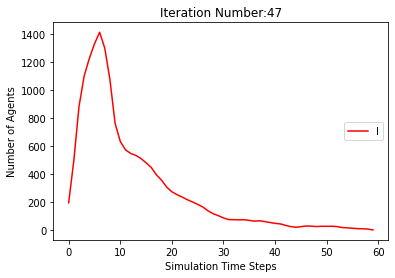

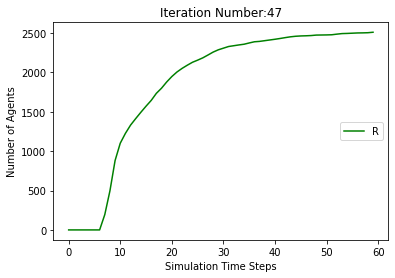

[9806, 9527, 9176, 8944, 8814, 8735, 8666, 8599, 8503, 8422, 8328, 8258, 8200, 8149, 8104, 8046, 7990, 7948, 7906, 7880, 7859, 7814, 7773, 7731, 7698, 7681, 7656, 7628, 7611, 7604, 7592, 7580, 7565, 7547, 7541, 7535, 7529, 7525, 7524, 7519, 7508, 7500, 7495, 7486, 7483, 7482, 7482, 7479, 7473, 7469, 7466, 7464, 7456, 7449, 7447, 7443, 7437, 7431, 7428, 7427, 7420, 7413, 7401, 7392, 7387, 7379, 7371, 7365, 7362, 7360, 7354, 7353, 7353, 7352, 7351, 7348, 7346, 7346, 7345, 7345, 7345, 7345, 7345, 7345, 7345, 7345]
[194, 473, 824, 1056, 1186, 1265, 1334, 1207, 1024, 754, 616, 556, 535, 517, 495, 457, 432, 380, 352, 320, 290, 290, 273, 259, 250, 225, 224, 231, 203, 169, 139, 118, 116, 109, 87, 76, 75, 67, 56, 46, 39, 41, 40, 43, 42, 42, 37, 29, 27, 26, 20, 19, 26, 33, 32, 30, 32, 35, 36, 29, 29, 34, 42, 45, 44, 49, 56, 55, 51, 41, 38, 34, 26, 19, 14, 14, 14, 8, 8, 8, 7, 6, 3, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 473, 824, 1056, 1186, 1265, 1334, 1401, 1497, 1578, 1672, 1742, 1800, 1851, 1896

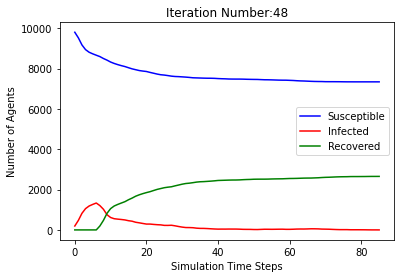

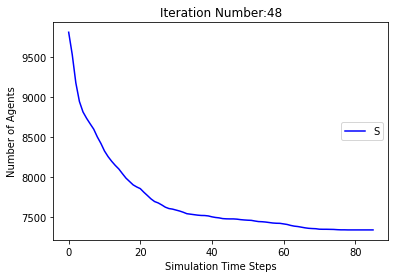

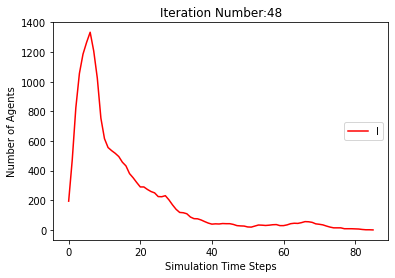

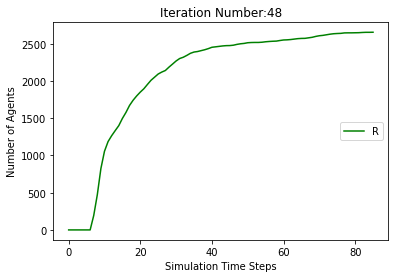

[9806, 9522, 9155, 8921, 8805, 8739, 8650, 8557, 8464, 8377, 8280, 8191, 8135, 8080, 8048, 8015, 7977, 7936, 7901, 7863, 7834, 7811, 7795, 7771, 7752, 7730, 7708, 7686, 7667, 7647, 7632, 7617, 7604, 7592, 7581, 7576, 7571, 7567, 7565, 7562, 7557, 7553, 7546, 7543, 7540, 7534, 7531, 7524, 7514, 7505, 7494, 7486, 7479, 7477, 7473, 7470, 7468, 7466, 7461, 7458, 7456, 7454, 7453, 7452, 7449, 7446, 7441, 7436, 7433, 7429, 7427, 7424, 7420, 7419, 7419, 7419, 7418, 7417, 7417, 7414, 7412, 7412, 7411, 7407, 7401, 7397, 7394, 7391, 7391, 7391, 7390, 7390, 7390, 7390, 7390, 7390, 7390, 7389, 7389, 7389, 7389, 7389, 7389, 7389, 7389]
[194, 478, 845, 1079, 1195, 1261, 1350, 1249, 1058, 778, 641, 614, 604, 570, 509, 449, 400, 344, 290, 272, 246, 237, 220, 206, 184, 171, 155, 148, 144, 148, 139, 135, 126, 116, 105, 91, 76, 65, 52, 42, 35, 28, 30, 28, 27, 31, 31, 33, 39, 41, 49, 54, 55, 54, 51, 44, 37, 28, 25, 21, 21, 19, 17, 16, 17, 15, 17, 20, 21, 24, 25, 25, 26, 22, 17, 14, 11, 10, 7, 6, 7, 7, 8, 

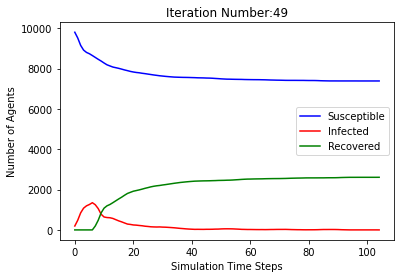

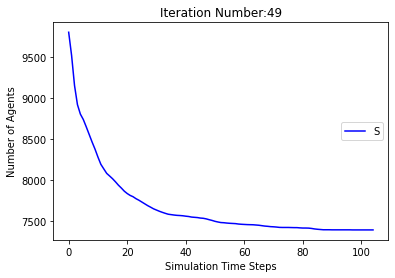

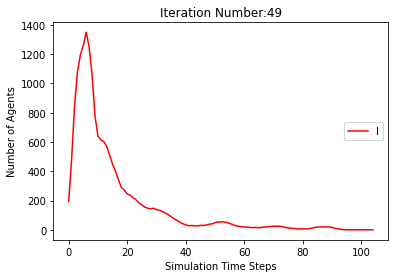

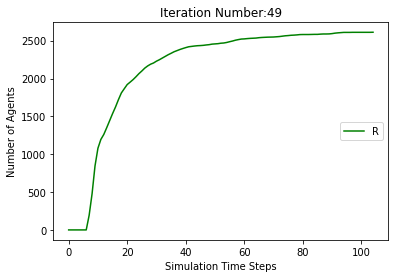

[9806, 9503, 9144, 8920, 8830, 8770, 8709, 8622, 8544, 8469, 8391, 8313, 8267, 8212, 8165, 8111, 8061, 8013, 7966, 7929, 7894, 7868, 7843, 7823, 7791, 7773, 7762, 7746, 7727, 7713, 7705, 7688, 7671, 7660, 7650, 7635, 7622, 7616, 7610, 7602, 7592, 7585, 7584, 7583, 7583, 7583, 7583, 7583, 7582, 7581, 7579, 7578, 7577, 7576, 7574, 7571, 7568, 7568, 7567, 7565, 7560, 7553, 7547, 7543, 7537, 7534, 7528, 7525, 7522, 7519, 7517, 7511, 7508, 7508, 7506, 7505, 7505, 7503, 7502, 7500, 7499, 7495, 7494, 7494, 7494, 7494, 7493, 7492, 7488, 7488, 7485, 7478, 7465, 7462, 7461, 7459, 7453, 7448, 7447, 7446, 7445, 7443, 7437, 7433, 7430, 7427, 7426, 7424, 7421, 7417, 7410, 7404, 7399, 7395, 7391, 7385, 7377, 7370, 7368, 7367, 7363, 7362, 7358, 7358, 7356, 7355, 7353, 7351, 7351, 7350, 7347, 7345, 7344, 7343, 7343, 7342, 7340, 7338, 7336, 7331, 7328, 7326, 7321, 7314, 7309, 7303, 7298, 7295, 7292, 7285, 7281, 7277, 7272, 7264, 7262, 7258, 7254, 7250, 7245, 7243, 7240, 7238, 7238, 7238, 7237, 7237, 723

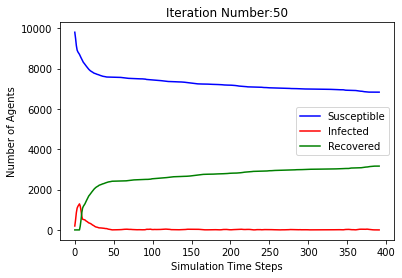

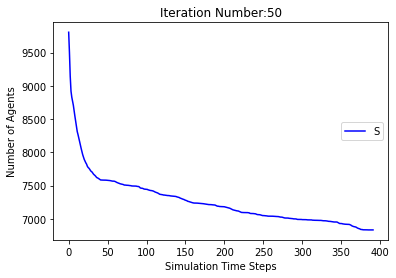

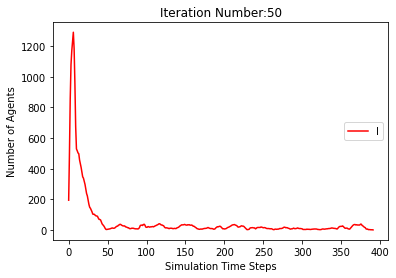

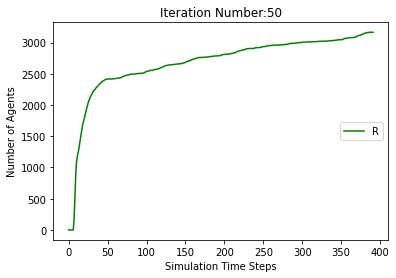

[9806, 9486, 9111, 8889, 8805, 8734, 8676, 8606, 8527, 8451, 8373, 8312, 8263, 8207, 8155, 8109, 8063, 8028, 7998, 7973, 7955, 7937, 7925, 7909, 7899, 7886, 7875, 7866, 7853, 7840, 7832, 7827, 7820, 7805, 7793, 7785, 7780, 7775, 7768, 7759, 7754, 7751, 7749, 7748, 7745, 7737, 7731, 7727, 7726, 7724, 7720, 7716, 7714, 7714, 7713, 7712, 7709, 7707, 7704, 7701, 7700, 7698, 7696, 7695, 7692, 7684, 7678, 7673, 7672, 7667, 7662, 7657, 7656, 7654, 7654, 7654, 7654, 7654, 7653, 7651, 7651, 7651, 7650, 7649, 7648, 7646, 7646, 7646, 7646, 7646, 7646, 7646, 7646]
[194, 514, 889, 1111, 1195, 1266, 1324, 1200, 959, 660, 516, 493, 471, 469, 451, 418, 388, 345, 314, 290, 252, 218, 184, 154, 129, 112, 98, 89, 84, 85, 77, 72, 66, 70, 73, 68, 60, 57, 59, 61, 51, 42, 36, 32, 30, 31, 28, 27, 25, 25, 28, 29, 23, 17, 14, 14, 15, 13, 12, 13, 14, 15, 16, 14, 15, 20, 23, 27, 26, 29, 33, 35, 28, 24, 19, 18, 13, 8, 4, 5, 3, 3, 4, 5, 6, 7, 5, 5, 5, 4, 3, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 514, 889, 1111, 1195, 1266

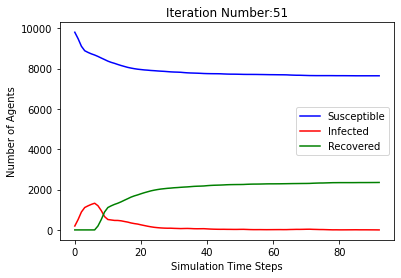

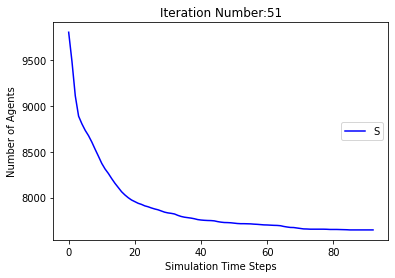

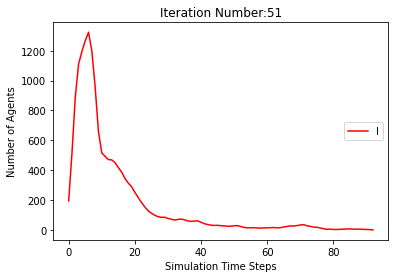

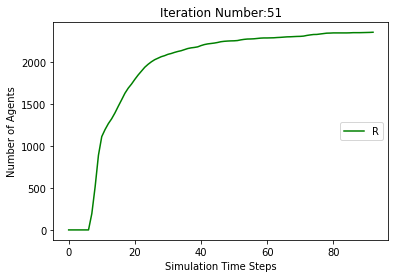

[9806, 9510, 9120, 8880, 8775, 8697, 8634, 8554, 8460, 8363, 8292, 8244, 8194, 8142, 8094, 8051, 8014, 7963, 7926, 7900, 7882, 7853, 7840, 7823, 7809, 7781, 7766, 7751, 7734, 7720, 7707, 7700, 7690, 7685, 7681, 7674, 7667, 7661, 7653, 7643, 7632, 7625, 7623, 7621, 7615, 7611, 7610, 7607, 7604, 7599, 7594, 7590, 7586, 7584, 7584, 7584, 7583, 7580, 7580, 7580, 7580, 7580, 7580, 7580, 7579, 7579, 7579, 7579, 7579, 7579, 7579, 7579]
[194, 490, 880, 1120, 1225, 1303, 1366, 1252, 1050, 757, 588, 531, 503, 492, 460, 409, 349, 329, 318, 294, 260, 241, 211, 191, 154, 145, 134, 131, 119, 120, 116, 109, 91, 81, 70, 60, 53, 46, 47, 47, 53, 56, 51, 46, 46, 42, 33, 25, 21, 24, 27, 25, 25, 26, 23, 20, 16, 14, 10, 6, 4, 4, 4, 3, 1, 1, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 490, 880, 1120, 1225, 1303, 1366, 1446, 1540, 1637, 1708, 1756, 1806, 1858, 1906, 1949, 1986, 2037, 2074, 2100, 2118, 2147, 2160, 2177, 2191, 2219, 2234, 2249, 2266, 2280, 2293, 2300, 2310, 2315, 2319, 2326, 2333, 2339, 2347, 

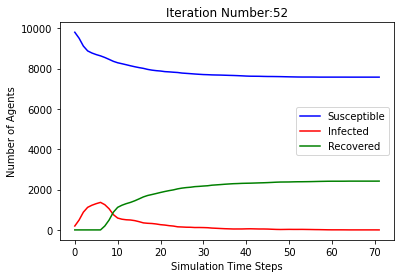

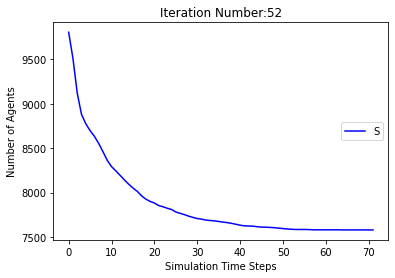

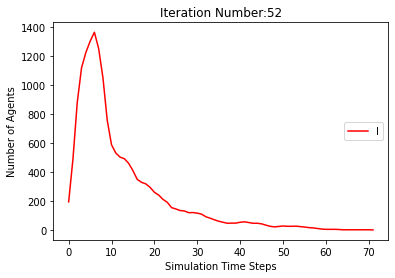

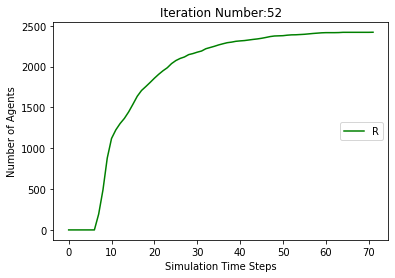

[9806, 9488, 9117, 8872, 8761, 8672, 8567, 8466, 8341, 8230, 8143, 8069, 8011, 7949, 7901, 7838, 7770, 7704, 7653, 7610, 7583, 7563, 7541, 7518, 7494, 7459, 7427, 7406, 7383, 7365, 7352, 7331, 7321, 7312, 7298, 7288, 7277, 7271, 7265, 7253, 7245, 7237, 7227, 7220, 7216, 7209, 7208, 7206, 7202, 7198, 7195, 7194, 7191, 7187, 7185, 7184, 7183, 7182, 7181, 7180, 7177, 7177, 7177, 7177, 7175, 7174, 7170, 7167, 7167, 7167, 7166, 7166, 7166, 7166, 7165, 7165, 7165, 7165, 7165, 7165, 7165, 7165]
[194, 512, 883, 1128, 1239, 1328, 1433, 1340, 1147, 887, 729, 692, 661, 618, 565, 503, 460, 439, 416, 401, 366, 338, 297, 252, 210, 194, 183, 177, 180, 176, 166, 163, 138, 115, 108, 95, 88, 81, 66, 68, 67, 61, 61, 57, 55, 56, 45, 39, 35, 29, 25, 22, 18, 21, 21, 18, 15, 13, 13, 11, 10, 8, 7, 6, 7, 7, 10, 10, 10, 10, 11, 9, 8, 4, 2, 2, 2, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 512, 883, 1128, 1239, 1328, 1433, 1534, 1659, 1770, 1857, 1931, 1989, 2051, 2099, 2162, 2230, 2296, 2347, 2390, 2417, 2437, 24

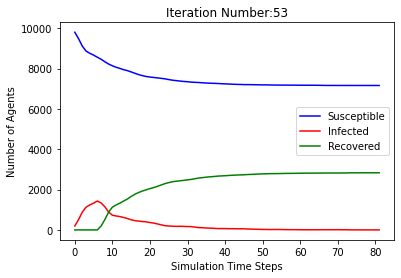

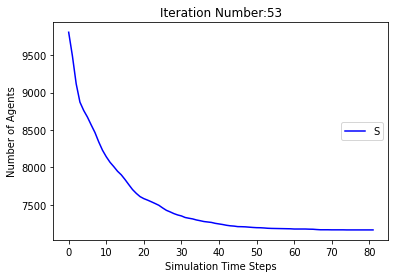

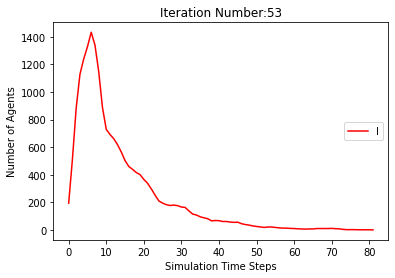

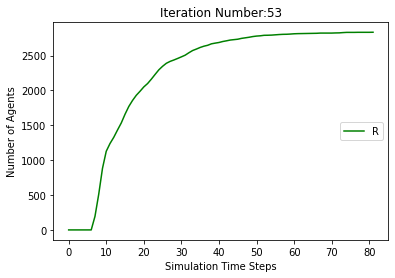

[9806, 9507, 9150, 8932, 8837, 8762, 8689, 8626, 8549, 8470, 8388, 8312, 8251, 8203, 8159, 8128, 8095, 8061, 8045, 8019, 8002, 7983, 7964, 7946, 7930, 7910, 7887, 7866, 7854, 7846, 7835, 7818, 7812, 7805, 7797, 7786, 7780, 7776, 7770, 7768, 7762, 7760, 7759, 7753, 7751, 7749, 7743, 7737, 7734, 7734, 7730, 7727, 7723, 7722, 7719, 7717, 7715, 7712, 7711, 7709, 7706, 7706, 7705, 7705, 7705, 7705, 7705, 7705, 7705, 7704, 7700, 7697, 7696, 7696, 7696, 7696, 7696, 7696, 7696, 7696]
[194, 493, 850, 1068, 1163, 1238, 1311, 1180, 958, 680, 544, 525, 511, 486, 467, 421, 375, 327, 267, 232, 201, 176, 164, 149, 131, 135, 132, 136, 129, 118, 111, 112, 98, 82, 69, 68, 66, 59, 48, 44, 43, 37, 27, 27, 25, 21, 25, 25, 26, 25, 23, 24, 26, 21, 18, 17, 19, 18, 16, 14, 16, 13, 12, 10, 7, 6, 4, 1, 1, 1, 5, 8, 9, 9, 9, 9, 8, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 493, 850, 1068, 1163, 1238, 1311, 1374, 1451, 1530, 1612, 1688, 1749, 1797, 1841, 1872, 1905, 1939, 1955, 1981, 1998, 2017, 2036, 2054, 2070, 2090, 21

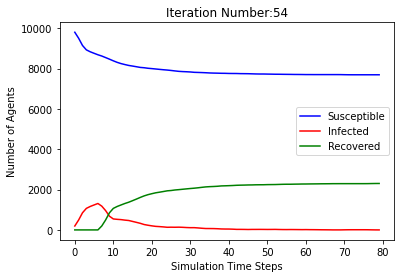

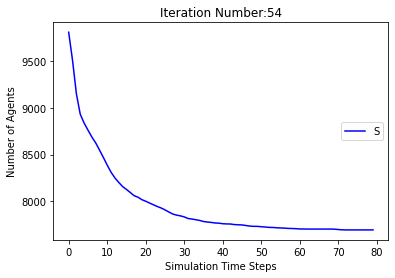

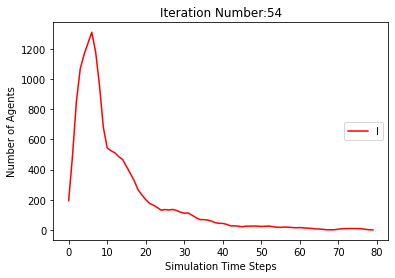

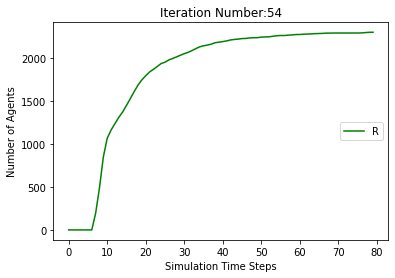

[9806, 9506, 9148, 8932, 8820, 8754, 8696, 8622, 8550, 8468, 8389, 8329, 8271, 8221, 8175, 8122, 8075, 8038, 8006, 7976, 7953, 7934, 7912, 7879, 7845, 7815, 7778, 7755, 7735, 7728, 7721, 7710, 7702, 7691, 7683, 7679, 7673, 7667, 7659, 7652, 7649, 7647, 7645, 7644, 7641, 7639, 7635, 7632, 7629, 7627, 7627, 7627, 7626, 7625, 7625, 7625, 7625, 7625, 7625, 7625, 7625]
[194, 494, 852, 1068, 1180, 1246, 1304, 1184, 956, 680, 543, 491, 483, 475, 447, 428, 393, 351, 323, 295, 268, 241, 210, 196, 193, 191, 198, 198, 199, 184, 158, 135, 113, 87, 72, 56, 55, 54, 51, 50, 42, 36, 34, 29, 26, 20, 17, 17, 18, 18, 17, 14, 13, 10, 7, 4, 2, 2, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 494, 852, 1068, 1180, 1246, 1304, 1378, 1450, 1532, 1611, 1671, 1729, 1779, 1825, 1878, 1925, 1962, 1994, 2024, 2047, 2066, 2088, 2121, 2155, 2185, 2222, 2245, 2265, 2272, 2279, 2290, 2298, 2309, 2317, 2321, 2327, 2333, 2341, 2348, 2351, 2353, 2355, 2356, 2359, 2361, 2365, 2368, 2371, 2373, 2373, 2373, 2374, 2375]
[[], [9806, 95

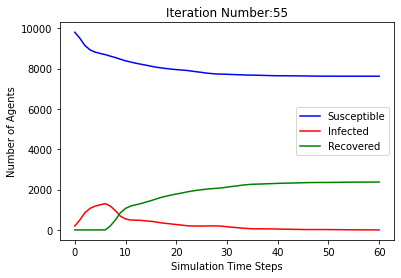

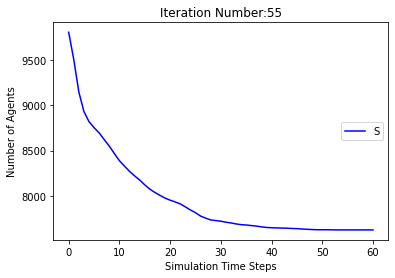

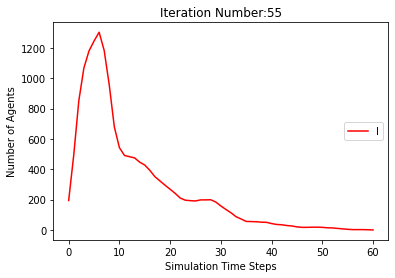

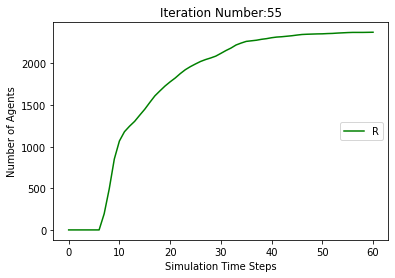

[9806, 9505, 9120, 8888, 8814, 8745, 8664, 8589, 8518, 8451, 8383, 8318, 8258, 8206, 8149, 8099, 8063, 8032, 8001, 7978, 7946, 7914, 7886, 7874, 7858, 7844, 7837, 7831, 7824, 7818, 7809, 7803, 7795, 7786, 7782, 7778, 7772, 7764, 7756, 7751, 7747, 7743, 7737, 7735, 7731, 7729, 7727, 7726, 7726, 7726, 7726, 7725, 7721, 7718, 7713, 7709, 7707, 7703, 7693, 7683, 7681, 7680, 7680, 7680, 7680, 7679, 7679, 7678, 7675, 7673, 7672, 7671, 7670, 7666, 7666, 7664, 7663, 7661, 7660, 7660, 7660, 7660, 7659, 7656, 7652, 7649, 7645, 7642, 7637, 7636, 7633, 7630, 7627, 7626, 7625, 7625, 7625, 7625, 7625, 7625, 7625, 7625]
[194, 495, 880, 1112, 1186, 1255, 1336, 1217, 987, 669, 505, 496, 487, 458, 440, 419, 388, 351, 317, 280, 260, 235, 213, 189, 174, 157, 141, 115, 90, 68, 65, 55, 49, 51, 49, 46, 46, 45, 47, 44, 39, 39, 41, 37, 33, 27, 24, 21, 17, 11, 9, 6, 8, 9, 13, 17, 19, 23, 32, 38, 37, 33, 29, 27, 23, 14, 4, 3, 5, 7, 8, 9, 9, 13, 12, 11, 10, 11, 11, 10, 6, 6, 5, 7, 9, 11, 15, 18, 23, 23, 23, 22, 2

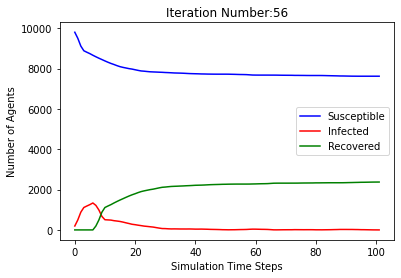

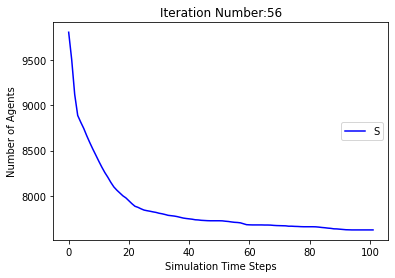

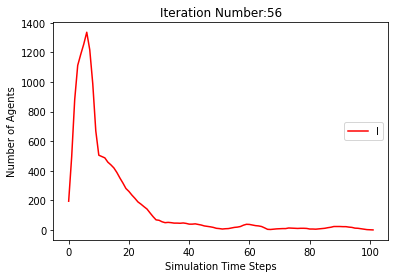

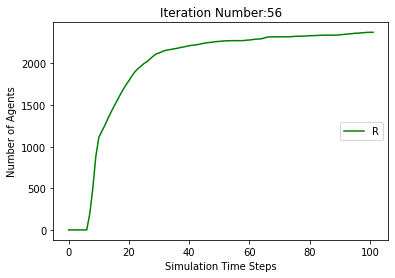

[9806, 9524, 9160, 8920, 8824, 8734, 8669, 8582, 8487, 8414, 8339, 8283, 8223, 8165, 8120, 8065, 8010, 7953, 7912, 7876, 7839, 7805, 7781, 7752, 7725, 7694, 7673, 7654, 7642, 7637, 7629, 7612, 7600, 7592, 7585, 7579, 7574, 7566, 7561, 7550, 7540, 7534, 7532, 7529, 7526, 7520, 7513, 7505, 7505, 7505, 7504, 7502, 7498, 7496, 7492, 7489, 7486, 7482, 7478, 7473, 7473, 7472, 7471, 7471, 7466, 7461, 7458, 7457, 7456, 7453, 7451, 7451, 7451, 7451, 7451, 7449, 7448, 7448, 7448, 7448, 7448, 7448, 7448, 7448]
[194, 476, 840, 1080, 1176, 1266, 1331, 1224, 1037, 746, 581, 541, 511, 504, 462, 422, 404, 386, 371, 347, 326, 315, 284, 258, 228, 218, 203, 185, 163, 144, 123, 113, 94, 81, 69, 63, 63, 63, 51, 50, 52, 51, 47, 45, 40, 41, 37, 35, 29, 27, 25, 24, 22, 17, 13, 16, 19, 22, 24, 25, 23, 20, 18, 15, 16, 17, 15, 16, 16, 18, 20, 15, 10, 7, 6, 7, 5, 3, 3, 3, 3, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 476, 840, 1080, 1176, 1266, 1331, 1418, 1513, 1586, 1661, 1717, 1777, 1835, 1880, 1935, 1990, 2047, 2088

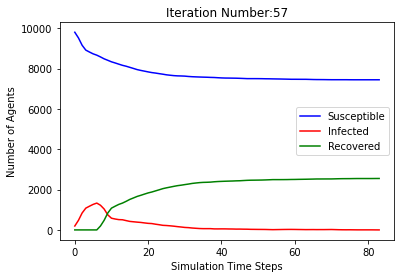

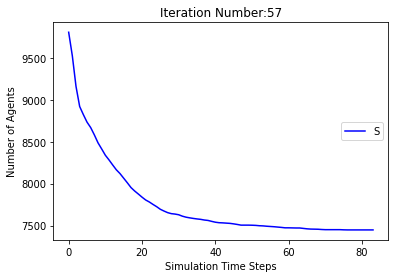

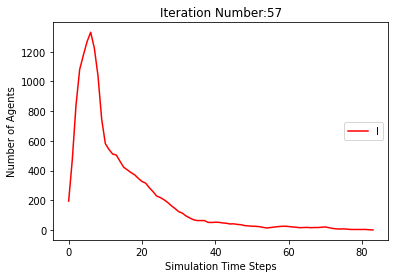

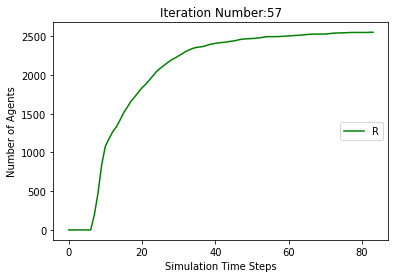

[9806, 9499, 9133, 8915, 8806, 8727, 8636, 8539, 8460, 8393, 8338, 8282, 8227, 8181, 8144, 8100, 8056, 8021, 7990, 7955, 7936, 7909, 7887, 7868, 7847, 7832, 7818, 7805, 7795, 7788, 7780, 7775, 7764, 7759, 7754, 7749, 7741, 7737, 7734, 7728, 7723, 7720, 7719, 7719, 7718, 7717, 7717, 7716, 7716, 7715, 7715, 7715, 7715, 7715, 7715, 7715, 7715]
[194, 501, 867, 1085, 1194, 1273, 1364, 1267, 1039, 740, 577, 524, 500, 455, 395, 360, 337, 317, 292, 272, 245, 235, 213, 188, 174, 158, 137, 131, 114, 99, 88, 72, 68, 59, 51, 46, 47, 43, 41, 36, 36, 34, 30, 22, 19, 17, 11, 7, 4, 4, 4, 3, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 501, 867, 1085, 1194, 1273, 1364, 1461, 1540, 1607, 1662, 1718, 1773, 1819, 1856, 1900, 1944, 1979, 2010, 2045, 2064, 2091, 2113, 2132, 2153, 2168, 2182, 2195, 2205, 2212, 2220, 2225, 2236, 2241, 2246, 2251, 2259, 2263, 2266, 2272, 2277, 2280, 2281, 2281, 2282, 2283, 2283, 2284, 2284, 2285]
[[], [9806, 9515, 9140, 8897, 8803, 8738, 8666, 8595, 8522, 8450, 8380, 8301, 8229, 

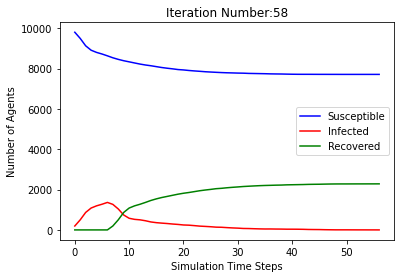

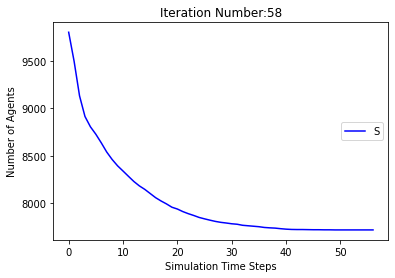

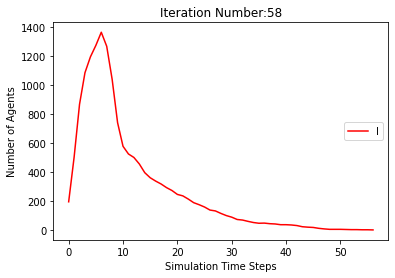

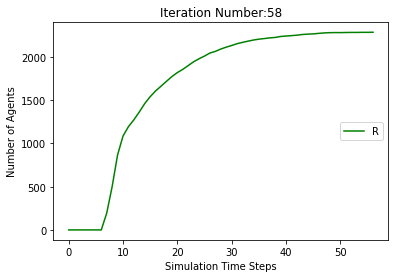

[9806, 9520, 9155, 8918, 8815, 8740, 8659, 8547, 8441, 8334, 8268, 8214, 8173, 8131, 8083, 8030, 7983, 7942, 7907, 7886, 7866, 7849, 7826, 7810, 7787, 7772, 7757, 7743, 7734, 7721, 7708, 7697, 7688, 7680, 7678, 7668, 7662, 7650, 7641, 7640, 7639, 7639, 7634, 7628, 7622, 7621, 7620, 7620, 7617, 7616, 7613, 7613, 7612, 7612, 7610, 7610, 7610, 7610, 7608, 7607, 7600, 7598, 7598, 7597, 7597, 7597, 7597, 7597, 7597, 7597, 7597]
[194, 480, 845, 1082, 1185, 1260, 1341, 1259, 1079, 821, 650, 601, 567, 528, 464, 411, 351, 326, 307, 287, 265, 234, 204, 173, 155, 135, 129, 123, 115, 105, 102, 90, 84, 77, 65, 66, 59, 58, 56, 48, 41, 39, 34, 34, 28, 20, 20, 19, 22, 18, 15, 9, 9, 8, 10, 7, 6, 3, 5, 5, 12, 12, 12, 13, 13, 11, 10, 3, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 480, 845, 1082, 1185, 1260, 1341, 1453, 1559, 1666, 1732, 1786, 1827, 1869, 1917, 1970, 2017, 2058, 2093, 2114, 2134, 2151, 2174, 2190, 2213, 2228, 2243, 2257, 2266, 2279, 2292, 2303, 2312, 2320, 2322, 2332, 2338, 2350, 2359, 2360, 2361

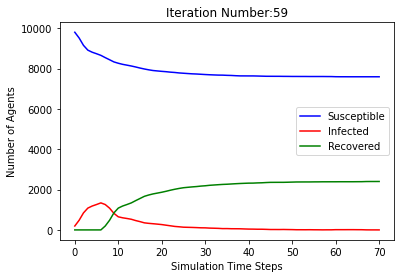

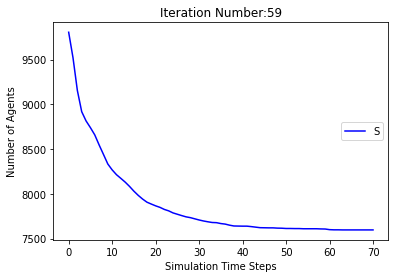

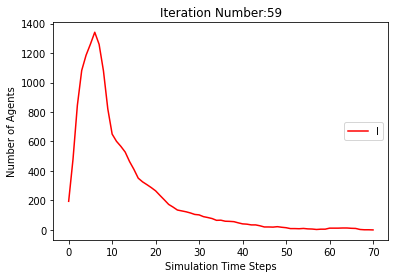

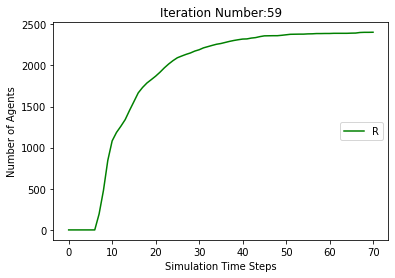

[9806, 9500, 9122, 8907, 8808, 8737, 8661, 8578, 8487, 8401, 8330, 8283, 8234, 8189, 8152, 8115, 8090, 8063, 8030, 8007, 7986, 7962, 7941, 7931, 7925, 7914, 7901, 7884, 7876, 7867, 7860, 7858, 7857, 7855, 7845, 7837, 7826, 7819, 7813, 7811, 7805, 7803, 7800, 7794, 7791, 7790, 7790, 7789, 7789, 7789, 7788, 7788, 7788, 7788, 7788, 7788, 7788, 7788]
[194, 500, 878, 1093, 1192, 1263, 1339, 1228, 1013, 721, 577, 525, 503, 472, 426, 372, 311, 267, 253, 227, 203, 190, 174, 159, 138, 116, 106, 102, 86, 74, 71, 67, 57, 46, 39, 39, 41, 41, 45, 46, 50, 42, 37, 32, 28, 23, 21, 16, 14, 11, 6, 3, 2, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 500, 878, 1093, 1192, 1263, 1339, 1422, 1513, 1599, 1670, 1717, 1766, 1811, 1848, 1885, 1910, 1937, 1970, 1993, 2014, 2038, 2059, 2069, 2075, 2086, 2099, 2116, 2124, 2133, 2140, 2142, 2143, 2145, 2155, 2163, 2174, 2181, 2187, 2189, 2195, 2197, 2200, 2206, 2209, 2210, 2210, 2211, 2211, 2211, 2212]
[[], [9806, 9515, 9140, 8897, 8803, 8738, 8666, 8595, 8522, 8450, 8

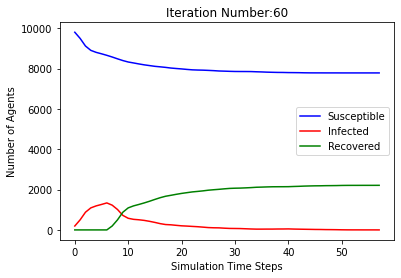

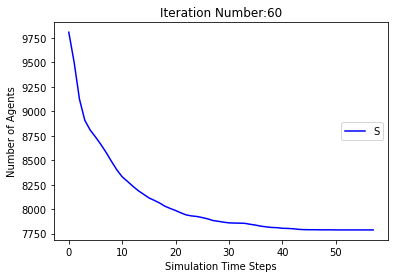

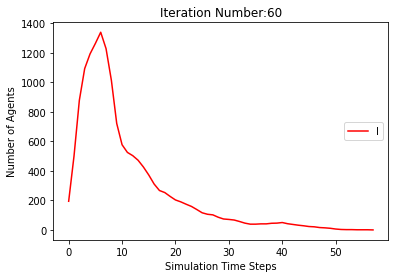

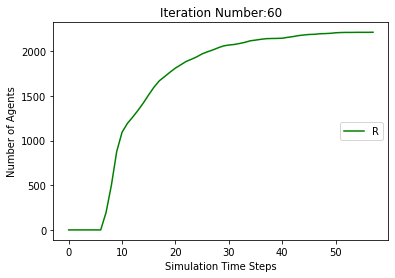

[9806, 9481, 9116, 8911, 8810, 8734, 8670, 8606, 8536, 8457, 8377, 8324, 8284, 8223, 8170, 8139, 8104, 8066, 8034, 7986, 7949, 7929, 7918, 7900, 7881, 7858, 7831, 7807, 7792, 7781, 7770, 7763, 7755, 7748, 7739, 7731, 7725, 7720, 7715, 7705, 7695, 7691, 7687, 7683, 7678, 7675, 7665, 7663, 7659, 7657, 7656, 7656, 7656, 7654, 7652, 7651, 7650, 7650, 7650, 7650, 7650, 7650, 7650, 7650]
[194, 519, 884, 1089, 1190, 1266, 1330, 1200, 945, 659, 534, 486, 450, 447, 436, 397, 353, 311, 290, 298, 274, 241, 221, 204, 185, 176, 155, 142, 137, 137, 130, 118, 103, 83, 68, 61, 56, 50, 48, 50, 53, 48, 44, 42, 42, 40, 40, 32, 32, 30, 27, 22, 19, 11, 11, 8, 7, 6, 6, 6, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 519, 884, 1089, 1190, 1266, 1330, 1394, 1464, 1543, 1623, 1676, 1716, 1777, 1830, 1861, 1896, 1934, 1966, 2014, 2051, 2071, 2082, 2100, 2119, 2142, 2169, 2193, 2208, 2219, 2230, 2237, 2245, 2252, 2261, 2269, 2275, 2280, 2285, 2295, 2305, 2309, 2313, 2317, 2322, 2325, 2335, 2337, 2341, 2343, 2344, 2344

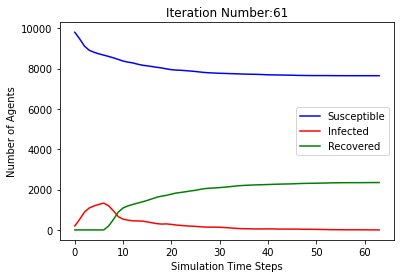

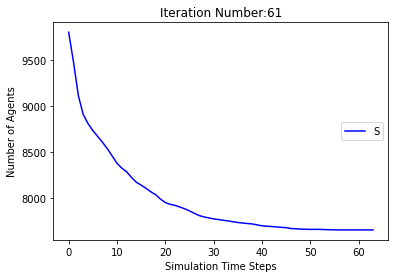

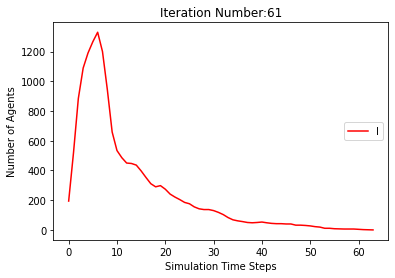

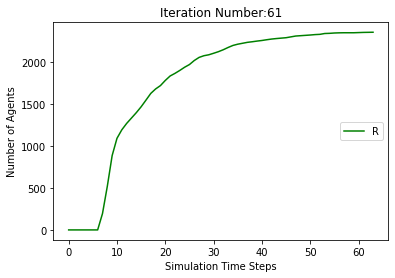

[9806, 9503, 9114, 8902, 8817, 8733, 8652, 8587, 8497, 8405, 8321, 8259, 8185, 8127, 8081, 8033, 7996, 7959, 7928, 7901, 7874, 7860, 7841, 7822, 7810, 7796, 7788, 7779, 7773, 7770, 7769, 7768, 7768, 7766, 7760, 7756, 7751, 7750, 7749, 7749, 7748, 7748, 7744, 7740, 7736, 7734, 7734, 7733, 7733, 7733, 7732, 7730, 7729, 7728, 7727, 7720, 7718, 7718, 7718, 7717, 7717, 7717, 7715, 7708, 7705, 7702, 7702, 7702, 7702, 7701, 7700, 7700, 7699, 7699, 7699, 7699, 7699, 7699, 7698, 7698, 7698, 7697, 7697, 7697, 7695, 7694, 7694, 7693, 7691, 7690, 7690, 7687, 7684, 7679, 7675, 7674, 7673, 7670, 7667, 7663, 7662, 7662, 7662, 7662, 7662, 7661, 7660, 7658, 7654, 7650, 7644, 7643, 7643, 7642, 7640, 7640, 7640, 7638, 7635, 7632, 7631, 7629, 7627, 7624, 7621, 7618, 7618, 7618, 7618, 7618, 7618, 7618, 7617, 7614, 7612, 7611, 7611, 7611, 7611, 7609, 7609, 7609, 7609, 7609, 7609, 7609, 7608, 7607, 7606, 7605, 7604, 7602, 7600, 7600, 7599, 7599, 7599, 7599, 7599, 7599, 7598, 7598, 7597, 7597, 7597, 7597, 759

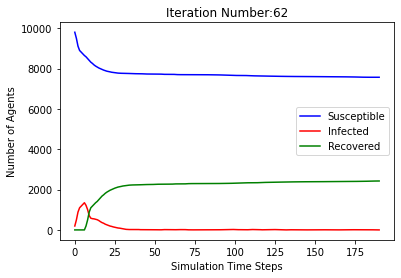

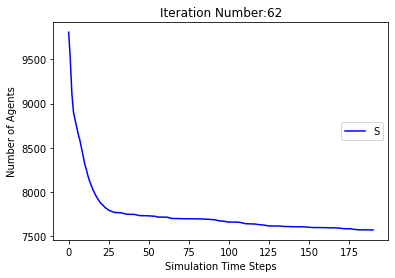

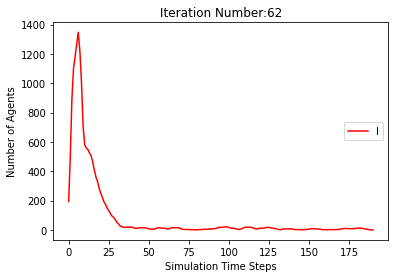

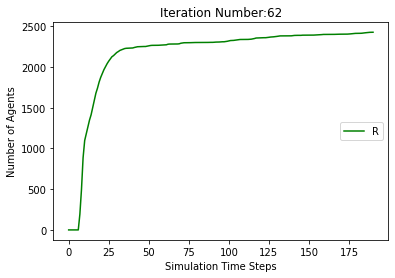

[9806, 9507, 9140, 8937, 8837, 8758, 8667, 8577, 8470, 8384, 8302, 8230, 8161, 8098, 8037, 7980, 7937, 7896, 7868, 7834, 7793, 7758, 7736, 7715, 7688, 7659, 7638, 7623, 7607, 7586, 7570, 7559, 7546, 7540, 7533, 7527, 7520, 7513, 7508, 7501, 7492, 7484, 7479, 7472, 7472, 7470, 7470, 7470, 7470, 7470, 7470, 7470, 7470]
[194, 493, 860, 1063, 1163, 1242, 1333, 1229, 1037, 756, 635, 607, 597, 569, 540, 490, 447, 406, 362, 327, 305, 279, 244, 222, 208, 209, 196, 170, 151, 150, 145, 129, 113, 98, 90, 80, 66, 57, 51, 45, 48, 49, 48, 48, 41, 38, 31, 22, 14, 9, 2, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 493, 860, 1063, 1163, 1242, 1333, 1423, 1530, 1616, 1698, 1770, 1839, 1902, 1963, 2020, 2063, 2104, 2132, 2166, 2207, 2242, 2264, 2285, 2312, 2341, 2362, 2377, 2393, 2414, 2430, 2441, 2454, 2460, 2467, 2473, 2480, 2487, 2492, 2499, 2508, 2516, 2521, 2528, 2528, 2530]
[[], [9806, 9515, 9140, 8897, 8803, 8738, 8666, 8595, 8522, 8450, 8380, 8301, 8229, 8203, 8183, 8150, 8117, 8085, 8054, 8026, 8002, 7977, 

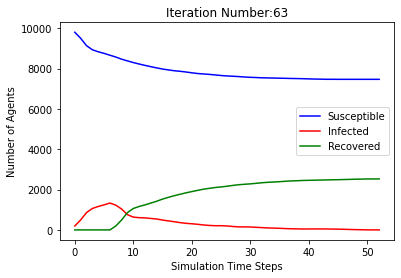

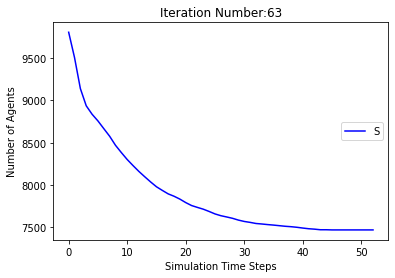

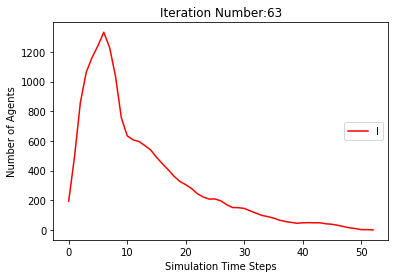

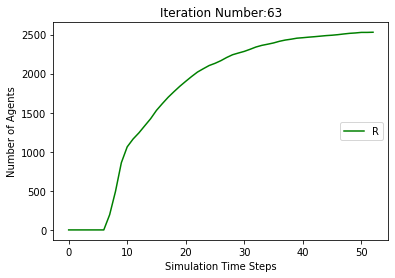

[9806, 9483, 9108, 8910, 8845, 8801, 8739, 8678, 8609, 8538, 8455, 8391, 8331, 8269, 8219, 8172, 8123, 8082, 8052, 8024, 8001, 7975, 7955, 7937, 7917, 7903, 7881, 7869, 7858, 7842, 7821, 7802, 7787, 7770, 7752, 7731, 7719, 7707, 7694, 7680, 7667, 7659, 7655, 7651, 7651, 7651, 7649, 7645, 7642, 7637, 7635, 7634, 7632, 7627, 7624, 7620, 7620, 7620, 7619, 7617, 7616, 7614, 7613, 7612, 7607, 7599, 7593, 7590, 7590, 7586, 7581, 7575, 7571, 7569, 7568, 7562, 7559, 7554, 7550, 7548, 7547, 7542, 7539, 7535, 7533, 7529, 7526, 7525, 7521, 7517, 7516, 7515, 7513, 7513, 7513, 7513, 7513, 7513, 7512, 7512, 7512, 7512, 7512, 7511, 7510, 7510, 7509, 7507, 7506, 7505, 7505, 7505, 7505, 7505, 7504, 7504, 7504, 7504, 7504, 7504, 7504, 7504]
[194, 517, 892, 1090, 1155, 1199, 1261, 1128, 874, 570, 455, 454, 470, 470, 459, 437, 415, 373, 339, 307, 268, 244, 217, 186, 165, 149, 143, 132, 117, 113, 116, 115, 116, 111, 117, 127, 123, 114, 108, 107, 103, 93, 76, 68, 56, 43, 31, 22, 17, 18, 16, 17, 19, 22, 21, 

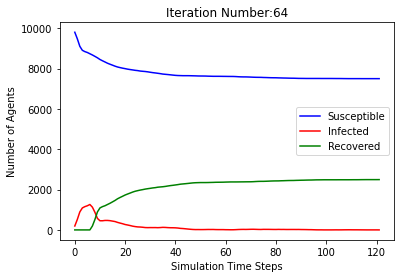

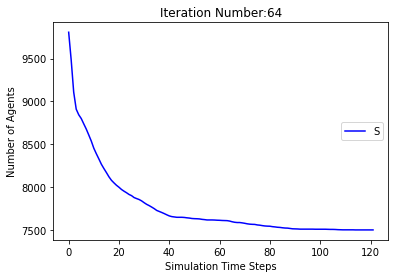

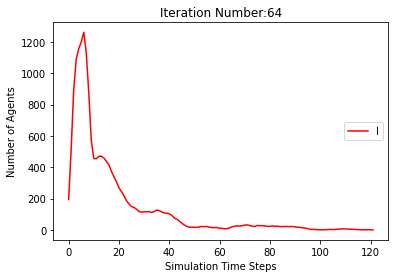

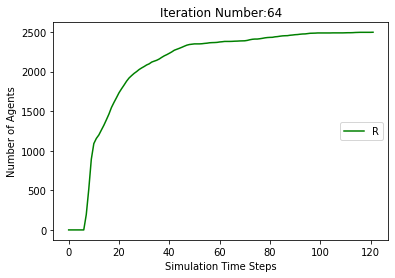

[9806, 9493, 9127, 8887, 8779, 8694, 8620, 8545, 8476, 8406, 8337, 8284, 8248, 8214, 8171, 8131, 8095, 8069, 8047, 8032, 8011, 7996, 7975, 7959, 7947, 7935, 7922, 7909, 7891, 7881, 7868, 7860, 7857, 7851, 7840, 7836, 7833, 7826, 7820, 7815, 7813, 7811, 7809, 7806, 7805, 7802, 7801, 7798, 7796, 7795, 7793, 7792, 7791, 7791, 7790, 7790, 7788, 7786, 7785, 7783, 7783, 7783, 7783, 7783, 7783, 7783, 7782, 7782, 7781, 7780, 7774, 7773, 7771, 7771, 7770, 7767, 7766, 7764, 7763, 7757, 7750, 7748, 7748, 7748, 7748, 7748, 7745, 7745, 7744, 7743, 7742, 7741, 7741, 7741, 7741, 7739, 7738, 7736, 7734, 7731, 7730, 7727, 7726, 7726, 7726, 7726, 7725, 7725, 7725, 7725, 7725, 7725, 7724, 7724, 7723, 7723, 7722, 7719, 7715, 7714, 7714, 7714, 7714, 7714, 7714, 7714, 7712, 7711, 7711, 7710, 7709, 7707, 7705, 7703, 7701, 7700, 7699, 7698, 7697, 7695, 7690, 7680, 7676, 7674, 7674, 7674, 7674, 7672, 7670, 7667, 7667, 7667, 7667, 7666, 7666, 7665, 7665, 7665, 7665, 7665, 7665, 7665, 7665]
[194, 507, 873, 1113,

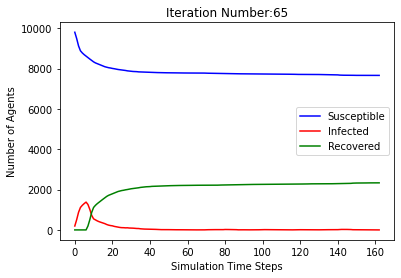

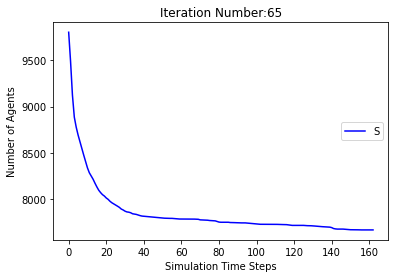

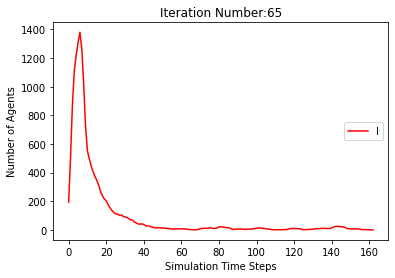

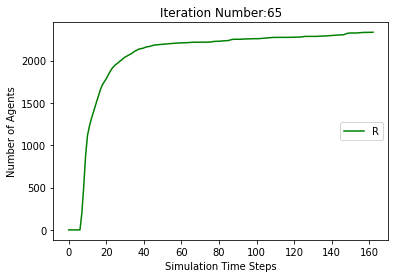

[9806, 9483, 9112, 8882, 8786, 8721, 8645, 8557, 8452, 8366, 8275, 8203, 8138, 8100, 8039, 7981, 7922, 7882, 7836, 7805, 7783, 7762, 7747, 7732, 7718, 7705, 7698, 7687, 7673, 7659, 7650, 7641, 7633, 7626, 7616, 7613, 7611, 7610, 7609, 7608, 7608, 7606, 7606, 7606, 7606, 7604, 7600, 7597, 7596, 7595, 7594, 7593, 7592, 7592, 7589, 7587, 7586, 7585, 7582, 7578, 7575, 7572, 7571, 7567, 7564, 7562, 7559, 7556, 7556, 7556, 7555, 7554, 7553, 7552, 7549, 7547, 7543, 7537, 7535, 7535, 7534, 7534, 7534, 7532, 7529, 7527, 7524, 7520, 7519, 7519, 7519, 7518, 7514, 7513, 7513, 7513, 7512, 7512, 7512, 7512, 7512, 7512, 7512, 7511, 7511, 7510, 7510, 7510, 7509, 7509, 7509, 7509, 7509, 7509, 7509, 7509]
[194, 517, 888, 1118, 1214, 1279, 1355, 1249, 1031, 746, 607, 583, 583, 545, 518, 471, 444, 393, 367, 333, 317, 277, 234, 190, 164, 131, 107, 96, 89, 88, 82, 77, 72, 72, 71, 60, 48, 40, 32, 25, 18, 10, 7, 5, 4, 5, 8, 11, 10, 11, 12, 13, 12, 8, 8, 9, 9, 9, 11, 14, 17, 17, 16, 19, 21, 20, 19, 19, 16, 15,

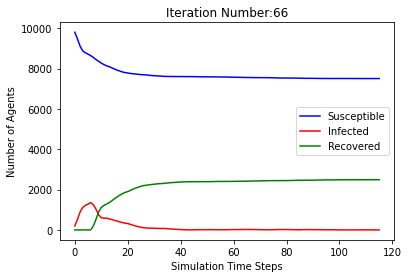

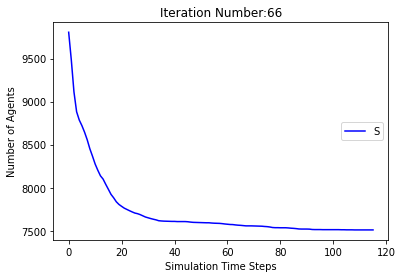

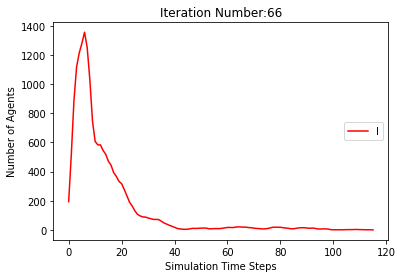

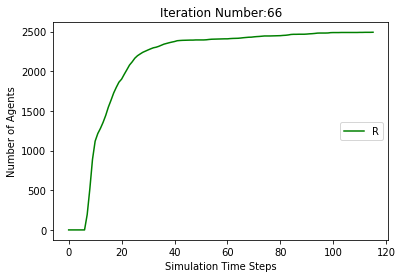

[9806, 9520, 9142, 8924, 8847, 8794, 8742, 8675, 8601, 8532, 8451, 8387, 8331, 8283, 8235, 8193, 8161, 8131, 8097, 8062, 8027, 8006, 7992, 7982, 7972, 7964, 7952, 7941, 7929, 7915, 7909, 7903, 7902, 7897, 7889, 7881, 7878, 7877, 7877, 7875, 7873, 7870, 7868, 7867, 7867, 7867, 7867, 7867, 7866, 7866, 7866, 7866, 7866, 7866, 7866, 7866]
[194, 480, 858, 1076, 1153, 1206, 1258, 1131, 919, 610, 473, 460, 463, 459, 440, 408, 371, 320, 290, 269, 256, 229, 201, 179, 159, 133, 110, 86, 77, 77, 73, 69, 62, 55, 52, 48, 37, 32, 26, 27, 24, 19, 13, 11, 10, 10, 8, 6, 4, 2, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 480, 858, 1076, 1153, 1206, 1258, 1325, 1399, 1468, 1549, 1613, 1669, 1717, 1765, 1807, 1839, 1869, 1903, 1938, 1973, 1994, 2008, 2018, 2028, 2036, 2048, 2059, 2071, 2085, 2091, 2097, 2098, 2103, 2111, 2119, 2122, 2123, 2123, 2125, 2127, 2130, 2132, 2133, 2133, 2133, 2133, 2133, 2134]
[[], [9806, 9515, 9140, 8897, 8803, 8738, 8666, 8595, 8522, 8450, 8380, 8301, 8229, 8203, 8183, 8150, 8

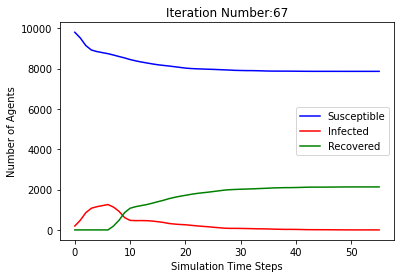

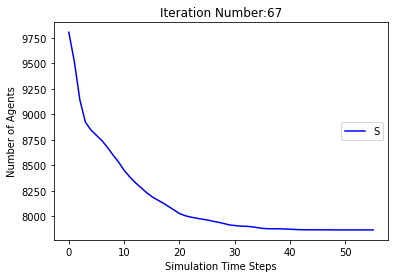

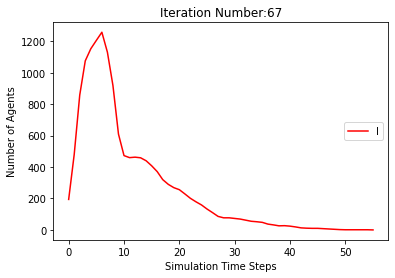

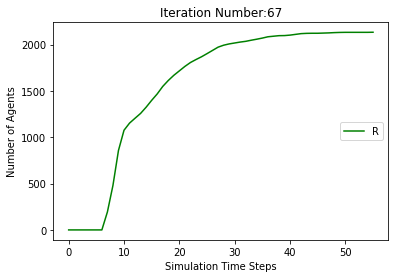

[9806, 9506, 9129, 8916, 8812, 8733, 8637, 8532, 8439, 8374, 8309, 8250, 8208, 8150, 8105, 8067, 8024, 7982, 7944, 7918, 7882, 7858, 7833, 7807, 7777, 7746, 7719, 7694, 7669, 7649, 7635, 7617, 7604, 7590, 7575, 7570, 7563, 7556, 7550, 7547, 7546, 7544, 7543, 7537, 7529, 7524, 7522, 7519, 7515, 7513, 7511, 7509, 7506, 7506, 7506, 7505, 7505, 7505, 7505, 7504, 7503, 7502, 7499, 7498, 7497, 7494, 7493, 7491, 7491, 7490, 7490, 7489, 7488, 7486, 7485, 7484, 7482, 7480, 7479, 7477, 7477, 7477, 7477, 7475, 7474, 7473, 7470, 7466, 7465, 7464, 7462, 7461, 7460, 7460, 7460, 7460, 7460, 7458, 7456, 7454, 7452, 7451, 7449, 7445, 7441, 7437, 7435, 7434, 7434, 7434, 7434, 7432, 7428, 7423, 7419, 7418, 7413, 7406, 7404, 7403, 7403, 7402, 7400, 7400, 7399, 7393, 7393, 7393, 7392, 7391, 7390, 7387, 7380, 7374, 7371, 7369, 7368, 7367, 7364, 7362, 7360, 7358, 7358, 7358, 7357, 7356, 7356, 7356, 7355, 7354, 7352, 7346, 7342, 7339, 7338, 7335, 7333, 7331, 7328, 7327, 7327, 7327, 7327, 7327, 7326, 7324, 732

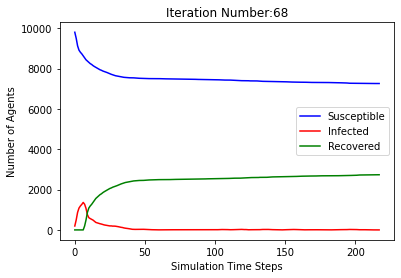

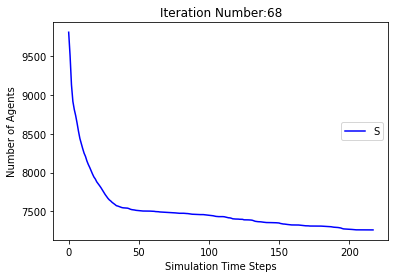

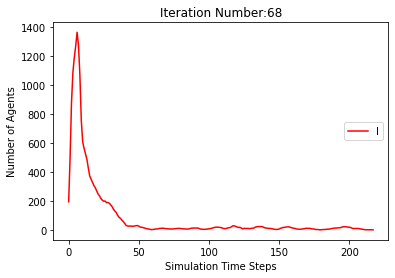

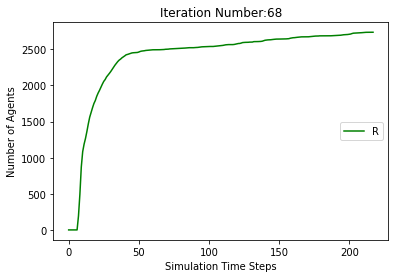

[9806, 9483, 9118, 8911, 8816, 8737, 8647, 8544, 8441, 8357, 8290, 8210, 8139, 8095, 8058, 8029, 7985, 7938, 7909, 7867, 7832, 7795, 7771, 7747, 7733, 7721, 7711, 7705, 7695, 7689, 7675, 7657, 7642, 7635, 7634, 7632, 7631, 7628, 7628, 7628, 7627, 7624, 7621, 7619, 7617, 7615, 7614, 7612, 7612, 7611, 7609, 7608, 7607, 7606, 7605, 7602, 7597, 7596, 7595, 7595, 7595, 7595, 7595, 7594, 7593, 7593, 7591, 7590, 7590, 7590, 7588, 7586, 7586, 7586, 7585, 7585, 7585, 7584, 7584, 7584, 7584, 7583, 7583, 7583, 7581, 7581, 7581, 7581, 7581, 7581, 7580, 7578, 7574, 7570, 7570, 7567, 7566, 7565, 7563, 7563, 7561, 7560, 7558, 7555, 7555, 7555, 7555, 7555, 7555, 7553, 7552, 7549, 7547, 7545, 7545, 7543, 7542, 7539, 7539, 7539, 7538, 7537, 7535, 7535, 7534, 7534, 7532, 7532, 7532, 7531, 7530, 7529, 7529, 7528, 7526, 7526, 7523, 7520, 7520, 7519, 7519, 7519, 7518, 7516, 7514, 7514, 7511, 7510, 7508, 7506, 7506, 7506, 7506, 7506, 7505, 7505, 7505, 7505, 7503, 7501, 7500, 7498, 7497, 7497, 7497, 7497, 749

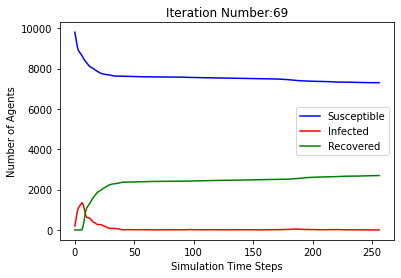

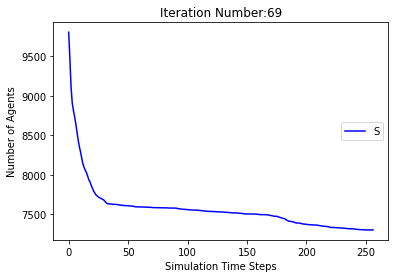

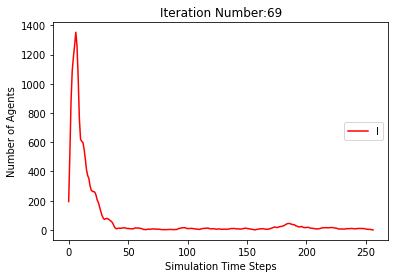

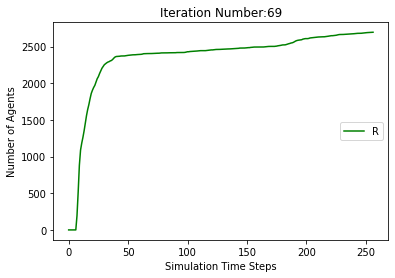

[9806, 9478, 9082, 8855, 8766, 8704, 8639, 8567, 8495, 8435, 8380, 8316, 8245, 8185, 8143, 8088, 8033, 7983, 7934, 7888, 7855, 7818, 7781, 7752, 7731, 7712, 7698, 7671, 7649, 7631, 7608, 7586, 7568, 7559, 7550, 7541, 7534, 7523, 7511, 7502, 7495, 7493, 7490, 7488, 7484, 7477, 7472, 7467, 7464, 7462, 7459, 7456, 7455, 7453, 7449, 7449, 7449, 7449, 7448, 7445, 7441, 7433, 7429, 7426, 7423, 7423, 7423, 7423, 7422, 7418, 7417, 7417, 7417, 7417, 7413, 7403, 7396, 7389, 7385, 7383, 7378, 7376, 7374, 7373, 7372, 7369, 7366, 7364, 7364, 7364, 7363, 7360, 7357, 7356, 7356, 7356, 7356, 7356, 7356, 7356, 7356]
[194, 522, 918, 1145, 1234, 1296, 1361, 1239, 983, 647, 475, 450, 459, 454, 424, 407, 402, 397, 382, 357, 330, 325, 307, 281, 252, 222, 190, 184, 169, 150, 144, 145, 144, 139, 121, 108, 97, 85, 75, 66, 64, 57, 51, 46, 39, 34, 30, 28, 29, 28, 29, 28, 22, 19, 18, 15, 13, 10, 8, 10, 12, 16, 20, 23, 26, 25, 22, 18, 11, 11, 9, 6, 6, 6, 10, 19, 22, 28, 32, 34, 39, 37, 29, 23, 17, 16, 17, 14, 12, 

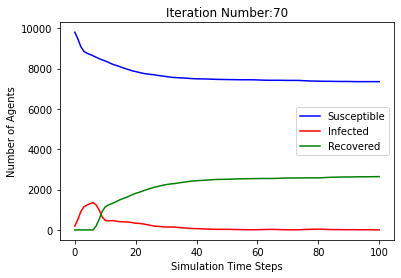

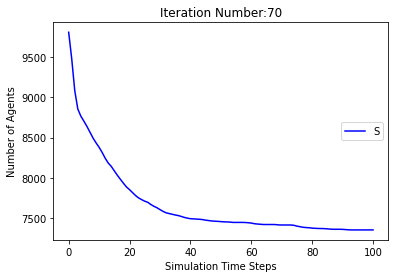

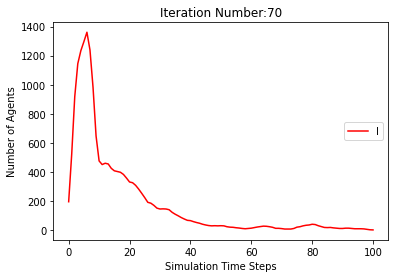

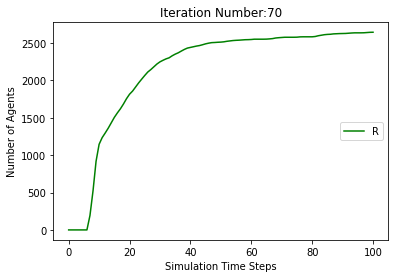

[9806, 9520, 9153, 8920, 8799, 8714, 8643, 8589, 8529, 8445, 8364, 8299, 8244, 8214, 8175, 8138, 8110, 8070, 8030, 7999, 7982, 7960, 7935, 7899, 7860, 7838, 7816, 7795, 7784, 7778, 7774, 7767, 7757, 7753, 7751, 7751, 7750, 7750, 7750, 7750, 7750, 7750, 7749, 7748, 7748, 7747, 7746, 7746, 7746, 7746, 7745, 7744, 7742, 7737, 7737, 7737, 7737, 7737, 7737, 7737, 7737]
[194, 480, 847, 1080, 1201, 1286, 1357, 1217, 991, 708, 556, 500, 470, 429, 414, 391, 335, 294, 269, 245, 232, 215, 203, 211, 210, 192, 183, 187, 176, 157, 125, 93, 81, 63, 44, 33, 28, 24, 17, 7, 3, 1, 2, 2, 2, 3, 4, 4, 4, 3, 3, 4, 5, 9, 9, 9, 9, 8, 7, 5, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 480, 847, 1080, 1201, 1286, 1357, 1411, 1471, 1555, 1636, 1701, 1756, 1786, 1825, 1862, 1890, 1930, 1970, 2001, 2018, 2040, 2065, 2101, 2140, 2162, 2184, 2205, 2216, 2222, 2226, 2233, 2243, 2247, 2249, 2249, 2250, 2250, 2250, 2250, 2250, 2250, 2251, 2252, 2252, 2253, 2254, 2254, 2254, 2254, 2255, 2256, 2258, 2263]
[[], [9806, 9515, 9140, 8897, 8

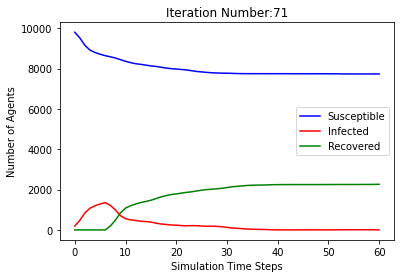

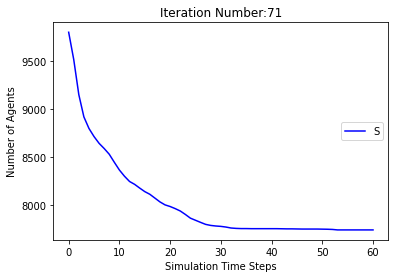

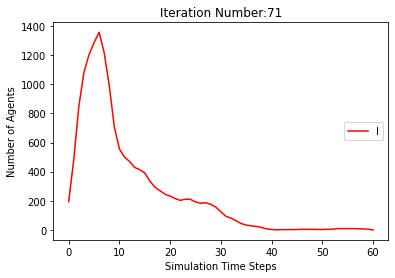

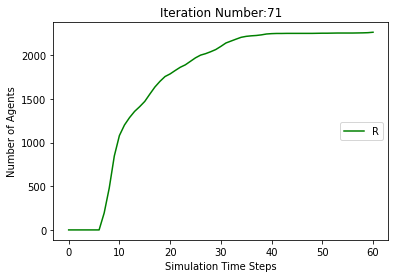

[9806, 9524, 9165, 8933, 8817, 8750, 8688, 8633, 8559, 8488, 8413, 8355, 8302, 8264, 8233, 8203, 8170, 8133, 8107, 8090, 8072, 8046, 8018, 8002, 7993, 7986, 7977, 7972, 7964, 7958, 7952, 7943, 7932, 7921, 7918, 7915, 7913, 7912, 7908, 7901, 7899, 7899, 7898, 7896, 7892, 7890, 7889, 7889, 7888, 7886, 7886, 7885, 7883, 7881, 7880, 7877, 7874, 7871, 7867, 7863, 7863, 7859, 7855, 7849, 7845, 7843, 7841, 7839, 7838, 7838, 7838, 7837, 7836, 7833, 7831, 7831, 7831, 7831, 7831, 7831, 7830, 7829, 7829, 7829, 7828, 7828, 7828, 7828, 7828, 7828, 7828, 7827, 7827, 7826, 7823, 7823, 7823, 7823, 7823, 7823, 7823, 7822, 7820, 7818, 7818, 7818, 7818, 7818, 7818, 7818, 7818]
[194, 476, 835, 1067, 1183, 1250, 1312, 1173, 965, 677, 520, 462, 448, 424, 400, 356, 318, 280, 248, 212, 192, 187, 185, 168, 140, 121, 113, 100, 82, 60, 50, 50, 54, 56, 54, 49, 45, 40, 35, 31, 22, 19, 17, 17, 20, 18, 12, 10, 11, 12, 10, 7, 7, 8, 9, 11, 12, 15, 18, 20, 18, 21, 22, 25, 26, 24, 22, 24, 21, 17, 11, 8, 7, 8, 8, 7, 7, 7

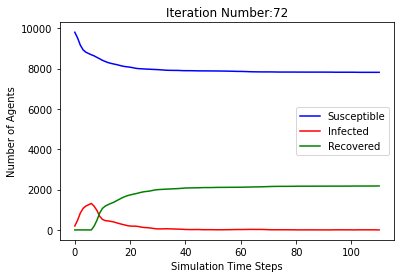

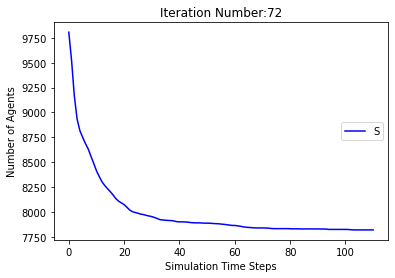

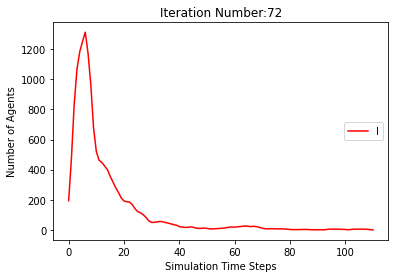

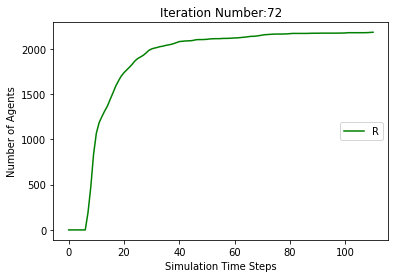

[9806, 9484, 9106, 8894, 8794, 8730, 8676, 8584, 8505, 8436, 8369, 8317, 8261, 8205, 8165, 8131, 8111, 8086, 8058, 8031, 8006, 7976, 7937, 7913, 7887, 7860, 7843, 7830, 7822, 7815, 7809, 7796, 7788, 7781, 7780, 7779, 7779, 7779, 7777, 7774, 7771, 7769, 7767, 7766, 7766, 7765, 7765, 7764, 7761, 7759, 7752, 7751, 7750, 7746, 7740, 7733, 7726, 7714, 7702, 7696, 7695, 7693, 7692, 7691, 7691, 7689, 7689, 7689, 7688, 7687, 7687, 7687, 7686, 7686, 7686, 7685, 7684, 7682, 7682, 7682, 7682, 7682, 7681, 7681, 7681, 7681, 7680, 7679, 7678, 7675, 7674, 7673, 7673, 7673, 7673, 7673, 7673, 7672, 7671, 7671, 7670, 7670, 7670, 7668, 7664, 7656, 7652, 7649, 7648, 7646, 7645, 7645, 7643, 7642, 7642, 7642, 7642, 7642, 7642, 7642, 7642]
[194, 516, 894, 1106, 1206, 1270, 1324, 1222, 979, 670, 525, 477, 469, 471, 419, 374, 325, 283, 259, 230, 199, 189, 194, 198, 199, 198, 188, 176, 154, 122, 104, 91, 72, 62, 50, 43, 36, 30, 19, 14, 10, 11, 12, 13, 13, 12, 9, 7, 8, 8, 14, 15, 15, 19, 24, 28, 33, 38, 49, 54, 

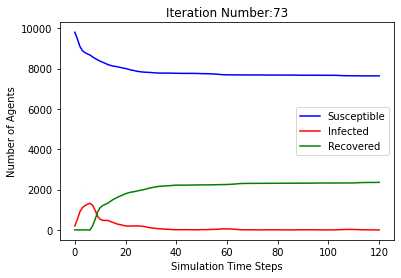

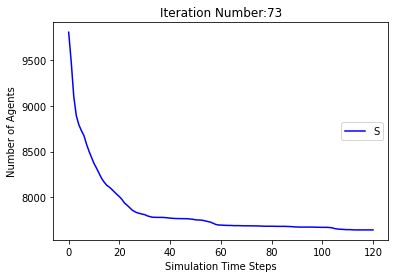

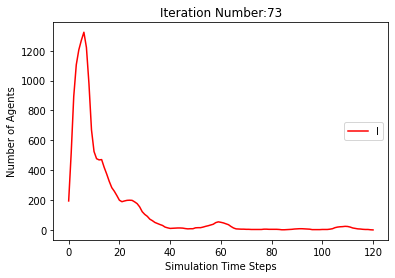

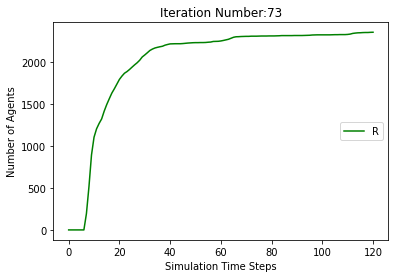

[9806, 9503, 9152, 8919, 8805, 8734, 8667, 8593, 8512, 8451, 8390, 8323, 8263, 8209, 8156, 8120, 8080, 8047, 8014, 7987, 7957, 7928, 7900, 7872, 7856, 7831, 7807, 7777, 7766, 7754, 7744, 7728, 7716, 7703, 7689, 7679, 7671, 7661, 7656, 7656, 7652, 7649, 7645, 7642, 7641, 7641, 7641, 7641, 7641, 7641, 7641, 7641]
[194, 497, 848, 1081, 1195, 1266, 1333, 1213, 991, 701, 529, 482, 471, 458, 437, 392, 371, 343, 309, 276, 252, 228, 220, 208, 191, 183, 180, 180, 162, 146, 128, 128, 115, 104, 88, 87, 83, 83, 72, 60, 51, 40, 34, 29, 20, 15, 15, 11, 8, 4, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 497, 848, 1081, 1195, 1266, 1333, 1407, 1488, 1549, 1610, 1677, 1737, 1791, 1844, 1880, 1920, 1953, 1986, 2013, 2043, 2072, 2100, 2128, 2144, 2169, 2193, 2223, 2234, 2246, 2256, 2272, 2284, 2297, 2311, 2321, 2329, 2339, 2344, 2344, 2348, 2351, 2355, 2358, 2359]
[[], [9806, 9515, 9140, 8897, 8803, 8738, 8666, 8595, 8522, 8450, 8380, 8301, 8229, 8203, 8183, 8150, 8117, 8085, 8054, 8026, 8002, 7977, 7958, 7942, 7933

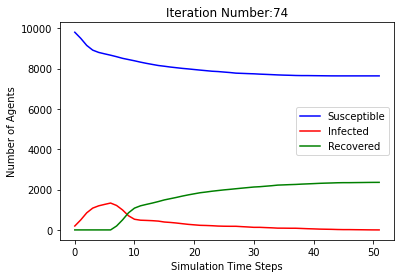

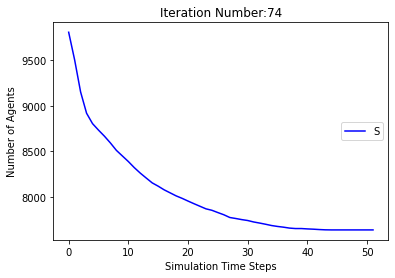

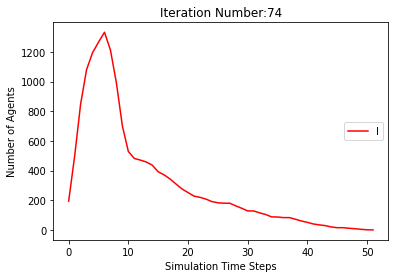

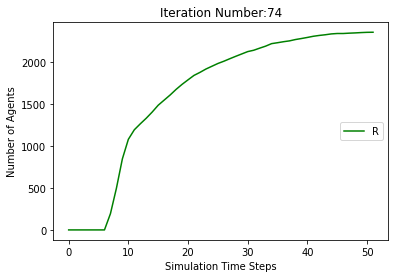

[9806, 9498, 9135, 8913, 8801, 8715, 8636, 8537, 8454, 8344, 8253, 8195, 8148, 8095, 8041, 7999, 7956, 7920, 7885, 7852, 7823, 7794, 7768, 7738, 7708, 7683, 7662, 7635, 7626, 7609, 7590, 7564, 7548, 7537, 7522, 7505, 7488, 7475, 7469, 7466, 7460, 7456, 7456, 7454, 7454, 7452, 7449, 7445, 7442, 7440, 7438, 7438, 7438, 7438, 7438, 7438, 7437, 7437, 7437, 7437, 7437, 7437, 7437, 7437]
[194, 502, 865, 1087, 1199, 1285, 1364, 1269, 1044, 791, 660, 606, 567, 541, 496, 455, 388, 333, 310, 296, 272, 247, 231, 218, 212, 202, 190, 188, 168, 159, 148, 144, 135, 125, 113, 121, 121, 115, 95, 82, 77, 66, 49, 34, 21, 17, 17, 15, 14, 16, 16, 16, 14, 11, 7, 4, 3, 1, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 502, 865, 1087, 1199, 1285, 1364, 1463, 1546, 1656, 1747, 1805, 1852, 1905, 1959, 2001, 2044, 2080, 2115, 2148, 2177, 2206, 2232, 2262, 2292, 2317, 2338, 2365, 2374, 2391, 2410, 2436, 2452, 2463, 2478, 2495, 2512, 2525, 2531, 2534, 2540, 2544, 2544, 2546, 2546, 2548, 2551, 2555, 2558, 2560, 2562,

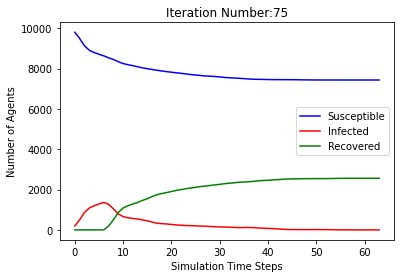

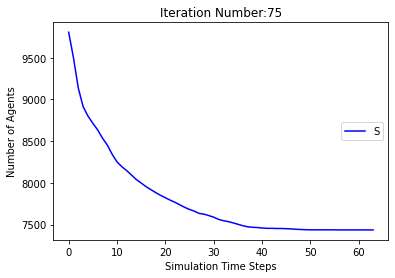

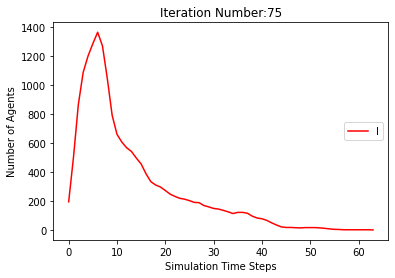

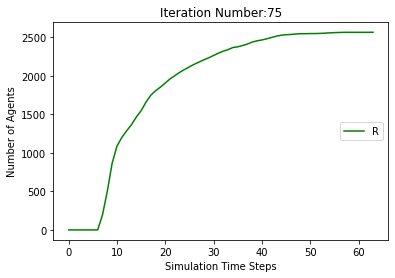

[9806, 9505, 9123, 8873, 8744, 8676, 8603, 8530, 8446, 8353, 8268, 8195, 8126, 8065, 8018, 7973, 7917, 7880, 7841, 7811, 7772, 7747, 7719, 7699, 7677, 7653, 7640, 7625, 7617, 7599, 7582, 7571, 7562, 7555, 7551, 7543, 7537, 7528, 7514, 7502, 7490, 7484, 7480, 7477, 7471, 7469, 7467, 7465, 7464, 7463, 7461, 7455, 7450, 7447, 7446, 7444, 7444, 7441, 7438, 7438, 7437, 7437, 7437, 7437, 7437, 7437, 7437, 7435, 7433, 7429, 7427, 7427, 7427, 7426, 7426, 7425, 7425, 7425, 7424, 7422, 7420, 7420, 7420, 7419, 7418, 7418, 7418, 7415, 7410, 7407, 7407, 7406, 7406, 7406, 7405, 7402, 7399, 7396, 7395, 7393, 7392, 7391, 7391, 7390, 7389, 7388, 7386, 7385, 7385, 7383, 7381, 7378, 7375, 7374, 7370, 7365, 7361, 7358, 7355, 7353, 7353, 7353, 7353, 7353, 7352, 7351, 7347, 7346, 7345, 7342, 7341, 7339, 7339, 7338, 7338, 7338, 7337, 7335, 7331, 7327, 7323, 7319, 7316, 7314, 7313, 7312, 7311, 7311, 7309, 7309, 7309, 7308, 7307, 7305, 7303, 7302, 7302, 7301, 7300, 7299, 7298, 7297, 7297, 7297, 7296, 7295, 729

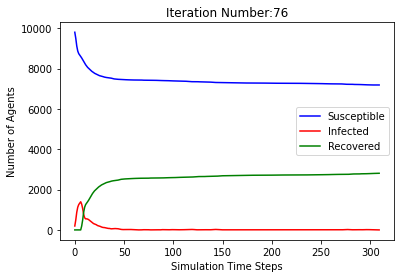

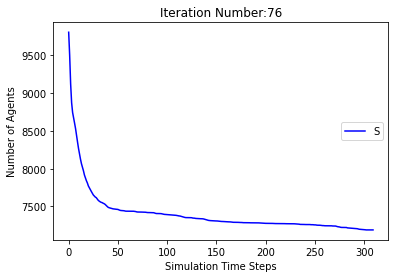

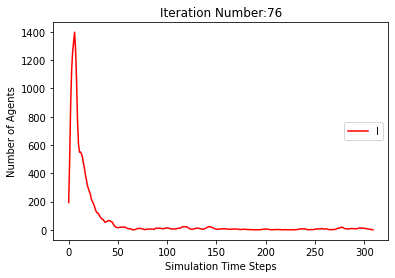

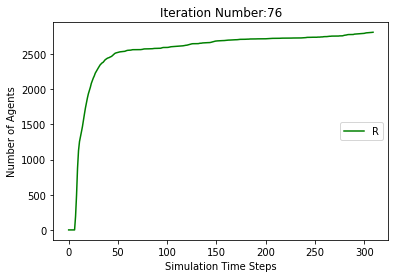

[9806, 9489, 9116, 8923, 8782, 8702, 8615, 8529, 8455, 8380, 8317, 8249, 8193, 8146, 8098, 8061, 8017, 7962, 7927, 7896, 7866, 7838, 7814, 7772, 7741, 7718, 7693, 7664, 7655, 7638, 7622, 7608, 7599, 7588, 7582, 7578, 7565, 7551, 7536, 7529, 7529, 7529, 7528, 7528, 7528, 7527, 7527, 7526, 7526, 7525, 7522, 7521, 7518, 7513, 7504, 7500, 7497, 7497, 7497, 7496, 7495, 7494, 7490, 7489, 7488, 7488, 7488, 7488, 7488, 7488, 7488, 7488]
[194, 511, 884, 1077, 1218, 1298, 1385, 1277, 1034, 736, 606, 533, 509, 469, 431, 394, 363, 355, 322, 297, 280, 260, 247, 245, 221, 209, 203, 202, 183, 176, 150, 133, 119, 105, 82, 77, 73, 71, 72, 70, 59, 53, 50, 37, 23, 9, 2, 3, 3, 3, 6, 7, 9, 14, 22, 26, 28, 25, 24, 22, 18, 10, 10, 8, 9, 9, 8, 7, 6, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 511, 884, 1077, 1218, 1298, 1385, 1471, 1545, 1620, 1683, 1751, 1807, 1854, 1902, 1939, 1983, 2038, 2073, 2104, 2134, 2162, 2186, 2228, 2259, 2282, 2307, 2336, 2345, 2362, 2378, 2392, 2401, 2412, 2418, 2422, 2435, 2449, 2464, 24

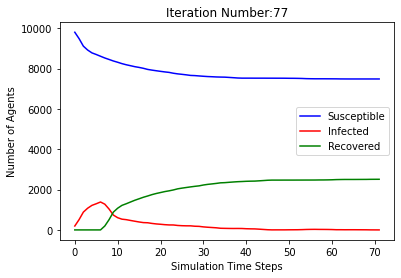

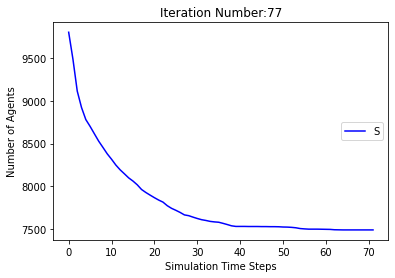

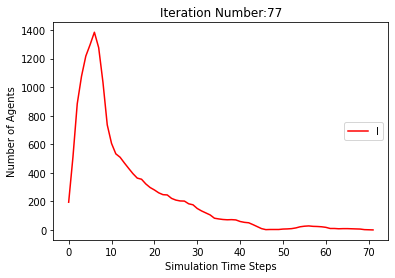

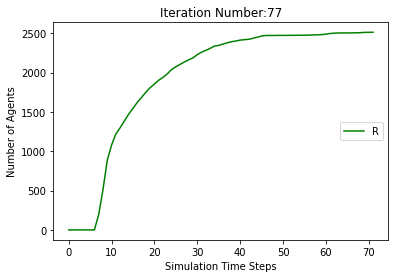

[9806, 9489, 9141, 8912, 8819, 8754, 8677, 8598, 8518, 8435, 8348, 8266, 8191, 8147, 8105, 8067, 8016, 7975, 7944, 7915, 7883, 7852, 7825, 7795, 7765, 7740, 7722, 7710, 7698, 7692, 7678, 7665, 7654, 7646, 7638, 7632, 7628, 7626, 7622, 7614, 7606, 7599, 7595, 7593, 7592, 7590, 7587, 7584, 7580, 7579, 7579, 7579, 7577, 7575, 7573, 7571, 7570, 7570, 7570, 7570, 7570, 7570, 7570, 7570]
[194, 511, 859, 1088, 1181, 1246, 1323, 1208, 971, 706, 564, 553, 563, 530, 493, 451, 419, 373, 322, 276, 264, 253, 242, 221, 210, 204, 193, 173, 154, 133, 117, 100, 86, 76, 72, 66, 64, 52, 43, 40, 40, 39, 37, 35, 34, 32, 27, 22, 19, 16, 14, 13, 13, 12, 11, 9, 9, 9, 9, 7, 5, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 511, 859, 1088, 1181, 1246, 1323, 1402, 1482, 1565, 1652, 1734, 1809, 1853, 1895, 1933, 1984, 2025, 2056, 2085, 2117, 2148, 2175, 2205, 2235, 2260, 2278, 2290, 2302, 2308, 2322, 2335, 2346, 2354, 2362, 2368, 2372, 2374, 2378, 2386, 2394, 2401, 2405, 2407, 2408, 2410, 2413, 2416, 2420, 2421, 2421, 2421,

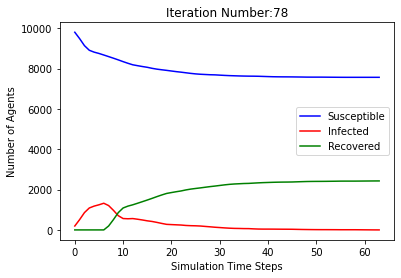

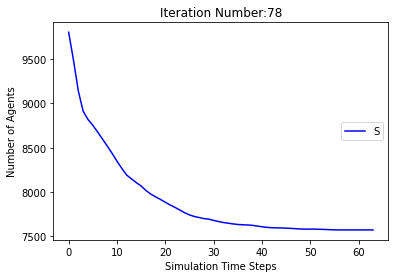

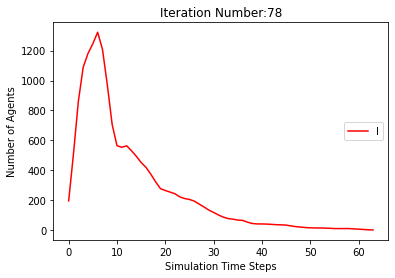

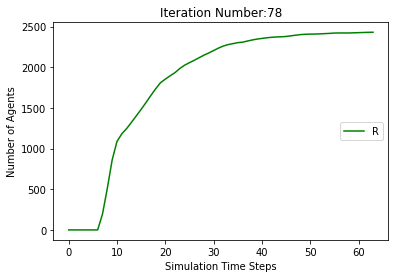

[9806, 9535, 9172, 8927, 8823, 8759, 8676, 8599, 8519, 8449, 8378, 8317, 8248, 8183, 8115, 8043, 8006, 7966, 7937, 7916, 7894, 7872, 7852, 7841, 7822, 7798, 7775, 7761, 7746, 7727, 7711, 7703, 7692, 7674, 7666, 7657, 7655, 7652, 7650, 7645, 7637, 7632, 7627, 7621, 7620, 7618, 7617, 7617, 7617, 7616, 7615, 7611, 7610, 7610, 7608, 7608, 7608, 7608, 7608, 7608, 7608, 7608]
[194, 465, 828, 1073, 1177, 1241, 1324, 1207, 1016, 723, 549, 506, 511, 493, 484, 476, 443, 412, 380, 332, 289, 243, 191, 165, 144, 139, 141, 133, 126, 125, 130, 119, 106, 101, 95, 89, 72, 59, 53, 47, 37, 34, 30, 34, 32, 32, 28, 20, 15, 11, 6, 9, 8, 7, 9, 9, 8, 7, 3, 2, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 465, 828, 1073, 1177, 1241, 1324, 1401, 1481, 1551, 1622, 1683, 1752, 1817, 1885, 1957, 1994, 2034, 2063, 2084, 2106, 2128, 2148, 2159, 2178, 2202, 2225, 2239, 2254, 2273, 2289, 2297, 2308, 2326, 2334, 2343, 2345, 2348, 2350, 2355, 2363, 2368, 2373, 2379, 2380, 2382, 2383, 2383, 2383, 2384, 2385, 2389, 2390, 2390, 2392]
[

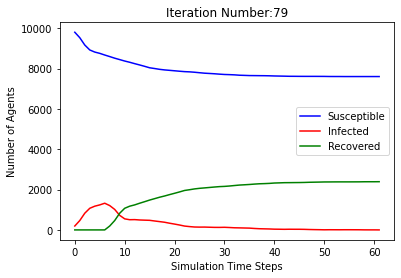

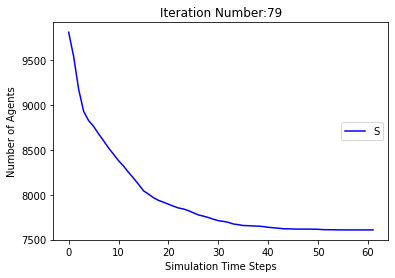

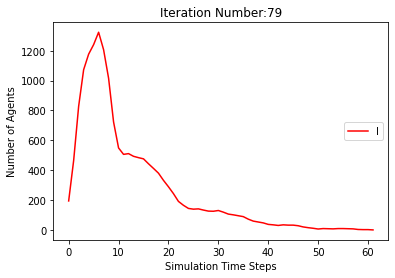

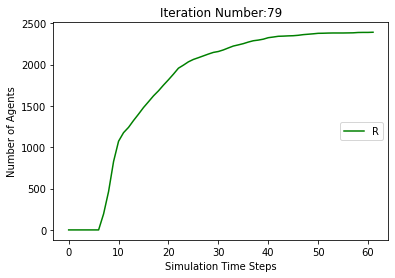

[9806, 9521, 9162, 8916, 8825, 8739, 8657, 8570, 8499, 8431, 8353, 8286, 8215, 8152, 8115, 8079, 8046, 8011, 7985, 7956, 7934, 7910, 7893, 7881, 7861, 7837, 7819, 7805, 7799, 7790, 7783, 7776, 7767, 7761, 7756, 7755, 7751, 7741, 7734, 7725, 7712, 7696, 7684, 7680, 7676, 7674, 7670, 7664, 7660, 7655, 7648, 7645, 7645, 7645, 7645, 7645, 7645, 7642, 7640, 7638, 7635, 7630, 7629, 7627, 7626, 7626, 7625, 7624, 7624, 7624, 7624, 7624, 7624, 7624, 7624]
[194, 479, 838, 1084, 1175, 1261, 1343, 1236, 1022, 731, 563, 539, 524, 505, 455, 420, 385, 342, 301, 259, 218, 205, 186, 165, 150, 148, 137, 129, 111, 103, 98, 85, 70, 58, 49, 44, 39, 42, 42, 42, 49, 60, 71, 71, 65, 60, 55, 48, 36, 29, 32, 31, 29, 25, 19, 15, 10, 6, 5, 7, 10, 15, 16, 18, 16, 14, 13, 11, 6, 5, 3, 2, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 479, 838, 1084, 1175, 1261, 1343, 1430, 1501, 1569, 1647, 1714, 1785, 1848, 1885, 1921, 1954, 1989, 2015, 2044, 2066, 2090, 2107, 2119, 2139, 2163, 2181, 2195, 2201, 2210, 2217, 2224, 2233, 2239,

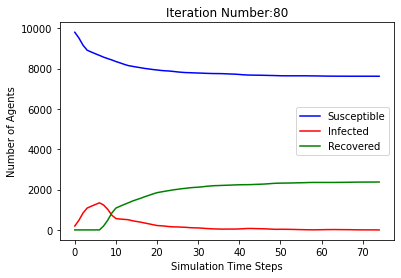

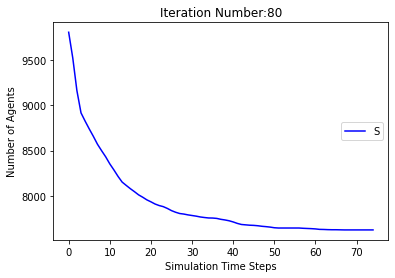

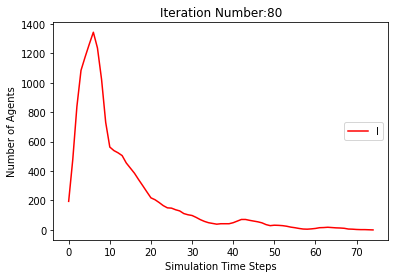

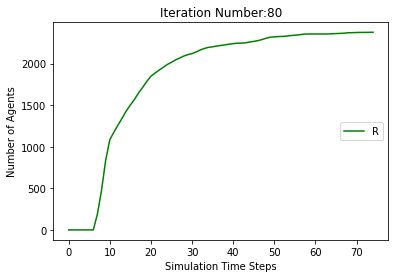

[9806, 9502, 9112, 8898, 8795, 8729, 8669, 8602, 8512, 8445, 8401, 8342, 8286, 8255, 8226, 8188, 8154, 8114, 8074, 8046, 8016, 7986, 7970, 7949, 7926, 7903, 7889, 7877, 7870, 7857, 7850, 7846, 7836, 7826, 7823, 7816, 7810, 7804, 7799, 7795, 7794, 7790, 7786, 7782, 7779, 7775, 7769, 7765, 7762, 7756, 7750, 7745, 7741, 7734, 7732, 7732, 7731, 7730, 7725, 7723, 7723, 7723, 7723, 7723, 7722, 7722, 7719, 7715, 7713, 7710, 7710, 7709, 7709, 7707, 7706, 7705, 7704, 7704, 7704, 7704, 7703, 7702, 7701, 7701, 7701, 7700, 7700, 7699, 7698, 7697, 7697, 7697, 7697, 7697, 7696, 7695, 7694, 7692, 7692, 7692, 7692, 7690, 7689, 7689, 7689, 7688, 7685, 7681, 7678, 7677, 7676, 7676, 7676, 7676, 7676, 7676, 7676, 7676]
[194, 498, 888, 1102, 1205, 1271, 1331, 1204, 990, 667, 497, 453, 443, 414, 376, 324, 291, 287, 268, 240, 239, 240, 218, 205, 188, 171, 157, 139, 116, 113, 99, 80, 67, 63, 54, 54, 47, 46, 47, 41, 32, 33, 30, 28, 25, 24, 26, 29, 28, 30, 32, 34, 34, 35, 33, 30, 25, 20, 20, 18, 11, 9, 9, 8, 8,

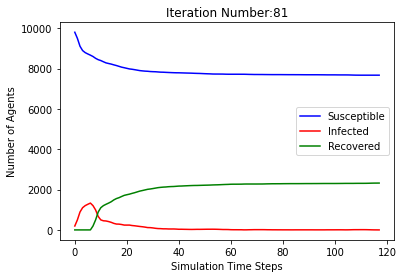

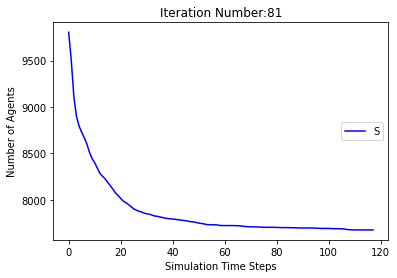

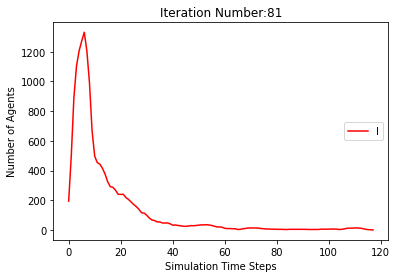

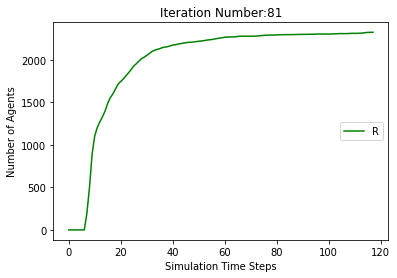

[9806, 9505, 9118, 8877, 8755, 8677, 8593, 8504, 8413, 8324, 8251, 8169, 8097, 8029, 7971, 7927, 7897, 7870, 7840, 7808, 7780, 7759, 7733, 7713, 7701, 7690, 7682, 7668, 7647, 7631, 7606, 7595, 7590, 7587, 7583, 7577, 7575, 7572, 7569, 7563, 7553, 7547, 7545, 7539, 7533, 7525, 7518, 7512, 7509, 7507, 7502, 7498, 7498, 7497, 7497, 7497, 7495, 7490, 7487, 7485, 7484, 7484, 7484, 7484, 7483, 7483, 7482, 7482, 7482, 7482, 7482, 7482, 7482, 7482]
[194, 495, 882, 1123, 1245, 1323, 1407, 1302, 1092, 794, 626, 586, 580, 564, 533, 486, 427, 381, 329, 289, 249, 212, 194, 184, 169, 150, 126, 112, 112, 102, 107, 106, 100, 95, 85, 70, 56, 34, 26, 27, 34, 36, 32, 36, 39, 44, 45, 41, 38, 38, 37, 35, 27, 21, 15, 12, 12, 12, 11, 13, 13, 13, 13, 11, 7, 4, 3, 2, 2, 2, 2, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 495, 882, 1123, 1245, 1323, 1407, 1496, 1587, 1676, 1749, 1831, 1903, 1971, 2029, 2073, 2103, 2130, 2160, 2192, 2220, 2241, 2267, 2287, 2299, 2310, 2318, 2332, 2353, 2369, 2394, 2405, 2410, 2413, 2417, 

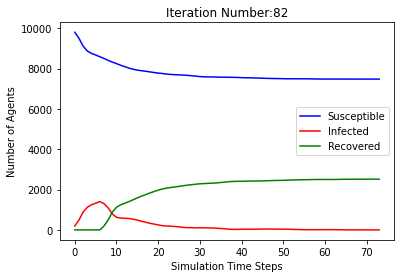

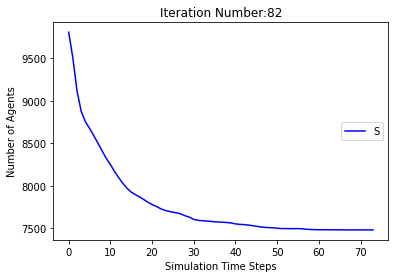

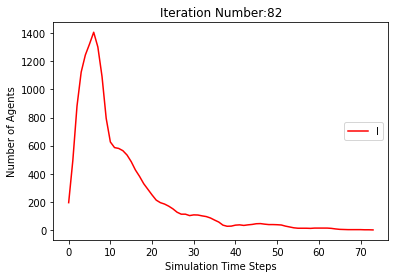

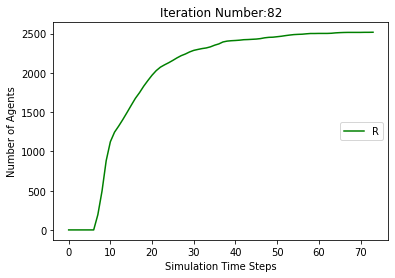

[9806, 9504, 9140, 8906, 8809, 8749, 8668, 8575, 8490, 8421, 8352, 8297, 8244, 8165, 8091, 8019, 7975, 7933, 7897, 7865, 7833, 7803, 7772, 7737, 7715, 7698, 7685, 7665, 7652, 7643, 7632, 7618, 7605, 7594, 7588, 7580, 7572, 7566, 7559, 7549, 7535, 7533, 7528, 7525, 7522, 7515, 7509, 7506, 7503, 7503, 7503, 7501, 7500, 7499, 7498, 7496, 7494, 7491, 7491, 7490, 7487, 7484, 7484, 7484, 7484, 7484, 7484, 7484, 7484]
[194, 496, 860, 1094, 1191, 1251, 1332, 1231, 1014, 719, 554, 512, 505, 503, 484, 471, 446, 419, 400, 379, 332, 288, 247, 238, 218, 199, 180, 168, 151, 129, 105, 97, 93, 91, 77, 72, 71, 66, 59, 56, 59, 55, 52, 47, 44, 44, 40, 29, 30, 25, 22, 21, 15, 10, 8, 7, 9, 12, 10, 10, 12, 14, 12, 10, 7, 7, 6, 3, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 496, 860, 1094, 1191, 1251, 1332, 1425, 1510, 1579, 1648, 1703, 1756, 1835, 1909, 1981, 2025, 2067, 2103, 2135, 2167, 2197, 2228, 2263, 2285, 2302, 2315, 2335, 2348, 2357, 2368, 2382, 2395, 2406, 2412, 2420, 2428, 2434, 2441, 2451, 2465, 2467, 2472, 24

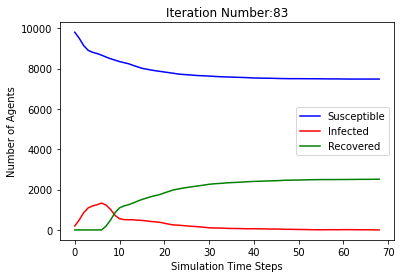

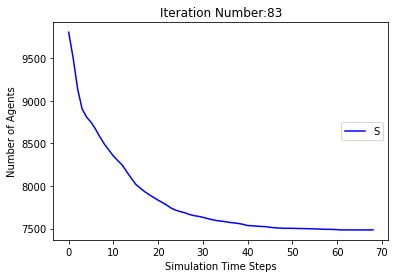

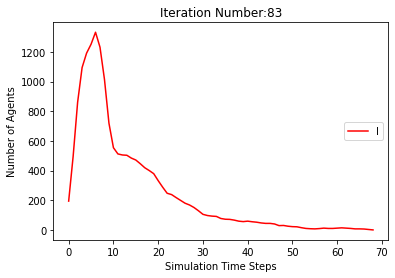

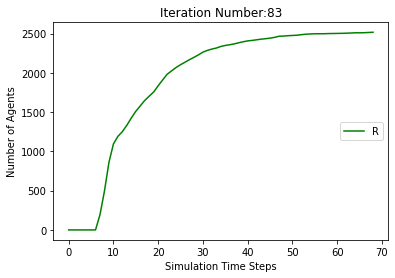

[9806, 9503, 9119, 8903, 8805, 8723, 8646, 8569, 8503, 8432, 8361, 8299, 8250, 8204, 8157, 8123, 8091, 8066, 8032, 8009, 7983, 7966, 7951, 7933, 7919, 7906, 7894, 7879, 7866, 7863, 7856, 7844, 7826, 7816, 7807, 7798, 7791, 7782, 7772, 7764, 7762, 7761, 7760, 7760, 7758, 7758, 7758, 7756, 7756, 7756, 7756, 7756, 7756, 7756, 7756]
[194, 497, 881, 1097, 1195, 1277, 1354, 1237, 1000, 687, 542, 506, 473, 442, 412, 380, 341, 295, 267, 241, 221, 191, 172, 158, 147, 126, 115, 104, 100, 88, 77, 75, 80, 78, 72, 68, 72, 74, 72, 62, 54, 46, 38, 31, 24, 14, 6, 6, 5, 4, 4, 2, 2, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 497, 881, 1097, 1195, 1277, 1354, 1431, 1497, 1568, 1639, 1701, 1750, 1796, 1843, 1877, 1909, 1934, 1968, 1991, 2017, 2034, 2049, 2067, 2081, 2094, 2106, 2121, 2134, 2137, 2144, 2156, 2174, 2184, 2193, 2202, 2209, 2218, 2228, 2236, 2238, 2239, 2240, 2240, 2242, 2242, 2242, 2244]
[[], [9806, 9515, 9140, 8897, 8803, 8738, 8666, 8595, 8522, 8450, 8380, 8301, 8229, 8203, 8183, 8150, 8117, 8085, 8

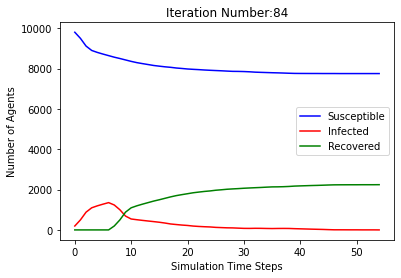

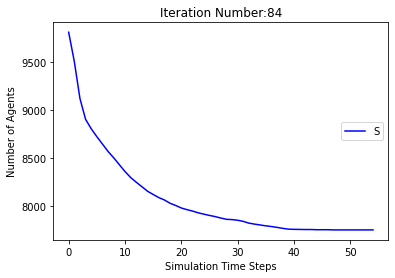

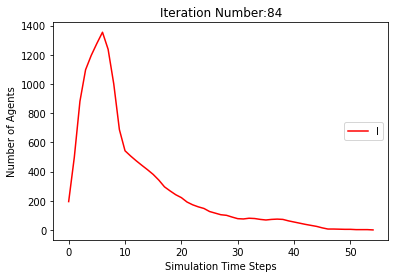

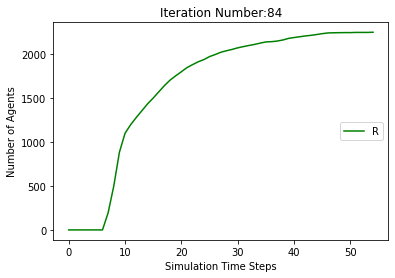

[9806, 9504, 9144, 8892, 8802, 8745, 8673, 8597, 8536, 8462, 8389, 8338, 8296, 8249, 8201, 8161, 8106, 8068, 8026, 7995, 7981, 7958, 7939, 7920, 7906, 7886, 7873, 7861, 7855, 7842, 7830, 7820, 7814, 7811, 7810, 7807, 7802, 7796, 7793, 7792, 7789, 7788, 7785, 7780, 7777, 7777, 7777, 7777, 7776, 7773, 7770, 7769, 7769, 7768, 7767, 7762, 7760, 7760, 7758, 7756, 7752, 7749, 7748, 7748, 7748, 7747, 7747, 7747, 7747, 7746, 7746, 7746, 7746, 7746, 7746, 7746, 7744, 7744, 7743, 7743, 7742, 7742, 7742, 7741, 7741, 7741, 7741, 7741, 7738, 7737, 7733, 7730, 7730, 7724, 7722, 7719, 7714, 7712, 7709, 7707, 7703, 7702, 7701, 7701, 7701, 7700, 7699, 7699, 7694, 7693, 7692, 7692, 7688, 7683, 7682, 7678, 7673, 7667, 7664, 7664, 7662, 7662, 7655, 7651, 7648, 7645, 7643, 7639, 7635, 7630, 7629, 7621, 7616, 7612, 7605, 7601, 7600, 7599, 7597, 7594, 7590, 7589, 7587, 7586, 7583, 7577, 7576, 7575, 7571, 7568, 7565, 7564, 7562, 7561, 7558, 7555, 7552, 7551, 7550, 7549, 7545, 7541, 7537, 7536, 7534, 7531, 753

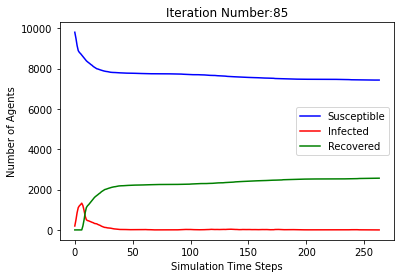

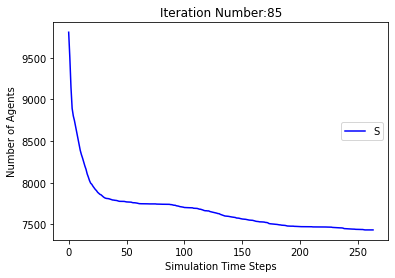

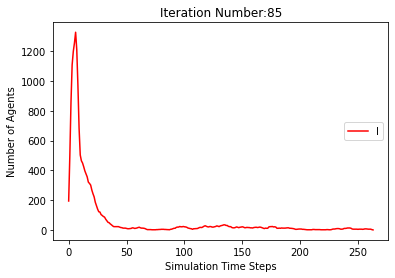

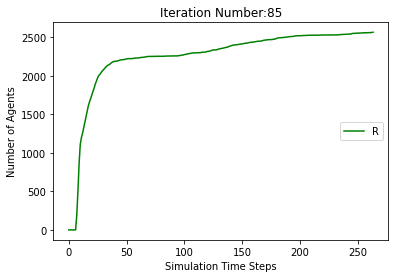

[9806, 9502, 9101, 8885, 8779, 8716, 8651, 8596, 8516, 8449, 8391, 8345, 8293, 8239, 8185, 8132, 8110, 8083, 8041, 8000, 7955, 7910, 7876, 7863, 7846, 7841, 7830, 7824, 7815, 7801, 7792, 7785, 7782, 7779, 7775, 7773, 7767, 7764, 7756, 7754, 7751, 7748, 7746, 7744, 7742, 7741, 7737, 7733, 7732, 7727, 7721, 7718, 7716, 7715, 7715, 7715, 7715, 7713, 7712, 7711, 7711, 7711, 7711, 7711, 7711, 7711, 7711]
[194, 498, 899, 1115, 1221, 1284, 1349, 1210, 986, 652, 494, 434, 423, 412, 411, 384, 339, 308, 304, 293, 284, 275, 256, 247, 237, 200, 170, 131, 95, 75, 71, 61, 59, 51, 49, 42, 34, 28, 29, 28, 28, 27, 27, 23, 22, 15, 17, 18, 16, 19, 23, 24, 25, 22, 18, 17, 12, 8, 6, 5, 4, 4, 4, 4, 2, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 498, 899, 1115, 1221, 1284, 1349, 1404, 1484, 1551, 1609, 1655, 1707, 1761, 1815, 1868, 1890, 1917, 1959, 2000, 2045, 2090, 2124, 2137, 2154, 2159, 2170, 2176, 2185, 2199, 2208, 2215, 2218, 2221, 2225, 2227, 2233, 2236, 2244, 2246, 2249, 2252, 2254, 2256, 2258, 2259, 2263, 2267

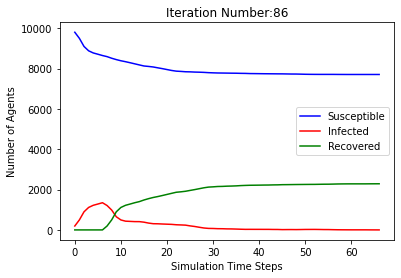

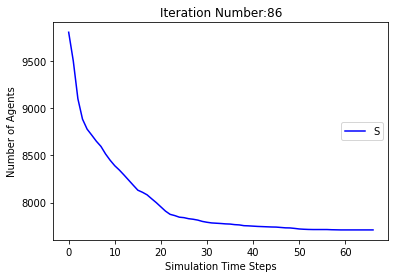

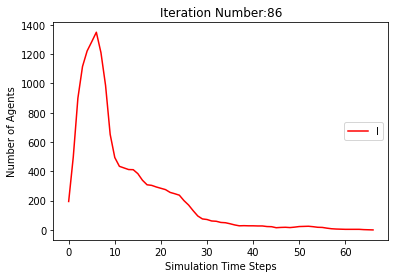

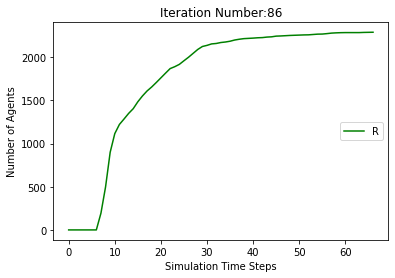

[9806, 9508, 9149, 8910, 8792, 8717, 8640, 8559, 8454, 8364, 8301, 8249, 8200, 8157, 8115, 8073, 8031, 7999, 7971, 7947, 7927, 7904, 7874, 7834, 7805, 7793, 7778, 7764, 7752, 7741, 7724, 7706, 7698, 7693, 7691, 7684, 7675, 7666, 7662, 7655, 7645, 7642, 7639, 7639, 7639, 7639, 7639, 7638, 7635, 7632, 7627, 7621, 7620, 7618, 7616, 7613, 7611, 7610, 7609, 7608, 7606, 7606, 7606, 7606, 7606, 7605, 7605, 7605, 7605, 7605, 7605, 7605, 7605]
[194, 492, 851, 1090, 1208, 1283, 1360, 1247, 1054, 785, 609, 543, 517, 483, 444, 381, 333, 302, 278, 253, 230, 211, 199, 197, 194, 178, 169, 163, 152, 133, 110, 99, 95, 85, 73, 68, 66, 58, 44, 43, 48, 49, 45, 36, 27, 23, 16, 7, 7, 7, 12, 18, 19, 21, 22, 22, 21, 17, 12, 12, 12, 10, 7, 5, 4, 4, 3, 1, 1, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 492, 851, 1090, 1208, 1283, 1360, 1441, 1546, 1636, 1699, 1751, 1800, 1843, 1885, 1927, 1969, 2001, 2029, 2053, 2073, 2096, 2126, 2166, 2195, 2207, 2222, 2236, 2248, 2259, 2276, 2294, 2302, 2307, 2309, 2316, 2325, 2334

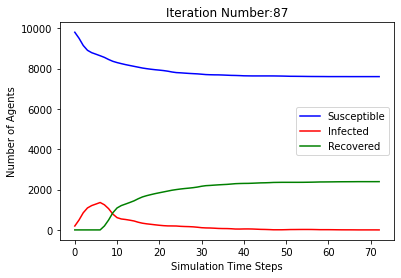

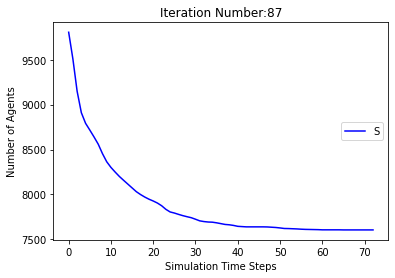

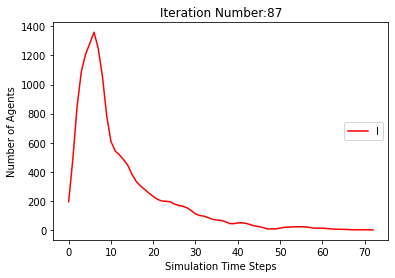

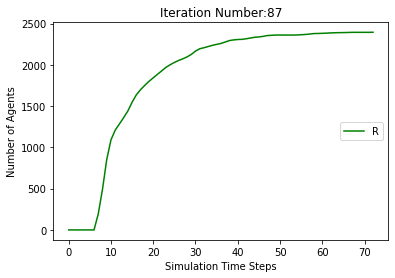

[9806, 9495, 9142, 8899, 8797, 8724, 8661, 8573, 8489, 8421, 8345, 8282, 8218, 8179, 8138, 8099, 8067, 8022, 7981, 7958, 7937, 7908, 7872, 7838, 7826, 7818, 7810, 7807, 7804, 7798, 7791, 7788, 7785, 7777, 7764, 7758, 7753, 7751, 7750, 7748, 7746, 7744, 7743, 7743, 7741, 7738, 7733, 7730, 7729, 7729, 7727, 7726, 7726, 7726, 7726, 7726, 7726, 7726, 7726]
[194, 505, 858, 1101, 1203, 1276, 1339, 1233, 1006, 721, 554, 515, 506, 482, 435, 390, 354, 323, 301, 260, 242, 230, 227, 229, 196, 163, 148, 130, 104, 74, 47, 38, 33, 33, 43, 46, 45, 40, 38, 37, 31, 20, 15, 10, 10, 12, 15, 16, 15, 14, 16, 15, 12, 7, 4, 3, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 505, 858, 1101, 1203, 1276, 1339, 1427, 1511, 1579, 1655, 1718, 1782, 1821, 1862, 1901, 1933, 1978, 2019, 2042, 2063, 2092, 2128, 2162, 2174, 2182, 2190, 2193, 2196, 2202, 2209, 2212, 2215, 2223, 2236, 2242, 2247, 2249, 2250, 2252, 2254, 2256, 2257, 2257, 2259, 2262, 2267, 2270, 2271, 2271, 2273, 2274]
[[], [9806, 9515, 9140, 8897, 8803, 8738, 8666, 

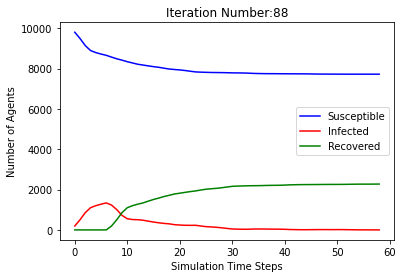

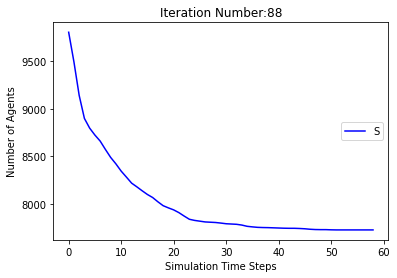

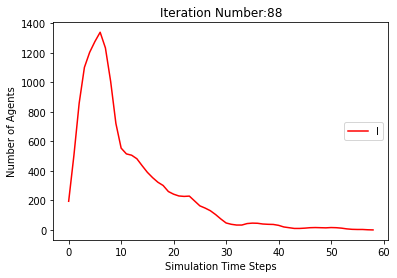

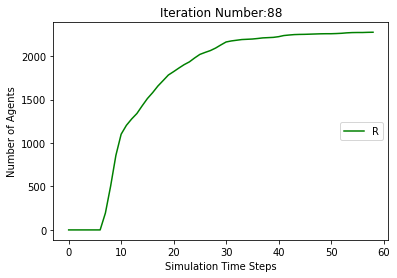

[9806, 9504, 9108, 8896, 8798, 8725, 8642, 8560, 8478, 8392, 8300, 8206, 8151, 8114, 8076, 8032, 7991, 7960, 7931, 7901, 7875, 7861, 7838, 7816, 7793, 7770, 7762, 7750, 7737, 7721, 7713, 7709, 7707, 7703, 7701, 7697, 7696, 7695, 7692, 7686, 7685, 7681, 7679, 7676, 7675, 7673, 7671, 7671, 7670, 7669, 7665, 7661, 7659, 7659, 7658, 7656, 7654, 7647, 7639, 7636, 7633, 7629, 7625, 7619, 7611, 7605, 7601, 7599, 7598, 7596, 7595, 7590, 7589, 7587, 7585, 7584, 7584, 7584, 7584, 7584, 7582, 7581, 7580, 7577, 7576, 7576, 7576, 7575, 7574, 7573, 7571, 7568, 7563, 7562, 7562, 7561, 7557, 7555, 7554, 7554, 7554, 7553, 7553, 7553, 7551, 7550, 7548, 7547, 7543, 7543, 7543, 7543, 7543, 7543, 7543, 7543]
[194, 496, 892, 1104, 1202, 1275, 1358, 1246, 1026, 716, 596, 592, 574, 528, 484, 446, 401, 340, 275, 250, 239, 215, 194, 175, 167, 161, 139, 125, 124, 117, 103, 84, 63, 59, 49, 40, 25, 18, 17, 21, 18, 20, 18, 20, 20, 19, 15, 14, 11, 10, 11, 14, 14, 12, 13, 14, 15, 18, 22, 23, 26, 29, 31, 35, 36, 34, 3

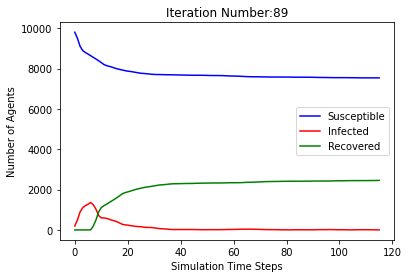

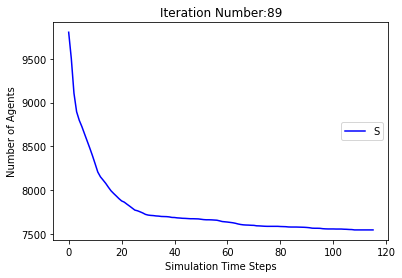

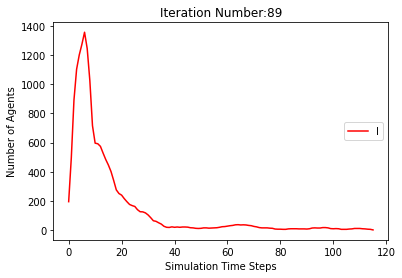

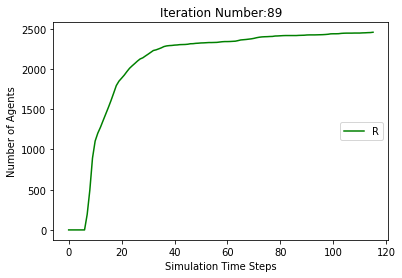

[9806, 9513, 9123, 8908, 8808, 8740, 8664, 8598, 8505, 8423, 8344, 8275, 8198, 8125, 8071, 8031, 7991, 7958, 7928, 7910, 7895, 7880, 7864, 7849, 7838, 7819, 7799, 7786, 7777, 7772, 7767, 7762, 7759, 7755, 7744, 7738, 7734, 7731, 7723, 7721, 7721, 7721, 7721, 7721, 7721, 7720, 7718, 7716, 7716, 7716, 7716, 7716, 7716, 7716, 7716]
[194, 487, 877, 1092, 1192, 1260, 1336, 1208, 1008, 700, 564, 533, 542, 539, 527, 474, 432, 386, 347, 288, 230, 191, 167, 142, 120, 109, 111, 109, 103, 92, 82, 76, 60, 44, 42, 39, 38, 36, 39, 38, 34, 23, 17, 13, 10, 3, 3, 5, 5, 5, 5, 5, 4, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 487, 877, 1092, 1192, 1260, 1336, 1402, 1495, 1577, 1656, 1725, 1802, 1875, 1929, 1969, 2009, 2042, 2072, 2090, 2105, 2120, 2136, 2151, 2162, 2181, 2201, 2214, 2223, 2228, 2233, 2238, 2241, 2245, 2256, 2262, 2266, 2269, 2277, 2279, 2279, 2279, 2279, 2279, 2279, 2280, 2282, 2284]
[[], [9806, 9515, 9140, 8897, 8803, 8738, 8666, 8595, 8522, 8450, 8380, 8301, 8229, 8203, 8183, 8150, 8117, 8085, 80

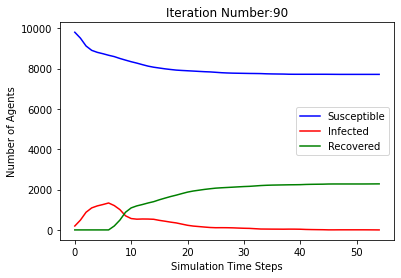

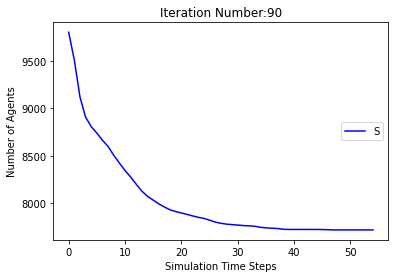

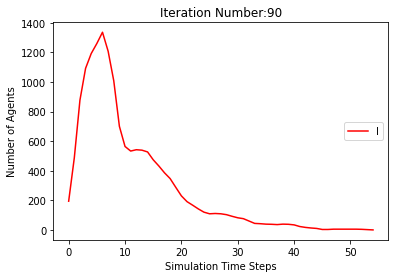

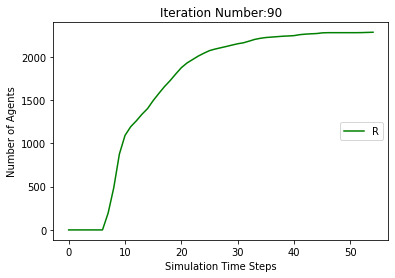

[9806, 9495, 9124, 8911, 8804, 8737, 8663, 8587, 8512, 8424, 8360, 8306, 8270, 8234, 8207, 8170, 8134, 8102, 8064, 8031, 8011, 7990, 7972, 7958, 7943, 7924, 7909, 7901, 7890, 7887, 7880, 7871, 7865, 7861, 7858, 7854, 7851, 7843, 7838, 7837, 7837, 7837, 7837, 7837, 7837, 7837, 7837]
[194, 505, 876, 1089, 1196, 1263, 1337, 1219, 983, 700, 551, 498, 467, 429, 380, 342, 290, 258, 242, 239, 223, 217, 198, 176, 159, 140, 122, 110, 100, 85, 78, 72, 59, 48, 43, 36, 36, 37, 33, 28, 24, 21, 17, 14, 6, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 505, 876, 1089, 1196, 1263, 1337, 1413, 1488, 1576, 1640, 1694, 1730, 1766, 1793, 1830, 1866, 1898, 1936, 1969, 1989, 2010, 2028, 2042, 2057, 2076, 2091, 2099, 2110, 2113, 2120, 2129, 2135, 2139, 2142, 2146, 2149, 2157, 2162, 2163]
[[], [9806, 9515, 9140, 8897, 8803, 8738, 8666, 8595, 8522, 8450, 8380, 8301, 8229, 8203, 8183, 8150, 8117, 8085, 8054, 8026, 8002, 7977, 7958, 7942, 7933, 7923, 7915, 7904, 7895, 7886, 7871, 7856, 7853, 7847, 7841, 7830, 7820, 7810, 7807

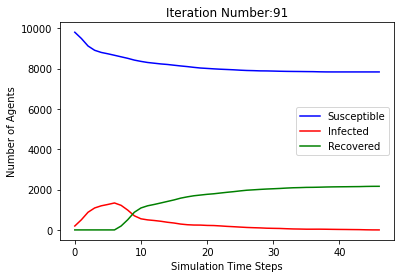

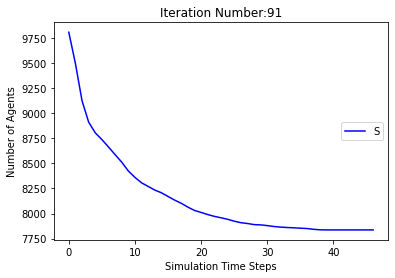

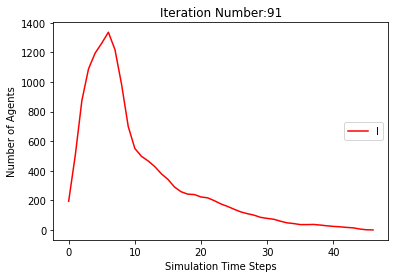

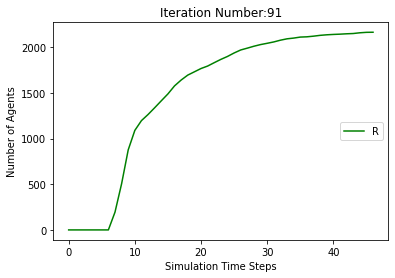

[9806, 9507, 9141, 8895, 8810, 8736, 8663, 8587, 8510, 8455, 8400, 8359, 8312, 8256, 8215, 8187, 8164, 8143, 8113, 8079, 8055, 8031, 8015, 8004, 7992, 7977, 7967, 7953, 7945, 7933, 7921, 7910, 7899, 7887, 7879, 7870, 7863, 7856, 7854, 7853, 7851, 7848, 7840, 7834, 7828, 7825, 7824, 7820, 7816, 7812, 7810, 7808, 7806, 7804, 7804, 7804, 7804, 7804, 7804, 7804, 7804]
[194, 493, 859, 1105, 1190, 1264, 1337, 1219, 997, 686, 495, 451, 424, 407, 372, 323, 291, 257, 246, 233, 201, 184, 172, 160, 151, 136, 112, 102, 86, 82, 83, 82, 78, 80, 74, 75, 70, 65, 56, 46, 36, 31, 30, 29, 28, 29, 29, 31, 32, 28, 24, 20, 19, 20, 16, 12, 8, 6, 4, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 493, 859, 1105, 1190, 1264, 1337, 1413, 1490, 1545, 1600, 1641, 1688, 1744, 1785, 1813, 1836, 1857, 1887, 1921, 1945, 1969, 1985, 1996, 2008, 2023, 2033, 2047, 2055, 2067, 2079, 2090, 2101, 2113, 2121, 2130, 2137, 2144, 2146, 2147, 2149, 2152, 2160, 2166, 2172, 2175, 2176, 2180, 2184, 2188, 2190, 2192, 2194, 2196]
[[], [9806, 9515,

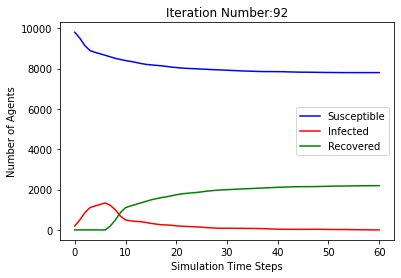

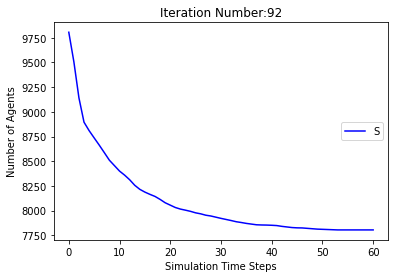

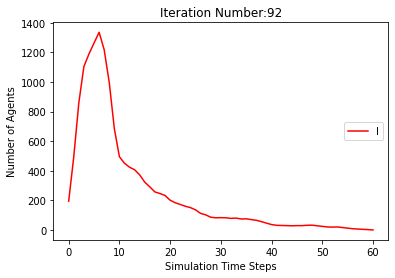

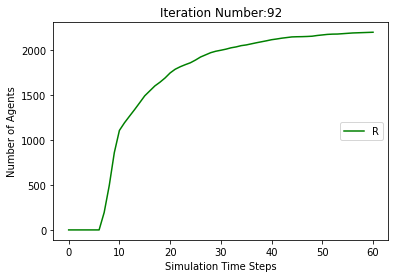

[9806, 9484, 9116, 8914, 8830, 8777, 8720, 8654, 8594, 8537, 8475, 8428, 8375, 8315, 8258, 8210, 8175, 8143, 8107, 8073, 8029, 8005, 7989, 7964, 7952, 7935, 7920, 7909, 7904, 7900, 7897, 7894, 7889, 7885, 7879, 7877, 7875, 7873, 7871, 7869, 7867, 7864, 7861, 7853, 7848, 7844, 7838, 7837, 7836, 7836, 7836, 7836, 7836, 7835, 7835, 7835, 7834, 7833, 7833, 7833, 7833, 7833, 7833, 7831, 7830, 7830, 7830, 7830, 7828, 7826, 7821, 7818, 7816, 7813, 7810, 7805, 7805, 7805, 7805, 7805, 7805, 7805, 7805]
[194, 516, 884, 1086, 1170, 1223, 1280, 1152, 890, 579, 439, 402, 402, 405, 396, 384, 362, 332, 321, 302, 286, 253, 221, 211, 191, 172, 153, 120, 101, 89, 67, 58, 46, 35, 30, 27, 25, 24, 23, 20, 18, 15, 16, 22, 25, 27, 31, 30, 28, 25, 17, 12, 8, 3, 2, 1, 2, 3, 3, 3, 2, 2, 2, 3, 3, 3, 3, 3, 5, 7, 10, 12, 14, 17, 20, 23, 21, 16, 13, 11, 8, 5, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 516, 884, 1086, 1170, 1223, 1280, 1346, 1406, 1463, 1525, 1572, 1625, 1685, 1742, 1790, 1825, 1857, 1893, 1927, 1971, 1995, 2011

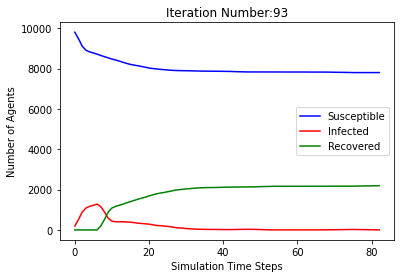

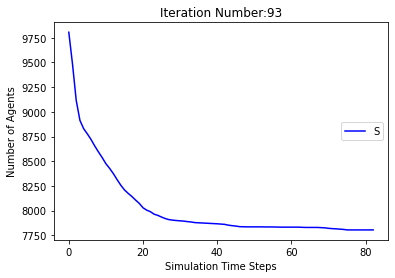

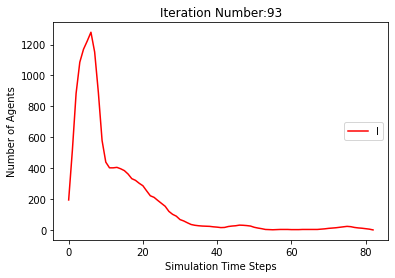

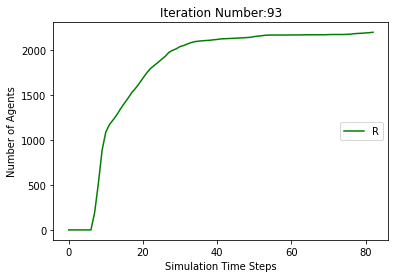

[9806, 9490, 9132, 8889, 8779, 8698, 8624, 8558, 8497, 8445, 8397, 8333, 8266, 8229, 8197, 8164, 8126, 8099, 8080, 8063, 8046, 8029, 8014, 8002, 7993, 7983, 7973, 7962, 7950, 7942, 7934, 7931, 7930, 7927, 7921, 7914, 7908, 7905, 7901, 7900, 7896, 7891, 7884, 7875, 7868, 7860, 7854, 7851, 7848, 7846, 7845, 7845, 7845, 7843, 7843, 7840, 7836, 7833, 7833, 7833, 7833, 7832, 7832, 7832, 7832, 7832, 7831, 7831, 7831, 7830, 7830, 7830, 7830, 7830, 7830, 7830, 7830]
[194, 510, 868, 1111, 1221, 1302, 1376, 1248, 993, 687, 492, 446, 432, 395, 361, 333, 319, 298, 253, 203, 183, 168, 150, 124, 106, 97, 90, 84, 79, 72, 68, 62, 53, 46, 41, 36, 34, 29, 30, 30, 31, 30, 30, 33, 37, 41, 46, 45, 43, 38, 30, 23, 15, 11, 8, 8, 10, 12, 12, 12, 10, 11, 8, 4, 1, 1, 2, 2, 1, 2, 2, 2, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 510, 868, 1111, 1221, 1302, 1376, 1442, 1503, 1555, 1603, 1667, 1734, 1771, 1803, 1836, 1874, 1901, 1920, 1937, 1954, 1971, 1986, 1998, 2007, 2017, 2027, 2038, 2050, 2058, 2066, 2069, 2070

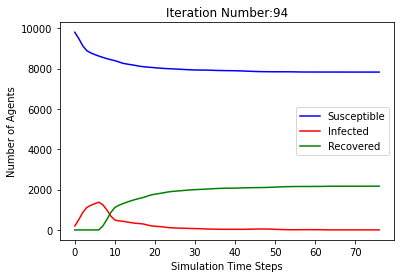

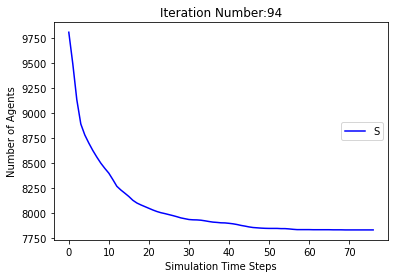

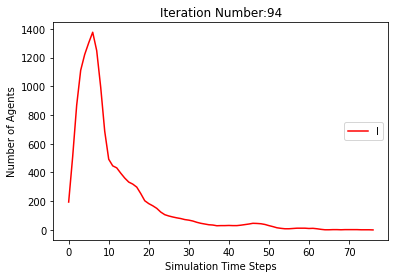

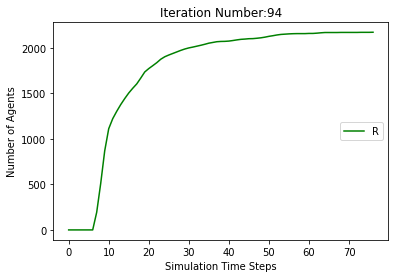

[9806, 9492, 9113, 8875, 8749, 8660, 8556, 8464, 8388, 8321, 8251, 8184, 8125, 8081, 8041, 8014, 7988, 7952, 7914, 7881, 7833, 7792, 7771, 7743, 7717, 7699, 7685, 7673, 7654, 7640, 7628, 7621, 7618, 7617, 7612, 7608, 7603, 7600, 7600, 7599, 7598, 7597, 7596, 7594, 7590, 7589, 7588, 7585, 7582, 7580, 7578, 7578, 7578, 7578, 7577, 7577, 7577, 7576, 7576, 7576, 7576, 7576, 7576, 7576, 7576]
[194, 508, 887, 1125, 1251, 1340, 1444, 1342, 1104, 792, 624, 565, 535, 475, 423, 374, 333, 299, 270, 244, 248, 249, 243, 245, 235, 215, 196, 160, 138, 131, 115, 96, 81, 68, 61, 46, 37, 28, 21, 19, 19, 15, 12, 9, 10, 11, 11, 13, 15, 16, 16, 12, 11, 10, 8, 5, 3, 2, 2, 2, 2, 1, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 508, 887, 1125, 1251, 1340, 1444, 1536, 1612, 1679, 1749, 1816, 1875, 1919, 1959, 1986, 2012, 2048, 2086, 2119, 2167, 2208, 2229, 2257, 2283, 2301, 2315, 2327, 2346, 2360, 2372, 2379, 2382, 2383, 2388, 2392, 2397, 2400, 2400, 2401, 2402, 2403, 2404, 2406, 2410, 2411, 2412, 2415, 2418, 2420, 2422

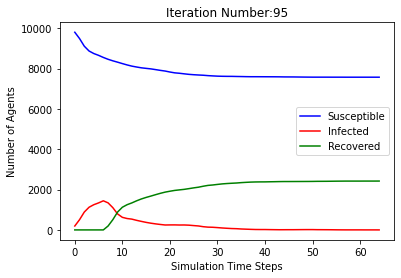

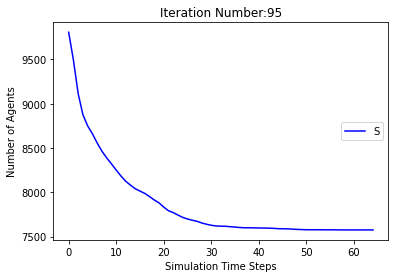

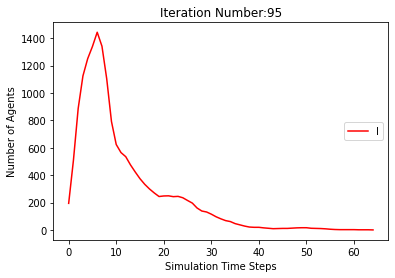

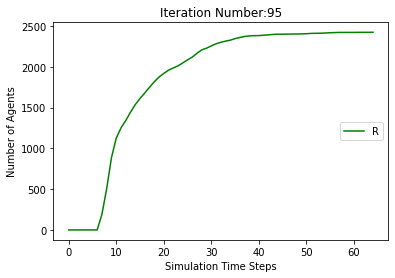

[9806, 9499, 9106, 8877, 8759, 8686, 8608, 8528, 8451, 8372, 8283, 8219, 8179, 8124, 8083, 8056, 8020, 7997, 7976, 7961, 7944, 7923, 7899, 7887, 7863, 7844, 7828, 7814, 7795, 7776, 7766, 7761, 7759, 7754, 7750, 7742, 7734, 7729, 7726, 7721, 7718, 7712, 7705, 7705, 7705, 7705, 7704, 7704, 7703, 7703, 7703, 7703, 7702, 7702, 7702, 7701, 7701, 7700, 7700, 7700, 7696, 7694, 7691, 7687, 7683, 7680, 7680, 7677, 7673, 7672, 7671, 7668, 7667, 7664, 7664, 7663, 7663, 7661, 7661, 7661, 7660, 7660, 7659, 7657, 7656, 7655, 7654, 7653, 7653, 7653, 7652, 7648, 7646, 7645, 7643, 7641, 7636, 7630, 7629, 7629, 7628, 7628, 7628, 7628, 7627, 7626, 7626, 7626, 7625, 7625, 7625, 7625, 7625, 7625, 7625, 7625]
[194, 501, 894, 1123, 1241, 1314, 1392, 1278, 1048, 734, 594, 540, 507, 484, 445, 395, 352, 286, 243, 218, 180, 160, 157, 133, 134, 132, 133, 130, 128, 123, 121, 102, 85, 74, 64, 53, 42, 37, 35, 38, 36, 38, 37, 29, 24, 21, 17, 14, 9, 2, 2, 2, 3, 2, 2, 2, 2, 3, 3, 2, 6, 8, 10, 14, 17, 20, 20, 19, 21, 19

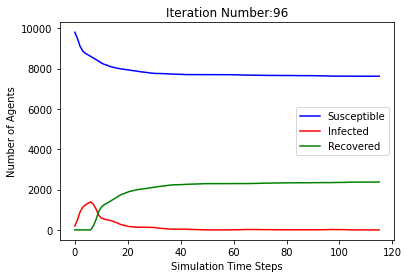

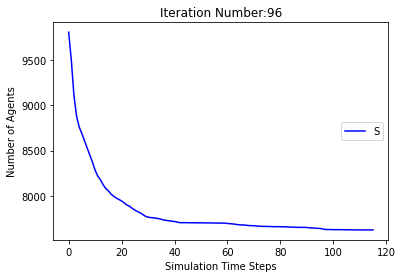

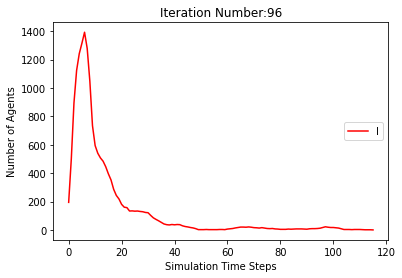

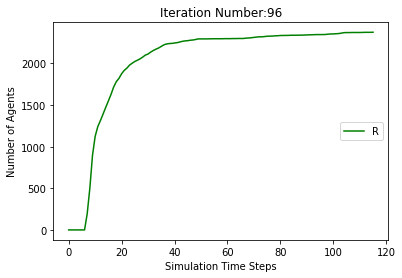

[9806, 9505, 9121, 8894, 8795, 8717, 8650, 8564, 8494, 8427, 8361, 8279, 8209, 8166, 8133, 8100, 8064, 8032, 7995, 7954, 7922, 7901, 7880, 7859, 7840, 7816, 7791, 7778, 7768, 7757, 7755, 7748, 7744, 7734, 7730, 7725, 7720, 7710, 7704, 7699, 7690, 7672, 7660, 7655, 7650, 7646, 7644, 7642, 7636, 7634, 7632, 7629, 7628, 7626, 7621, 7618, 7616, 7616, 7613, 7612, 7611, 7604, 7594, 7585, 7584, 7581, 7577, 7576, 7575, 7573, 7572, 7570, 7569, 7569, 7569, 7569, 7569, 7569, 7569, 7569]
[194, 495, 879, 1106, 1205, 1283, 1350, 1242, 1011, 694, 533, 516, 508, 484, 431, 394, 363, 329, 284, 255, 244, 232, 220, 205, 192, 179, 163, 144, 133, 123, 104, 92, 72, 57, 48, 43, 37, 45, 44, 45, 44, 58, 65, 65, 60, 58, 55, 48, 36, 26, 23, 21, 18, 18, 21, 18, 18, 16, 16, 16, 15, 17, 24, 31, 32, 32, 35, 35, 29, 21, 13, 14, 12, 8, 7, 6, 4, 3, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 495, 879, 1106, 1205, 1283, 1350, 1436, 1506, 1573, 1639, 1721, 1791, 1834, 1867, 1900, 1936, 1968, 2005, 2046, 2078, 2099, 2120, 2141, 2160,

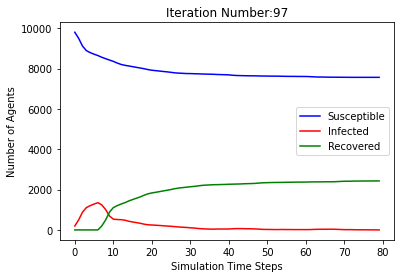

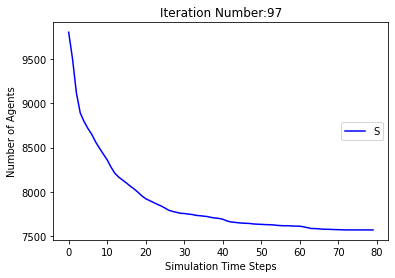

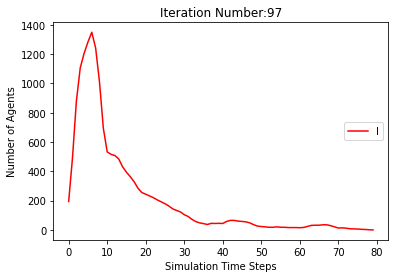

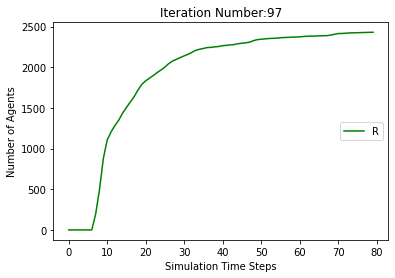

[9806, 9517, 9145, 8904, 8797, 8743, 8684, 8623, 8557, 8494, 8440, 8384, 8341, 8302, 8267, 8234, 8198, 8172, 8150, 8130, 8106, 8081, 8064, 8053, 8049, 8034, 8020, 8013, 8001, 7999, 7992, 7987, 7981, 7971, 7964, 7960, 7956, 7948, 7943, 7941, 7934, 7933, 7929, 7929, 7928, 7928, 7928, 7928, 7928, 7928, 7928, 7928]
[194, 483, 855, 1096, 1203, 1257, 1316, 1183, 960, 651, 464, 413, 402, 382, 356, 323, 296, 268, 234, 211, 196, 186, 170, 145, 123, 116, 110, 93, 80, 65, 61, 62, 53, 49, 49, 41, 43, 44, 44, 40, 37, 31, 31, 27, 20, 15, 13, 6, 5, 1, 1, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 483, 855, 1096, 1203, 1257, 1316, 1377, 1443, 1506, 1560, 1616, 1659, 1698, 1733, 1766, 1802, 1828, 1850, 1870, 1894, 1919, 1936, 1947, 1951, 1966, 1980, 1987, 1999, 2001, 2008, 2013, 2019, 2029, 2036, 2040, 2044, 2052, 2057, 2059, 2066, 2067, 2071, 2071, 2072]
[[], [9806, 9515, 9140, 8897, 8803, 8738, 8666, 8595, 8522, 8450, 8380, 8301, 8229, 8203, 8183, 8150, 8117, 8085, 8054, 8026, 8002, 7977, 7958, 7942, 7933, 7923, 

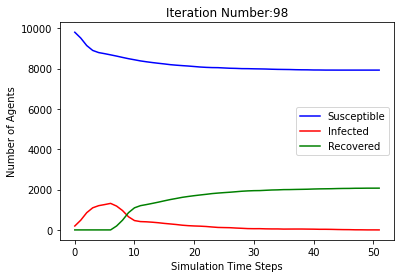

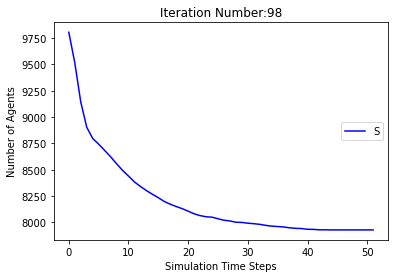

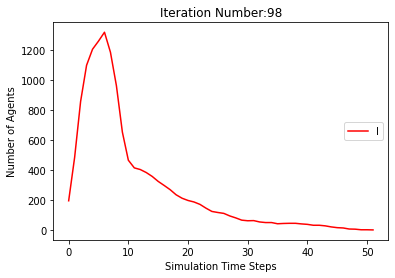

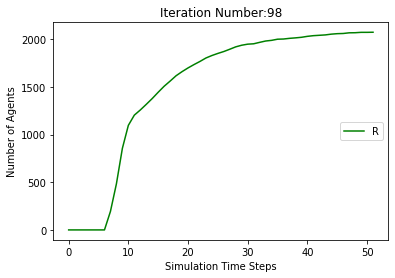

[9806, 9488, 9152, 8919, 8823, 8758, 8697, 8631, 8547, 8455, 8382, 8321, 8257, 8204, 8170, 8126, 8091, 8052, 8016, 7992, 7970, 7949, 7932, 7921, 7905, 7887, 7875, 7866, 7859, 7856, 7855, 7851, 7845, 7838, 7836, 7828, 7820, 7818, 7817, 7810, 7806, 7803, 7802, 7800, 7799, 7798, 7797, 7795, 7790, 7785, 7782, 7780, 7779, 7778, 7776, 7772, 7769, 7768, 7763, 7760, 7757, 7756, 7756, 7755, 7753, 7752, 7749, 7746, 7746, 7745, 7745, 7745, 7744, 7743, 7739, 7738, 7738, 7738, 7738, 7737, 7737, 7737, 7737, 7737, 7737, 7736, 7735, 7734, 7734, 7733, 7732, 7729, 7727, 7725, 7722, 7718, 7712, 7708, 7704, 7701, 7697, 7695, 7692, 7688, 7685, 7685, 7683, 7682, 7678, 7678, 7676, 7673, 7667, 7663, 7661, 7656, 7654, 7652, 7652, 7651, 7648, 7646, 7645, 7644, 7644, 7643, 7643, 7643, 7643, 7643, 7641, 7640, 7639, 7639, 7639, 7638, 7638, 7638, 7637, 7637, 7636, 7635, 7635, 7635, 7635, 7635, 7635, 7635, 7634, 7632, 7632, 7632, 7630, 7630, 7629, 7628, 7627, 7627, 7626, 7626, 7625, 7625, 7624, 7624, 7624, 7624, 762

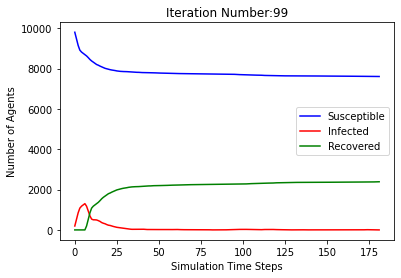

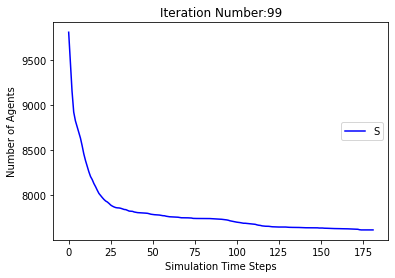

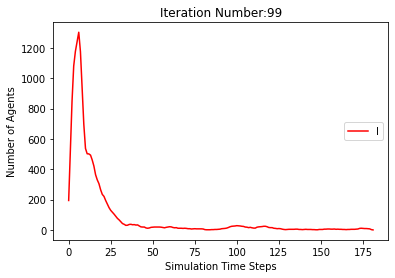

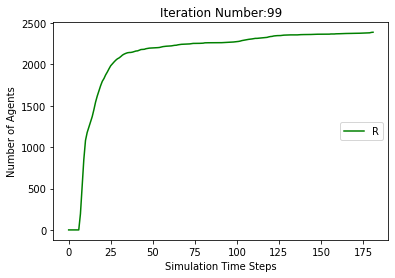

[9806, 9517, 9149, 8914, 8818, 8763, 8699, 8623, 8556, 8487, 8432, 8352, 8272, 8204, 8160, 8122, 8081, 8043, 8004, 7972, 7945, 7927, 7898, 7874, 7860, 7850, 7843, 7833, 7827, 7815, 7807, 7797, 7785, 7772, 7760, 7752, 7744, 7740, 7732, 7727, 7725, 7719, 7718, 7717, 7714, 7713, 7711, 7708, 7703, 7699, 7697, 7697, 7696, 7695, 7695, 7695, 7695, 7695, 7693, 7692, 7690, 7689, 7689, 7689, 7687, 7687, 7687, 7687, 7687, 7687, 7687, 7687]
[194, 483, 851, 1086, 1182, 1237, 1301, 1183, 961, 662, 482, 466, 491, 495, 463, 434, 406, 389, 348, 300, 259, 233, 224, 207, 183, 154, 129, 112, 100, 83, 67, 63, 65, 71, 73, 75, 71, 67, 65, 58, 47, 41, 34, 27, 26, 19, 16, 17, 16, 19, 20, 17, 17, 16, 13, 8, 4, 2, 4, 4, 5, 6, 6, 6, 8, 6, 5, 3, 2, 2, 2, 0]
[0, 0, 0, 0, 0, 0, 0, 194, 483, 851, 1086, 1182, 1237, 1301, 1377, 1444, 1513, 1568, 1648, 1728, 1796, 1840, 1878, 1919, 1957, 1996, 2028, 2055, 2073, 2102, 2126, 2140, 2150, 2157, 2167, 2173, 2185, 2193, 2203, 2215, 2228, 2240, 2248, 2256, 2260, 2268, 2273, 22

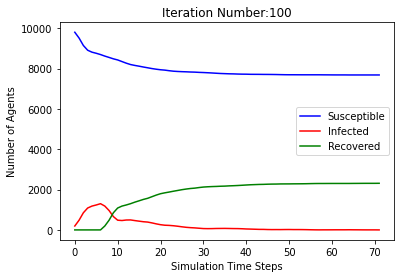

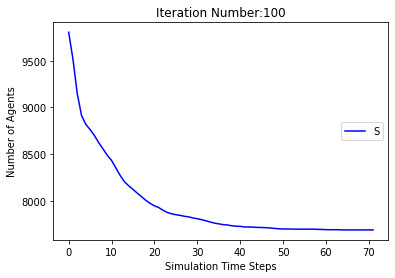

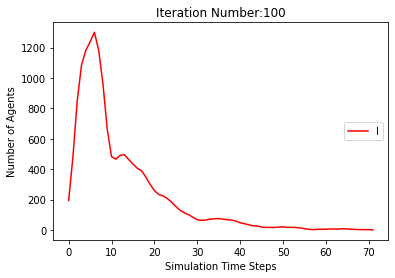

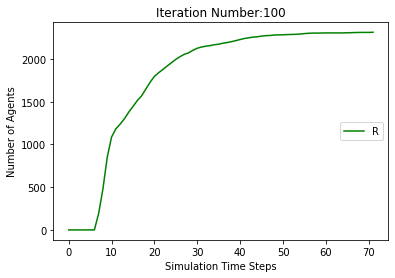

In [13]:
#from numpy import zeros, linspace
#Node_p=Node.copy()
#Node_n=Node.copy() 
#Agent_p=Agent.copy()
#Agent_n=Agent.copy()
#print(Node_p)
#print(Agent_p)
#S,I,R = Count_SIR_Node(Node_n) 
#S1,I1,R1 = Count_SIR_Agent(Agent_n)
#print([S,I,R]) 
#print([S1,I1,R1])
SS,II,RR,TT = [[]],[[]],[[]],[[]]
for i in range(100):
  j=0
  Node_p=Node.copy()
  Node_n=Node.copy() 
  Agent_p=Agent.copy()
  Agent_n=Agent.copy()
  Sj,Ij,Rj = Count_SIR_Node(Node_n) 
  #print([Sj,Ij,Rj]) 
  S,I,R,T = [],[],[],[]
  S.append(Sj)
  I.append(Ij)
  R.append(Rj)
  T.append(j)

  while Ij > 0 :
    Node_p,Node_n,Agent_p,Agent_n = random_walk(Graph,GraphN,Node_n,Agent_n,1,1)
    j+=1 
    #count=0
    #for i in range(len(Node_p)):
    #  count+=len(Node_p[i]) - 4
    #print(count)
    Sj,Ij,Rj = Count_SIR_Node(Node_n) 
    S.append(Sj)
    I.append(Ij)
    R.append(Rj)
    T.append(j)
    #S1,I1,R1 = Count_SIR_Agent(Agent_n)
    #print("Simulation No:",i+1, "Iteration No: ", j)
    #print(Node_n)
    #print(Agent_n)
    #print([Sj,Ij,Rj]) 
    # Plot the data on three separate curves for S(t), I(t) and R(t)
    #print([S1,I1,R1])
  print(S)
  print(I)
  print(R)
  SS.append(S)
  II.append(I)
  RR.append(R)
  TT.append(T)
  print(SS)
  print(II)
  print(RR)
  plt.plot(T, S, 'b', T, I, 'r', T, R, 'g')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Susceptible", "Infected", "Recovered"),loc='center right')
  plt.show()  
  
  plt.plot(T, S, 'b')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Susceptible"),loc='center right')
  plt.show()

  plt.plot(T, I, 'r')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Infected"),loc='center right')
  plt.show()

  plt.plot(T, R, 'g')
  plt.xlabel('Simulation Time Steps')
  plt.title('Iteration Number:'+str(i+1))
  plt.ylabel('Number of Agents')
  plt.legend(("Recovered"),loc='center right')
  plt.show()  

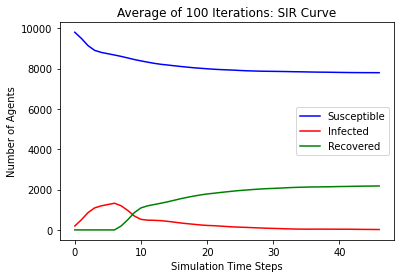

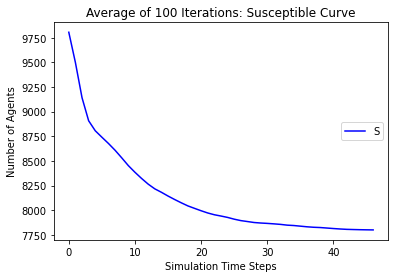

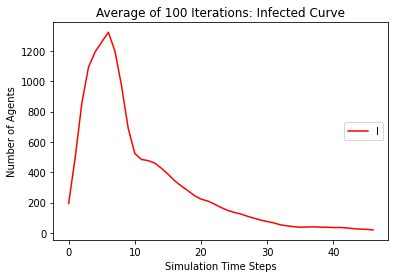

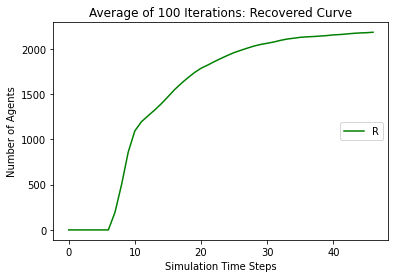

In [14]:
from statistics import mean
SC = SS[1]
IC = II[1]
RC = RR[1]
TC = TT[1]
for i in range(2,100):
  SC = [mean(i) for i in zip(SC,SS[i])] 
  IC = [mean(i) for i in zip(IC,II[i])] 
  RC = [mean(i) for i in zip(RC,RR[i])] 
  TC = [mean(i) for i in zip(TC,TT[i])] 

plt.plot(TC, SC, 'b', TC, IC, 'r', TC, RC, 'g')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: SIR Curve')
plt.ylabel('Number of Agents')
plt.legend(("Susceptible", "Infected", "Recovered"),loc='center right')
plt.show()  
  
plt.plot(TC, SC, 'b')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: Susceptible Curve')
plt.ylabel('Number of Agents')
plt.legend(("Susceptible"),loc='center right')
plt.show()

plt.plot(TC, IC, 'r')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: Infected Curve')
plt.ylabel('Number of Agents')
plt.legend(("Infected"),loc='center right')
plt.show()

plt.plot(TC, RC, 'g')
plt.xlabel('Simulation Time Steps')
plt.title('Average of 100 Iterations: Recovered Curve')
plt.ylabel('Number of Agents')
plt.legend(("Recovered"),loc='center right')
plt.show()  


  
